# KLASIFIKASI STATUS GIZI BALITA MENGGUNAKAN MACHINE LEARNING
## Metodologi CRISP-DM

**Algoritma:** Random Forest & XGBoost  
**Target:** TB/U, BB/TB, BB/U (Model Terpisah)  

---

# TAHAP 1: BUSINESS UNDERSTANDING

## Tujuan
Membangun model ML untuk klasifikasi status gizi balita berdasarkan 3 indikator:
- **TB/U** (Stunting): Tinggi Badan menurut Umur
- **BB/TB** (Wasting): Berat Badan menurut Tinggi Badan
- **BB/U** (Underweight): Berat Badan menurut Umur

## Success Criteria
- Accuracy > 80%, Recall > 75%

In [1]:
# pip install imblearn xgboost optuna openpyxl lightgbm catboost

In [2]:
# IMPORT LIBRARY
import pandas as pd
import numpy as np
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

from scipy import stats
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import (classification_report, confusion_matrix, accuracy_score,
                             precision_score, recall_score, f1_score, roc_auc_score)
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import os

plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)

RANDOM_STATE = 42
print('=' * 70)
print('KLASIFIKASI STATUS GIZI BALITA - METODOLOGI CRISP-DM')
print('=' * 70)
print(f'Tanggal: {datetime.now()}')
print('✓ Library berhasil diimport')

KLASIFIKASI STATUS GIZI BALITA - METODOLOGI CRISP-DM
Tanggal: 2026-01-31 21:30:02.199676
✓ Library berhasil diimport


In [3]:
from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.over_sampling import ADASYN
import optuna
from optuna.samplers import TPESampler

print('✓ Library tambahan untuk advanced techniques berhasil diimport')

✓ Library tambahan untuk advanced techniques berhasil diimport


---
# TAHAP 2: DATA UNDERSTANDING
---

In [4]:
# LOAD DATASET
df = pd.read_excel('data_gizi_balita_terintegrasi_bersih_2.xlsx')
print(f'Dataset: {df.shape[0]} baris, {df.shape[1]} kolom')
df.head()

Dataset: 876 baris, 102 kolom


,Nama Kelurahan yang balita tempati?,Nama Posyandu yang dikunjungi?_kader,Nama Balita,Nama orang tua balita_kader,Umur Balita saat ini (dalam bulan dan tuliskan angka saja)\n\n(Contoh: 16),Tanggal Lahir Balita_kader,Jenis Kelamin Balita,Berat badan balita saat ini (dalam kilogram dan tuliskan angka saja) \n\n(Contoh: 20 atau 20.5 – gunakan tanda titik (.) jika ada angka desimal),Tinggi/Panjang badan balita saat ini (dalam sentimeter dan tuliskan angka saja) \n\n(Contoh: 60 atau 60.5 – gunakan tanda titik (.) jika ada angka desimal),Lingkar kepala balita saat ini (dalam sentimeter dan tuliskan angka saja) \n\n(Contoh: 10 atau 10.5 – gunakan tanda titik (.) jika ada angka desimal),...,Apakah Ibu pernah mendapatkan penyuluhan tentang gizi anak di posyandu/puskesmas?,Seberapa sering Ibu mengikuti kegiatan penyuluhan atau kelas ibu balita?,"Apakah Ibu merasa paham tentang makanan sehat untuk balita (porsi, variasi, dan frekuensi makan)?",Pekerjaan utama kepala keluarga:,"Jumlah anggota rumah tangga (termasuk balita dan tuliskan jumlahnya saja) \n\n(Contoh: 3 jika terdiri dari ayah, ibu, dan balita)",Perkiraan pendapatan bulanan keluarga,Jarak atau waktu tempuh ke pasar/penjual makanan sehat terdekat,"Apakah di keluarga Ibu ada makanan yang tidak boleh dimakan oleh anak (dilarang atau dipantang)?\n\n(Misalnya: tidak boleh makan ikan, telur, daging, atau makanan tertentu karena alasan adat atau kepercayaan)",Siapa yang biasanya menentukan makanan apa yang dimakan oleh anak di rumah?,_metode_matching
0,NaN,NaN,Muhammad ibnu lathiif,Mira purnamasari,54,2021-05-26 00:00:00,Laki-laki,15.5,105.0,47.0,...,Ya,Setahun sekali,Cukup paham,Buruh harian lepas,6,Rp1.000.000 – Rp2.999.999,Kurang dari 10 menit,Tidak,Bersama (Ibu dan Ayah),Nama Balita
1,NaN,NaN,SYAFIQ ZAID,Nova Supriyanty,52,2021-06-26 00:00:00,Laki-laki,15.0,104.0,49.0,...,Ya,Setahun lebih dari sekali,Cukup paham,Pegawai,7,Rp1.000.000 – Rp2.999.999,Kurang dari 10 menit,Tidak,Ibu,Nama Balita
2,NaN,NaN,NOVIA KHOERUNISA,Haer / Reni,12,2024-11-28 00:00:00,Perempuan,7.8,68.0,44.5,...,Ya,Jarang,Cukup paham,Buruh,5,Rp1.000.000 – Rp2.999.999,10 – 30 menit,Tidak,Ibu,Nama Balita
3,NaN,NaN,DEAN ARDIYA YASA,EMPI / DELA,18,2024-05-10 00:00:00,Laki-laki,9.3,76.0,47.0,...,Ya,Jarang,Cukup paham,Spv,3,Rp5.000.000 ke atas,10 – 30 menit,Tidak,Ibu,Nama Balita
4,NaN,NaN,Afiza Ainun Ghania,Deden/Reissa,31,2023-04-15 00:00:00,Perempuan,12.0,82.0,47.0,...,Tidak,Jarang,Paham,Guru,5,Rp3.000.000 – Rp4.999.999,10 – 30 menit,Tidak,Ibu,Nama Balita


In [5]:
# HAPUS KOLOM ADMINISTRATIF
cols_to_drop = [
    'similarity', 'match_type', 'nama_kader', 'nama_orangtua',
    'Timestamp_kader', 'Nama Kelurahan yang balita tempati?',
    'Nama Posyandu yang dikunjungi?_kader', 'Nama Balita',
    'Nama orang tua balita_kader', 'Timestamp_orangtua',
    'Nama Kecamatan yang ditempati?', 'Nama Posyandu yang dikunjungi?_orangtua',
    'Nama orang tua balita_orangtua', 'Nama balita', 'Nama Kelurahan',
    'Nama posyandu yang dikunjungi', 'Tanggal Lahir Balita_orangtua',
    '_metode_matching',
    '_clean_kader', '_clean_orangtua', 'Rekomendasi Gizi Untuk Balita'
]
existing_drops = [c for c in cols_to_drop if c in df.columns]
df.drop(columns=existing_drops, inplace=True, errors='ignore')
print(f'Kolom tersisa: {df.shape[1]}')

Kolom tersisa: 90


In [6]:
import pandas as pd

# Daftar kolom lama Anda
old_columns = [
    'Umur Balita saat ini (dalam bulan dan tuliskan angka saja)\n\n(Contoh: 16)    ', 'Jenis Kelamin Balita ',
    'Berat badan balita saat ini (dalam kilogram dan tuliskan angka saja)  \n\n(Contoh: 20 atau 20.5 – gunakan tanda titik (.) jika ada angka desimal)',
    'Tinggi/Panjang badan balita saat ini (dalam sentimeter  dan tuliskan angka saja)  \n\n(Contoh: 60 atau 60.5 – gunakan tanda titik (.) jika ada angka desimal)',
    'Lingkar kepala balita saat ini (dalam sentimeter  dan tuliskan angka saja)  \n\n(Contoh: 10 atau 10.5 – gunakan tanda titik (.) jika ada angka desimal)',
    'Lingkar lengan atas balita saat ini (LILA) (dalam sentimeter  dan tuliskan angka saja)  \n\n(Contoh: 10 atau 10.5 – gunakan tanda titik (.) jika ada angka desimal)',
    'kondisi berat badan balita saat ini dari 1 bulan lalu?  ', 'Usia kehamilan saat balita lahir (dalam bulan  dan tuliskan angka saja)',
    'Berapa berat badan balita saat lahir? (dalam Kilogram  dan tuliskan angka saja)  \n\n(Contoh: 20 atau 20.5 – gunakan tanda titik (.) jika ada angka desimal)',
    'Berapa tinggi/panjanga badan balita saat lahir? (dalam Sentimeter)  \n\n(Contoh: 60 atau 60.5 – gunakan tanda titik (.) jika ada angka desimal)',
    'Status gizi untuk Tinggi Badan menurut Umur balita?', 'Status gizi untuk Berat Badan menurut Tinggi Badan balita?',
    'Status gizi untuk Berat Badan menurut Umur balita?', 'Apakah berat lahir balita kurang dari 2.5 kg (berat lahir rendah)?  ',
    'Apakah balita lahir prematur (kurang dari 9 bulan)? ', 'Apakah setelah melahirkan, bayi langsung diletakkan di dada ibu dan disusui dalam waktu sekitar satu jam pertama?\n\n(Tindakan ini disebut Inisiasi Menyusui Dini atau IMD)',
    'Apakah saat lahir terdapat komplikasi atau penyakit serius?  ', 'Komplikasi atau penyakit serius apa yang diderita balita saat lahir?',
    'Tinggi badan ibu (dalam sentimeter  dan tuliskan angka saja)\n\n(Contoh: 160 atau 160.5 – gunakan tanda titik (.) jika ada angka desimal)',
    'Berat badan ibu (dalam kilogram dan tuliskan angka saja)  \n\n(Contoh: 60 atau 60.5 – gunakan tanda titik (.) jika ada angka desimal)',
    'Tinggi badan ayah (dalam sentimeter dan tuliskan angka saja)\n\n(Contoh: 160 atau 160.5 – gunakan tanda titik (.) jika ada angka desimal)',
    'Berat badan ayah (dalam kilogram dan tuliskan angka saja)  \n\n(Contoh: 60 atau 60.5 – gunakan tanda titik (.) jika ada angka desimal)',
    'Status gizi ibu saat hamil (berdasarkan catatan kesehatan)  ', 'Apakah ibu pernah didiagnosis anemia oleh tenaga kesehatan?  ',
    'Apakah ibu hamil saat usia di bawah 20 tahun?  ', 'Berapa lama jarak waktu antara kelahiran anak ini dengan kakak atau adiknya?\n\n(Bila anak ini adalah anak pertama, pilih opsi “Anak pertama”)',
    'Apakah ibu mengalami tekanan darah tinggi saat hamil?  ', 'Apakah ibu mengalami gula darah tinggi saat hamil?  ',
    'Apakah selama hamil Ibu pernah mengalami infeksi atau penyakit yang cukup serius?\n\n(Misalnya infeksi saluran kemih, demam tinggi karena infeksi, malaria, atau lainnya)',
    'Apakah ibu rutin mengonsumsi suplemen saat hamil?  ', 'Apakah ibu sedang hamil kembali saat ini?  ',
    'Jika ibu mengonsumsi suplemen, sebutkan frekuensinya (berapa kali dalam seminggu)  ', 'Suplemen apa yang Ibu konsumsi selama hamil atau setelah melahirkan?\n\n(Contohnya: tablet tambah darah, vitamin C, vitamin D, kalsium, atau susu ibu hamil.)',
    'Apakah ibu hamil mengonsumsi Tablet Tambah Darah (TTD) minimal 90 tablet selama kehamilan?  ', 'Apakah bayi mendapat ASI eksklusif selama 6 bulan?  ',
    'Usia balita mulai diberi MP-ASI (bulan)  ', 'Apakah makanan pendamping ASI (MP-ASI) yang diberikan kepada anak mengandung bahan dari hewan, seperti telur, ikan, ayam, atau daging?',
    'Dalam satu hari, berapa kali anak makan makanan utama seperti nasi, bubur, atau MP-ASI buatan rumah?', 'Apakah anak minum susu selain ASI, seperti susu formula, susu cair (UHT), atau susu bubuk biasa?',
    'Jika ya, berapa kali per hari?  (Tuliskan hanya angka saja, contoh: 2)\n\n(Jika tidak kosongkan)', 'Kapan terakhir kali balita mendapat vitamin A?',
    'Apakah anak rutin minum tablet zat besi (tablet berwarna merah)?', 'Apakah anak pernah minum obat cacing dari posyandu, puskesmas, atau apotek?',
    'Apakah anak pernah mendapatkan intervensi gizi dari posyandu atau puskesmas?\n\n(Misalnya: makanan tambahan dari posyandu (PMT), makanan padat gizi untuk anak gizi buruk (RUTF), penyuluhan gizi, atau rujukan ke puskesmas/RS untuk pemeriksaan lebih lanjut)',
    'Jika ya, intervensi gizi apa yang diterima?\n\n(Dapat Memilih Lebih dari 1 jawaban)', 'Vaksin apa saja yang sudah diterima oleh balita?\n\n(Dapat memilih lebih dari satu jawaban)',
    'Apakah balita sakit dalam 2 minggu terakhir (batuk, diare, demam, dll)?  ', 'Jika ya, penyakit apa yang diderita? \n\n(Dapat memilih lebih dari satu jawaban)',
    'Apakah sehari sebelumnya anak mengonsumsi ASI?', 'Apakah kemarin anak makan makanan pokok seperti nasi, bubur, mie, jagung, roti, atau umbi-umbian seperti kentang dan ubi? ',
    'Apakah kemarin anak makan makanan dari kacang-kacangan seperti tempe, tahu, kacang hijau, atau kacang tanah?',
    'Apakah anak kemarin mengonsumsi minuman atau makanan yang terbuat dari susu hewani (seperti susu, yogurt, atau keju)? ',
    'Apakah anak minum susu murni 100%(susu sapi, kambing, atau kerbau) tanpa campuran atau rasa tambahan, seperti cokelat atau gula? \n\n" Susu murni 100% adalah susu yang berasal langsung dari hewan (sapi, kambing, atau kerbau) tanpa dicampur bahan lain seperti air, gula, perasa, atau pengawet.\nContohnya: susu pasteurisasi dalam botol atau kemasan yang bertuliskan “susu segar murni” atau “100% susu sapi”, bukan susu bubuk instan, susu formula, atau susu rasa cokelat/stroberi."',
    'Apakah kemarin anak makan makanan yang mengandung daging, ayam, ikan, atau jeroan? ', 'Apakah kemarin anak makan telur?\n\n(Misalnya telur ayam, telur bebek, atau telur puyuh — bisa direbus, digoreng, atau dicampur ke makanan seperti nasi, bubur)',
    'Apakah anak kemaren makan buah dan sayuran kaya Vitamin A seperti pepaya, mangga, wortel, dan sayuran berdaun hijau gelap seperti bayam, kangkung, daun katuk, daun singkong, daun kelor, brokoli, dan lain-lain? ',
    'Apakah kemarin anak makan buah dan sayur lainnya seperti pisang, jeruk, semangka, kol, buncis, atau terong?', 'Apakah anak sering mengonsumsi makanan/minuman manis berlebihan (permen, cokelat, minuman manis)?  ',
    'Apakah anak pernah mendapatkan bantuan atau makanan tambahan dari posyandu atau puskesmas karena masalah gizi (seperti berat badan kurang)?\n\n(Contohnya: bubur atau makanan tambahan balita dari posyandu, susu formula khusus, atau makanan bergizi siap saji)',
    'Apakah balita pernah dirawat inap?  ', 'Rata-rata jam tidur balita per hari  (Berupa angka saja)\n\n(Contoh: 6 atau 6.5 – gunakan tanda titik (.) jika ada angka desimal)',
    'Berapa lama aktivitas luar ruangan balita per hari?', 'Apakah anak termasuk aktif atau cenderung diam ?  ', 'Apakah ibu bekerja?  ', 'Pengetahuan ibu tentang gizi balita  ',
    'Pola asuh makan balita  ', 'Apakah balita terdaftar dalam kepesertaan BPJS?  ', 'Apakah ada anggota keluarga yang merokok di rumah?  ',
    'Sumber air minum utama di rumah:  ', ' Kualitas air minum  ', 'Jenis sanitasi yang digunakan keluarga:  ', 'Kondisi kebersihan lingkungan rumah  ',
    'Kebiasaan mencuci tangan sebelum memberi makan balita?  ', 'Akses ke fasilitas kesehatan (Posyandu/Puskesmas/Rumah Sakit)  ',
    'Seberapa sering melakukan kunjungan ke Posyandu per bulan  ', 'Apakah balita memiliki penyakit bawaan saat lahir?',
    'Apakah setelah melahirkan Ibu pernah merasa sedih berlebihan, mudah menangis, cemas, atau sulit tidur selama beberapa hari hingga minggu?\n\n(Kondisi ini sering disebut “baby blues” atau perasaan sedih setelah melahirkan)',
    'Dalam beberapa bulan terakhir, apakah Ibu sering merasa sedih berkepanjangan, kehilangan semangat, atau sulit tidur karena banyak pikiran? ',
    '  Pendidikan terakhir Ibu Balita  ', '  Pendidikan terakhir ayah Balita  ', 'Apakah Ibu pernah mendapatkan penyuluhan tentang gizi anak di posyandu/puskesmas?  ',
    'Seberapa sering Ibu mengikuti kegiatan penyuluhan atau kelas ibu balita?  ', '  Apakah Ibu merasa paham tentang makanan sehat untuk balita (porsi, variasi, dan frekuensi makan)?  ',
    'Pekerjaan utama kepala keluarga:  ', 'Jumlah anggota rumah tangga (termasuk balita dan tuliskan jumlahnya saja)  \n\n(Contoh: 3 jika terdiri dari ayah, ibu, dan balita)',
    'Perkiraan pendapatan bulanan keluarga', 'Jarak atau waktu tempuh ke pasar/penjual makanan sehat terdekat ',
    'Apakah di keluarga Ibu ada makanan yang tidak boleh dimakan oleh anak (dilarang atau dipantang)?\n\n(Misalnya: tidak boleh makan ikan, telur, daging, atau makanan tertentu karena alasan adat atau kepercayaan)',
    'Siapa yang biasanya menentukan makanan apa yang dimakan oleh anak di rumah? '
    'Tanggal Lahir Balita_kader'
]

# Dictionary pemetaan nama kolom baru
new_columns_map = {
    old_columns[0]: 'umur_balita_bulan',
    old_columns[1]: 'jenis_kelamin',
    old_columns[2]: 'berat_badan_kg',
    old_columns[3]: 'tinggi_badan_cm',
    old_columns[4]: 'lingkar_kepala_cm',
    old_columns[5]: 'lila_cm',
    old_columns[6]: 'tren_bb_bulan_lalu',
    old_columns[7]: 'usia_kehamilan_lahir',
    old_columns[8]: 'berat_lahir_kg',
    old_columns[9]: 'panjang_lahir_cm',
    old_columns[10]: 'status_gizi_tbu',
    old_columns[11]: 'status_gizi_bbtb',
    old_columns[12]: 'status_gizi_bbu',
    old_columns[13]: 'is_bblr',
    old_columns[14]: 'is_prematur',
    old_columns[15]: 'is_imd',
    old_columns[16]: 'is_komplikasi_lahir',
    old_columns[17]: 'jenis_komplikasi_lahir',
    old_columns[18]: 'tinggi_ibu_cm',
    old_columns[19]: 'berat_ibu_kg',
    old_columns[20]: 'tinggi_ayah_cm',
    old_columns[21]: 'berat_ayah_kg',
    old_columns[22]: 'status_gizi_ibu_hamil',
    old_columns[23]: 'is_anemia_ibu',
    old_columns[24]: 'is_hamil_muda_u20',
    old_columns[25]: 'jarak_kelahiran',
    old_columns[26]: 'is_hipertensi_gestasional',
    old_columns[27]: 'is_diabetes_gestasional',
    old_columns[28]: 'is_infeksi_kehamilan',
    old_columns[29]: 'is_suplemen_kehamilan',
    old_columns[30]: 'is_hamil_lagi',
    old_columns[31]: 'frekuensi_suplemen_minggu',
    old_columns[32]: 'jenis_suplemen_ibu',
    old_columns[33]: 'is_ttd_90_tablet',
    old_columns[34]: 'is_asi_eksklusif',
    old_columns[35]: 'usia_mulai_mpasi',
    old_columns[36]: 'is_mpasi_hewani',
    old_columns[37]: 'frekuensi_makan_utama',
    old_columns[38]: 'is_susu_non_asi',
    old_columns[39]: 'frekuensi_susu_non_asi',
    old_columns[40]: 'terakhir_vitamin_a',
    old_columns[41]: 'is_tablet_besi_anak',
    old_columns[42]: 'is_obat_cacing_anak',
    old_columns[43]: 'is_intervensi_gizi',
    old_columns[44]: 'jenis_intervensi_gizi',
    old_columns[45]: 'riwayat_vaksinasi',
    old_columns[46]: 'is_sakit_2_minggu',
    old_columns[47]: 'jenis_penyakit_balita',
    old_columns[48]: 'konsumsi_asi_h_1',
    old_columns[49]: 'konsumsi_karbohidrat_h_1',
    old_columns[50]: 'konsumsi_kacangan_h_1',
    old_columns[51]: 'konsumsi_susu_hewani_h_1',
    old_columns[52]: 'is_susu_murni_100',
    old_columns[53]: 'konsumsi_daging_ikan_h_1',
    old_columns[54]: 'konsumsi_telur_h_1',
    old_columns[55]: 'konsumsi_vit_a_h_1',
    old_columns[56]: 'konsumsi_buah_sayur_lain_h_1',
    old_columns[57]: 'is_konsumsi_manis_berlebih',
    old_columns[58]: 'is_pernah_pmt',
    old_columns[59]: 'is_pernah_rawat_inap',
    old_columns[60]: 'jam_tidur_harian',
    old_columns[61]: 'durasi_aktivitas_luar',
    old_columns[62]: 'tingkat_aktivitas_anak',
    old_columns[63]: 'is_ibu_bekerja',
    old_columns[64]: 'skor_pengetahuan_ibu',
    old_columns[65]: 'skor_pola_asuh_makan',
    old_columns[66]: 'is_bpjs',
    old_columns[67]: 'is_perokok_di_rumah',
    old_columns[68]: 'sumber_air_minum',
    old_columns[69]: 'kualitas_air_minum',
    old_columns[70]: 'jenis_sanitasi',
    old_columns[71]: 'kebersihan_lingkungan',
    old_columns[72]: 'kebiasaan_cuci_tangan',
    old_columns[73]: 'akses_faskes',
    old_columns[74]: 'frekuensi_posyandu_bulan',
    old_columns[75]: 'is_penyakit_bawaan',
    old_columns[76]: 'is_baby_blues',
    old_columns[77]: 'is_gejala_depresi',
    old_columns[78]: 'pendidikan_ibu',
    old_columns[79]: 'pendidikan_ayah',
    old_columns[80]: 'is_pernah_penyuluhan_gizi',
    old_columns[81]: 'frekuensi_ikut_kelas_ibu',
    old_columns[82]: 'is_paham_makanan_sehat',
    old_columns[83]: 'pekerjaan_kepala_keluarga',
    old_columns[84]: 'jumlah_art',
    old_columns[85]: 'pendapatan_bulanan',
    old_columns[86]: 'jarak_akses_pangan',
    old_columns[87]: 'is_pantangan_makan',
    old_columns[88]: 'pengambil_keputusan_makan'
}

df.rename(columns=new_columns_map, inplace=True)

# Menampilkan hasil pemetaan untuk verifikasi
for old, new in list(new_columns_map.items())[:5]: # Tampilkan 5 pertama
    print(f"Lama: {old[:50]}... \nBaru: {new}\n")

Lama: Umur Balita saat ini (dalam bulan dan tuliskan ang... 
Baru: umur_balita_bulan

Lama: Jenis Kelamin Balita ... 
Baru: jenis_kelamin

Lama: Berat badan balita saat ini (dalam kilogram dan tu... 
Baru: berat_badan_kg

Lama: Tinggi/Panjang badan balita saat ini (dalam sentim... 
Baru: tinggi_badan_cm

Lama: Lingkar kepala balita saat ini (dalam sentimeter  ... 
Baru: lingkar_kepala_cm



In [7]:
kolom_kategori = df.select_dtypes(include=['object']).columns.tolist()
for col in kolom_kategori:
    print(f"--- Kolom: {col} ---")
    print(df[col].unique())
    print(f"Total Nilai Unik: {df[col].nunique()}")
    print("-" * 30 + "\n")

--- Kolom: umur_balita_bulan ---
[54 52 12 18 31 38 41 53 1 16 50 28 11 '39 bulan' 40 44 46 45 56 2 7 34 55
 19 27 35 59 '26 bln' 49 36 43 15 4 21 14 17 32 22 48 13 51 47 42 33
 '12,1 bulan' 0 25 23 10 '28bulan' 37 9 30 24 20 39 5 60 57 29 '20 bulan'
 26 8 12.9 58 3 6 '14 bulan' '44 bulan' 13.1 9.7 12.2 '42 bulan' 558]
Total Nilai Unik: 74
------------------------------

--- Kolom: Tanggal Lahir Balita_kader ---
[datetime.datetime(2021, 5, 26, 0, 0) datetime.datetime(2021, 6, 26, 0, 0)
 datetime.datetime(2024, 11, 28, 0, 0)
 datetime.datetime(2024, 5, 10, 0, 0) datetime.datetime(2023, 4, 15, 0, 0)
 datetime.datetime(2022, 9, 8, 0, 0) datetime.datetime(2022, 9, 23, 0, 0)
 datetime.datetime(2022, 6, 11, 0, 0) datetime.datetime(2021, 6, 7, 0, 0)
 datetime.datetime(2025, 10, 10, 0, 0)
 datetime.datetime(2024, 7, 27, 0, 0) datetime.datetime(2021, 9, 8, 0, 0)
 datetime.datetime(2023, 6, 26, 0, 0)
 datetime.datetime(2024, 12, 10, 0, 0) datetime.datetime(2022, 8, 3, 0, 0)
 datetime.datetime(20

In [8]:
df.rename(columns=new_columns_map, inplace=True)

def kategorisasi_komplikasi(text):
    """
    Mengelompokkan komplikasi lahir berdasarkan sistem organ.
    Input: Teks deskripsi komplikasi
    Output: Kategori (Jantung, Pernapasan, Pencernaan, Lainnya, Normal)
    """
    # Cek data kosong (NaN) atau string kosong
    if pd.isna(text) or str(text).strip() == '':
        return 'Tidak Ada Komplikasi'

    text = str(text).lower()

    # Prioritas 1: Jantung (Kardiovaskular)
    if any(keyword in text for keyword in ['jantung', 'detak']):
        return 'Kelainan Jantung'

    # Prioritas 2: Pernapasan (Respirasi)
    if any(keyword in text for keyword in ['paru', 'napas', 'thorax', 'atsma', 'sesak']):
        return 'Gangguan Pernapasan'

    # Prioritas 3: Pencernaan
    if any(keyword in text for keyword in ['pencernaan', 'usus', 'lambung']):
        return 'Gangguan Pencernaan'

    # Prioritas 4: Lainnya (Darah, Genetik, dll)
    return 'Lainnya'

def kategorisasi_penyakit(text):
    """
    Mengelompokkan penyakit balita 2 minggu terakhir.
    """
    if pd.isna(text):
        return 'Tidak Tahu'

    text = str(text).lower()

    # Cek keyword negatif (tidak sakit)
    if any(x in text for x in ['tidak', 'tdk', 'sehat', 'no']):
        return 'Tidak Sakit'

    # Cek penyakit umum
    if any(x in text for x in ['ispa', 'batuk', 'pilek', 'flu', 'bapil', 'radang']):
        return 'ISPA/Respirasi'
    if any(x in text for x in ['diare', 'mencret', 'sembelit', 'usus']):
        return 'Pencernaan'
    if any(x in text for x in ['demam', 'panas']): # Demam tanpa batuk pilek spesifik
        return 'Demam'
    if any(x in text for x in ['tb', 'tbc', 'paru', 'jantung', 'step', 'malaria']):
        return 'Penyakit Serius/Kronis'

    return 'Lainnya'

# ---------------------------------------------------------
# MENERAPKAN KATEGORISASI KE KOLOM BARU
# ---------------------------------------------------------

# Menerapkan kategori komplikasi lahir
# Kita menggunakan nama kolom BARU yaitu 'jenis_komplikasi_lahir' (hasil rename)
df['kategori_komplikasi_lahir'] = df['jenis_komplikasi_lahir'].apply(kategorisasi_komplikasi)

# Menerapkan kategori penyakit balita (jika diperlukan)
df['kategori_penyakit_balita'] = df['jenis_penyakit_balita'].apply(kategorisasi_penyakit)


# ---------------------------------------------------------
# CEK HASIL
# ---------------------------------------------------------
print("--- Info DataFrame Baru (df) ---")
print(df[['jenis_komplikasi_lahir', 'kategori_komplikasi_lahir']].head(10))

print("\n--- Distribusi Kategori Komplikasi ---")
print(df['kategori_komplikasi_lahir'].value_counts())

--- Info DataFrame Baru (df) ---
  jenis_komplikasi_lahir kategori_komplikasi_lahir
0                    NaN      Tidak Ada Komplikasi
1                    NaN      Tidak Ada Komplikasi
2                    NaN      Tidak Ada Komplikasi
3                    NaN      Tidak Ada Komplikasi
4                    NaN      Tidak Ada Komplikasi
5                    NaN      Tidak Ada Komplikasi
6                    NaN      Tidak Ada Komplikasi
7                    NaN      Tidak Ada Komplikasi
8                    NaN      Tidak Ada Komplikasi
9                    NaN      Tidak Ada Komplikasi

--- Distribusi Kategori Komplikasi ---
kategori_komplikasi_lahir
Tidak Ada Komplikasi    705
Lainnya                 146
Gangguan Pernapasan      18
Kelainan Jantung          6
Gangguan Pencernaan       1
Name: count, dtype: int64


In [9]:
import re

def kategorisasi_frekuensi_suplemen(text):
    """
    Membersihkan kolom frekuensi suplemen menjadi kategori standar.
    Hierarki:
    1. Cek kata kunci negatif (Tidak/Belum)
    2. Cek indikasi harian (Setiap hari/Rutin)
    3. Ekstraksi angka (jika ada angka spesifik)
    4. Sisa (Tidak jelas/Hanya sebut merek)
    """
    # Mengatasi nilai NaN/Kosong
    if pd.isna(text) or str(text).strip() == '':
        return 'Tidak Tahu/Kosong'

    # Normalisasi teks ke huruf kecil
    text = str(text).lower()

    # --- 1. Cek Kata Kunci Negatif ---
    # Jika ada kata tidak, tdk, belum, ngga -> Masuk Tidak Pernah
    negative_keywords = ['tidak', 'tdk', 'belum', 'ngga', 'stop', 'jarang', 'lupa']
    if any(keyword in text for keyword in negative_keywords):
        # Pengecualian: kadang ada yang tulis "tidak lupa minum tiap hari" (jarang, tapi antisipasi)
        # Namun untuk data ini, "tidak" biasanya berarti tidak minum.
        if 'lupa' in text:
            return 'Tidak Tahu/Lupa'
        return 'Tidak Pernah'

    # --- 2. Cek Indikasi Rutin / Harian ---
    # Kata kunci yang menyiratkan 7 hari seminggu
    daily_keywords = ['setiap hari', 'tiap hari', 'rutin', 'sehari', 'daily', '1x1', '2x1', '3x1', 'full']
    if any(keyword in text for keyword in daily_keywords):
        return 'Rutin (Setiap Hari)'

    # --- 3. Ekstraksi Angka ---
    # Mengambil angka pertama yang muncul dalam teks
    numbers = re.findall(r'\d+', text)

    if numbers:
        try:
            num = int(numbers[0])

            # Logika pengelompokan berdasarkan angka
            if num >= 7:
                return 'Rutin (Setiap Hari)' # Termasuk 7, 14, 21, 79 (asumsi typo atau total tablet)
            elif 3 <= num <= 6:
                return 'Sering (3-6 kali/minggu)'
            elif 1 <= num <= 2:
                return 'Jarang (1-2 kali/minggu)'
            elif num == 0:
                return 'Tidak Pernah'
        except:
            pass # Jika error konversi, lanjut ke bawah

    # --- 4. Penanganan Sisa (Ambigu) ---
    # Jika hanya menyebut nama obat (misal: "asam folat") tanpa frekuensi
    # Kita anggap konsumsi ada, tapi frekuensinya tidak jelas.
    if len(text) > 2:
        return 'Konsumsi (Frekuensi Tidak Jelas)'

    return 'Tidak Tahu/Kosong'

# Menerapkan fungsi ke kolom frekuensi
df['kategori_kepatuhan_suplemen'] = df['frekuensi_suplemen_minggu'].apply(kategorisasi_frekuensi_suplemen)

# --- Menampilkan Hasil ---
print("--- Contoh Hasil Mapping ---")
# Menampilkan data asli vs data baru untuk pengecekan
print(df[['frekuensi_suplemen_minggu', 'kategori_kepatuhan_suplemen']].head(15))

print("\n--- Distribusi Kategori Kepatuhan ---")
print(df['kategori_kepatuhan_suplemen'].value_counts())

--- Contoh Hasil Mapping ---
               frekuensi_suplemen_minggu       kategori_kepatuhan_suplemen
0   Susu ibu hamil,asam folat, kalsium,   Konsumsi (Frekuensi Tidak Jelas)
1                            Setiap hari               Rutin (Setiap Hari)
2                                 3 kali          Sering (3-6 kali/minggu)
3                            Setiap hari               Rutin (Setiap Hari)
4                     7 kali setiap hari               Rutin (Setiap Hari)
5                                      7               Rutin (Setiap Hari)
6                                  Tidak                      Tidak Pernah
7                                  Tidak                      Tidak Pernah
8                                      3          Sering (3-6 kali/minggu)
9                           Setiap hari                Rutin (Setiap Hari)
10                         folamil genio  Konsumsi (Frekuensi Tidak Jelas)
11                                 3kali          Sering (3-6 kali/ming

In [10]:

def kategorisasi_jenis_suplemen(text):
    """
    Mengkategorikan suplemen berdasarkan kelengkapan nutrisi vital.
    Prioritas utama: Zat Besi (Tablet Tambah Darah).
    """
    if pd.isna(text) or str(text).strip() == '':
        return 'Tidak Tahu/Kosong'

    text = str(text).lower()

    # 1. Cek Kata Kunci Negatif
    if any(x in text for x in ['tidak', 'tdk', 'stop']):
        if 'tidak ada' in text and len(text) < 15: # Memastikan bukan kalimat panjang
            return 'Tidak Mengonsumsi'
        # Jika teksnya "Tidak mengonsumsi suplemen", return
        if 'tidak mengonsumsi' in text:
            return 'Tidak Mengonsumsi'

    # 2. Deteksi Komponen Nutrisi
    # Zat Besi / TTD (Sangat Penting)
    has_iron = any(x in text for x in ['tambah darah', 'zat besi', 'ttd', 'fe', 'folamil', 'gestiamin', 'vitamom', 'mms'])
    # Catatan: Folamil/Gestiamin/MMS adalah multivitamin yang pasti mengandung zat besi.

    # Asam Folat
    has_folat = any(x in text for x in ['asam folat', 'folamil', 'gestiamin', 'mms'])

    # Kalsium
    has_calcium = any(x in text for x in ['kalsium', 'calcifar', 'mms', 'cdr'])

    # Susu Ibu Hamil
    has_milk = 'susu' in text

    # Indikasi "Semua" atau "Dari Bidan" (Biasanya paket lengkap)
    is_package = any(x in text for x in ['semuanya', 'dari bidan', 'paket'])

    # 3. Penentuan Kategori Hierarkis

    # Kategori 1: Paket Sangat Lengkap (Zat Besi + Asam Folat + Kalsium/Susu)
    if (has_iron and has_folat and (has_calcium or has_milk)) or is_package:
        return 'Lengkap (TTD + Folat + Kalsium/Susu)'

    # Kategori 2: Kombinasi Bagus (Zat Besi + Asam Folat)
    elif has_iron and has_folat:
        return 'Baik (TTD + Asam Folat)'

    # Kategori 3: Standar (Minimal ada Zat Besi/TTD)
    elif has_iron:
        return 'Cukup (Ada Zat Besi/TTD)'

    # Kategori 4: Kurang Zat Besi (Hanya Susu atau Vitamin lain)
    elif has_milk or has_calcium or 'vitamin' in text:
        return 'Kurang (Hanya Susu/Vit Tanpa TTD)'

    # Kategori 5: Lainnya (Buah-buahan, dll)
    elif 'buah' in text or 'madu' in text:
        return 'Alternatif (Non-Medis)'

    else:
        return 'Tidak Mengonsumsi'

# Menerapkan fungsi
df['kategori_nutrisi_ibu'] = df['jenis_suplemen_ibu'].apply(kategorisasi_jenis_suplemen)

# --- Opsional: Membuat Kolom Flagging (Ya/Tidak) untuk Analisis Lebih Dalam ---
# Ini sangat berguna jika nanti Anda ingin menghitung korelasi spesifik
df['flag_minum_ttd'] = df['jenis_suplemen_ibu'].str.lower().apply(
    lambda x: 1 if pd.notna(x) and any(k in x for k in ['tambah darah', 'zat besi', 'folamil']) else 0
)

df['flag_minum_susu'] = df['jenis_suplemen_ibu'].str.lower().apply(
    lambda x: 1 if pd.notna(x) and 'susu' in x else 0
)

# --- Tampilkan Hasil ---
print("--- Sampel Hasil Kategorisasi Suplemen ---")
print(df[['jenis_suplemen_ibu', 'kategori_nutrisi_ibu']].head(10))

print("\n--- Distribusi Kategori Nutrisi ---")
print(df['kategori_nutrisi_ibu'].value_counts())

--- Sampel Hasil Kategorisasi Suplemen ---
                                  jenis_suplemen_ibu  \
0  Asam folat (vitamin untuk pertumbuhan janin), ...   
1  Tablet tambah darah (zat besi), Asam folat (vi...   
2  Tablet tambah darah (zat besi), Asam folat (vi...   
3  Tablet tambah darah (zat besi), Vitamin C, Vit...   
4  Tablet tambah darah (zat besi), Vitamin C, Vit...   
5  Tablet tambah darah (zat besi), Vitamin C, Vit...   
6  Asam folat (vitamin untuk pertumbuhan janin), ...   
7                 Vitamin D, Kalsium, Susu ibu hamil   
8  Tablet tambah darah (zat besi), Vitamin C, Vit...   
9                     Tablet tambah darah (zat besi)   

                   kategori_nutrisi_ibu  
0     Kurang (Hanya Susu/Vit Tanpa TTD)  
1  Lengkap (TTD + Folat + Kalsium/Susu)  
2  Lengkap (TTD + Folat + Kalsium/Susu)  
3  Lengkap (TTD + Folat + Kalsium/Susu)  
4  Lengkap (TTD + Folat + Kalsium/Susu)  
5  Lengkap (TTD + Folat + Kalsium/Susu)  
6     Kurang (Hanya Susu/Vit Tanpa TTD)  
7   

In [11]:
def kategorisasi_mpasi(text):
    """
    Membersihkan data usia mulai MPASI.
    Standar: 6 Bulan.
    """
    # 1. Handle Missing/NaN
    if pd.isna(text) or str(text).strip() == '':
        return 'Tidak Tahu/Kosong'

    text_lower = str(text).lower()

    # 2. Deteksi Kasus Ekstrem (Teks Deskriptif)
    # Jika ada kata "lahir" (pas lahir, sejak lahir) -> Sangat Dini (0 bulan)
    if 'lahir' in text_lower:
        return 'Terlalu Dini (< 6 Bulan)'

    # Jika "Belum", "Tidak", "Blm" -> Belum MPASI
    # (Asumsi bayi saat ini < 6 bulan, atau memang belum dikasih)
    if any(x in text_lower for x in ['belum', 'tidak', 'blm', 'nanti']):
        return 'Belum MPASI'

    # Deteksi kesalahan input berupa Tanggal (misal: Januari 2026)
    # Kita tidak bisa hitung umur tanpa tanggal lahir, jadi anggap invalid
    if any(x in text_lower for x in ['januari', 'februari', 'agustus', '2025', '2026']):
        return 'Data Tidak Valid (Tanggal)'

    # 3. Normalisasi Angka
    # Mengubah "5 1/2" atau "5,5" menjadi format yang bisa dibaca regex
    text_clean = text_lower.replace(',', '.').replace('½', '.5').replace('setengah', '.5')

    # Khusus kasus "kurang" (misal: 6 bulan kurang 2 minggu) -> Anggap 5.something -> Dini
    if 'kurang' in text_clean:
        # Kita manipulasi sedikit stringnya agar nanti terbaca angka di bawah 6
        # Atau return langsung saja
        if '6' in text_clean:
            return 'Terlalu Dini (< 6 Bulan)'

    # 4. Ekstraksi Angka Pertama
    numbers = re.findall(r"[-+]?\d*\.\d+|\d+", text_clean)

    if numbers:
        try:
            val = float(numbers[0])

            # --- Logika Penentuan Kategori ---

            # Kasus 0 - 5.9 bulan
            if val < 6:
                return 'Terlalu Dini (< 6 Bulan)'

            # Kasus Tepat 6 Bulan (termasuk 6.0)
            # Beberapa data mungkin "6 bulan lebih", kita anggap itu on-track (Tepat)
            # Kecuali "6.5" atau mendekati 7, tapi umumnya "6" adalah Tepat.
            elif val == 6 or (6 < val < 7):
                return 'Tepat Waktu (6 Bulan)'

            # Kasus > 7 bulan (Terlambat)
            # Mulai 7 bulan ke atas dianggap terlambat
            elif val >= 7:
                return 'Terlalu Lambat (> 6 Bulan)'

        except ValueError:
            pass

    # Menangani teks angka seperti "enam"
    if 'enam' in text_lower:
        return 'Tepat Waktu (6 Bulan)'

    return 'Tidak Tahu/Kosong'

# --- Penerapan ke DataFrame ---
df['kategori_mpasi'] = df['usia_mulai_mpasi'].apply(kategorisasi_mpasi)

# --- Validasi Hasil ---
print("--- Sampel Data Asli vs Kategori Baru ---")
print(df[['usia_mulai_mpasi', 'kategori_mpasi']].head(15))

print("\n--- Distribusi Kategori MPASI ---")
print(df['kategori_mpasi'].value_counts())

--- Sampel Data Asli vs Kategori Baru ---
   usia_mulai_mpasi              kategori_mpasi
0           6 bulan       Tepat Waktu (6 Bulan)
1           8 bulan  Terlalu Lambat (> 6 Bulan)
2           6 bulan       Tepat Waktu (6 Bulan)
3            6bulan       Tepat Waktu (6 Bulan)
4           6 bulan       Tepat Waktu (6 Bulan)
5                 6       Tepat Waktu (6 Bulan)
6           6 bulan       Tepat Waktu (6 Bulan)
7           6 bulan       Tepat Waktu (6 Bulan)
8           6 bulan       Tepat Waktu (6 Bulan)
9          4 bulan     Terlalu Dini (< 6 Bulan)
10          6 bulan       Tepat Waktu (6 Bulan)
11             6bln       Tepat Waktu (6 Bulan)
12             6bln       Tepat Waktu (6 Bulan)
13          6 bulan       Tepat Waktu (6 Bulan)
14          6 bulan       Tepat Waktu (6 Bulan)

--- Distribusi Kategori MPASI ---
kategori_mpasi
Tepat Waktu (6 Bulan)         786
Terlalu Dini (< 6 Bulan)       56
Terlalu Lambat (> 6 Bulan)     18
Belum MPASI                    10
Tida

In [12]:
def kategorisasi_vitamin_a(text):
    """
    Kategorisasi Kepatuhan Vitamin A.
    Konteks Waktu: Asumsi data diambil Januari 2026.
    Target: Pemberian terakhir harusnya di Bulan AGUSTUS (Semester ini).
    """
    if pd.isna(text) or str(text).strip() == '' or str(text).strip() == '_':
        return 'Tidak Tahu/Lupa'

    text = str(text).lower()

    # 1. Kategori NEGATIF (Belum/Tidak Pernah)
    if any(x in text for x in ['belum', 'tidak', 'blm', 'tdk', 'no']):
        # Pengecualian: "Belum 6 bulan" (Bayi memang belum waktunya)
        if '6 bulan' in text and 'masih' in text:
            return 'Belum Cukup Umur (<6 Bulan)'
        return 'Tidak/Belum Pernah'

    # 2. Kategori TERKINI (Sesuai Jadwal - Agustus 2025)
    # Mencakup bulan Agustus - Desember, atau durasi pendek (minggu/ <6 bulan)
    recent_months = ['agustus', 'september', 'oktober', 'november', 'desember', 'aug']
    if any(x in text for x in recent_months):
        return 'Terkini (Agustus/Semester Ini)'

    if 'minggu' in text: # "2 minggu lalu" -> pasti baru
        return 'Terkini (Agustus/Semester Ini)'

    # Cek angka bulan (misal: "3 bulan lalu")
    if 'bulan' in text or 'bln' in text:
        numbers = re.findall(r'\d+', text)
        if numbers:
            val = int(numbers[0])
            if val <= 5:
                return 'Terkini (Agustus/Semester Ini)'
            elif val >= 6:
                return 'Sudah Lama (> 6 Bulan/Terlewat)'

    # 3. Kategori LAMA/TERLEWAT (Februari 2025 atau lebih lama)
    old_months = ['februari', 'januari', 'maret', 'april', 'mei', 'juni', 'juli', 'pebruari']
    if any(x in text for x in old_months):
        return 'Sudah Lama (> 6 Bulan/Terlewat)'

    if 'tahun' in text: # "Setahun lalu", "Tahun kemarin"
        return 'Sudah Lama (> 6 Bulan/Terlewat)'

    # 4. Kategori AMBIGU TAPI POSITIF (Mengaku Pernah/Rutin tapi waktu tidak jelas)
    # Contoh: "Pas posyandu", "Rutin", "Sesuai jadwal", "Ya", "Imunisasi"
    if any(x in text for x in ['posyandu', 'rutin', 'jadwal', 'imunisasi', 'ya', 'pernah', 'susu']):
        return 'Pernah (Waktu Tidak Jelas)'

    # 5. Kategori LUPA/TIDAK TAHU
    return 'Tidak Tahu/Lupa'

# --- Penerapan ke DataFrame ---
df['kategori_vitamin_a'] = df['terakhir_vitamin_a'].apply(kategorisasi_vitamin_a)

# --- Validasi Hasil ---
print("--- Contoh Mapping Vitamin A ---")
print(df[['terakhir_vitamin_a', 'kategori_vitamin_a']].head(15))

print("\n--- Distribusi Status Vitamin A ---")
print(df['kategori_vitamin_a'].value_counts())

--- Contoh Mapping Vitamin A ---
     terakhir_vitamin_a              kategori_vitamin_a
0          Agustus 2025  Terkini (Agustus/Semester Ini)
1               Agustus  Terkini (Agustus/Semester Ini)
2               Agustus  Terkini (Agustus/Semester Ini)
3                  Lupa                 Tidak Tahu/Lupa
4               Oktober  Terkini (Agustus/Semester Ini)
5               Agustus  Terkini (Agustus/Semester Ini)
6               Agustus  Terkini (Agustus/Semester Ini)
7               Oktober  Terkini (Agustus/Semester Ini)
8               Agustus  Terkini (Agustus/Semester Ini)
9         Belum pernah               Tidak/Belum Pernah
10        bulan kemaren                 Tidak Tahu/Lupa
11            5bln lalu  Terkini (Agustus/Semester Ini)
12  3 bulan ke belakang  Terkini (Agustus/Semester Ini)
13        3 bln yg lalu  Terkini (Agustus/Semester Ini)
14              agustus  Terkini (Agustus/Semester Ini)

--- Distribusi Status Vitamin A ---
kategori_vitamin_a
Terkini (Agustu

In [13]:
def kategorisasi_intervensi(text):
    """
    Mengelompokkan intervensi berdasarkan tingkat urgensi/keparahan.
    Prioritas: Rujukan/RUTF > PMT > Edukasi > Tidak Ada.
    """
    if pd.isna(text) or str(text).strip() == '':
        return 'Tidak Ada Intervensi'

    text = str(text).lower()

    # 1. Level Intensif (Gizi Buruk/Komplikasi)
    # Kata kunci: RUTF, Rujukan, Rumah Sakit, Gizi Buruk
    if any(x in text for x in ['rutf', 'rujukan', 'rumah sakit', 'gizi buruk']):
        return 'Intensif (RUTF/Rujukan)'

    # 2. Level Suplementasi (Gizi Kurang/Pencegahan)
    # Kata kunci: Makanan Tambahan, PMT, Puding, Telur, MBG
    if any(x in text for x in ['makanan tambahan', 'pmt', 'puding', 'telur', 'mbg']):
        return 'Suplementasi (PMT)'

    # 3. Level Preventif (Edukasi)
    if 'edukasi' in text or 'penyuluhan' in text:
        return 'Edukasi Gizi Saja'

    return 'Lainnya/Tidak Jelas'

# --- 1. Menerapkan Kategori Utama ---
df['kategori_intervensi_utama'] = df['jenis_intervensi_gizi'].apply(kategorisasi_intervensi)

# --- 2. Membuat Flagging (Kolom Terpisah Ya/Tidak) ---
# Ini sangat penting karena satu anak bisa dapat PMT DAN Edukasi sekaligus.
# Dengan kolom ini, Anda bisa menghitung korelasi masing-masing program secara independen.

# Cek apakah dapat PMT? (1 = Ya, 0 = Tidak)
df['flag_dapat_pmt'] = df['jenis_intervensi_gizi'].astype(str).str.lower().apply(
    lambda x: 1 if any(k in x for k in ['makanan tambahan', 'pmt', 'puding', 'telur']) else 0
)

# Cek apakah dapat RUTF/Terapi Gizi Buruk?
df['flag_dapat_rutf'] = df['jenis_intervensi_gizi'].astype(str).str.lower().apply(
    lambda x: 1 if 'rutf' in x else 0
)

# Cek apakah dapat Edukasi?
df['flag_dapat_edukasi'] = df['jenis_intervensi_gizi'].astype(str).str.lower().apply(
    lambda x: 1 if 'edukasi' in x else 0
)

# Cek apakah Dirujuk?
df['flag_dirujuk'] = df['jenis_intervensi_gizi'].astype(str).str.lower().apply(
    lambda x: 1 if 'rujukan' in x or 'rumah sakit' in x else 0
)

# --- Tampilkan Hasil ---
print("--- Contoh Mapping Intervensi ---")
print(df[['jenis_intervensi_gizi', 'kategori_intervensi_utama']].head(10))

print("\n--- Distribusi Kategori Utama ---")
print(df['kategori_intervensi_utama'].value_counts())

print("\n--- Statistik Penerima Program (Flagging) ---")
print(f"Total Penerima PMT     : {df['flag_dapat_pmt'].sum()}")
print(f"Total Penerima RUTF    : {df['flag_dapat_rutf'].sum()}")
print(f"Total Penerima Edukasi : {df['flag_dapat_edukasi'].sum()}")
print(f"Total Dirujuk ke RS    : {df['flag_dirujuk'].sum()}")

--- Contoh Mapping Intervensi ---
                      jenis_intervensi_gizi kategori_intervensi_utama
0  Pemberian Makanan Tambahan, Edukasi gizi        Suplementasi (PMT)
1  Pemberian Makanan Tambahan, Edukasi gizi        Suplementasi (PMT)
2                                       NaN      Tidak Ada Intervensi
3  Pemberian Makanan Tambahan, Edukasi gizi        Suplementasi (PMT)
4                Pemberian Makanan Tambahan        Suplementasi (PMT)
5                                       NaN      Tidak Ada Intervensi
6                Pemberian Makanan Tambahan        Suplementasi (PMT)
7                                       NaN      Tidak Ada Intervensi
8                                       NaN      Tidak Ada Intervensi
9                                       NaN      Tidak Ada Intervensi

--- Distribusi Kategori Utama ---
kategori_intervensi_utama
Suplementasi (PMT)         413
Tidak Ada Intervensi       398
Intensif (RUTF/Rujukan)     50
Edukasi Gizi Saja           15
Name: count

In [14]:
def kategorisasi_penyakit_utama(text):
    """
    Menentukan kategori penyakit dominan berdasarkan tingkat risiko/keparahan.
    Urutan Pengecekan: Serius -> Pencernaan -> Pernapasan -> Demam -> Sehat.
    """
    if pd.isna(text) or str(text).strip() == '':
        return 'Tidak Tahu/Kosong'

    text = str(text).lower()

    # 1. Cek Penyakit Serius (TBC, Paru, Kejang/Step)
    if any(x in text for x in ['tb', 'tbc', 'paru', 'step', 'kejang']):
        return 'Penyakit Serius (TBC/Paru/Neurologis)'

    # 2. Cek Pencernaan (Diare sangat berpengaruh pada BB balita)
    # Termasuk: Diare, mencret, sembelit, buang air besar
    if any(x in text for x in ['diare', 'mencret', 'sembelit', 'buang air besar', 'pencernaan']):
        return 'Gangguan Pencernaan (Diare)'

    # 3. Cek ISPA / Pernapasan (Sangat umum)
    # Termasuk: Batuk, pilek, flu, bapil, ispa, sesak, radang
    if any(x in text for x in ['batuk', 'pilek', 'flu', 'bapil', 'ispa', 'sesak', 'radang', 'ingusan']):
        return 'ISPA (Batuk/Pilek)'

    # 4. Cek Demam / Panas (Gejala umum)
    if any(x in text for x in ['demam', 'panas', 'malaria']):
        return 'Demam/Malaria'

    # 5. Cek Kondisi Lainnya (Gigi, Sariawan, ISK)
    if any(x in text for x in ['gigi', 'sariawan', 'kencing', 'kecil']):
        return 'Penyakit Lainnya'

    # 6. Cek Sehat (Negatif)
    # Hati-hati: "Tidak sakit, Diare" harusnya masuk Diare (sudah dicover di atas).
    # Jadi yang sampai di tahap ini hanya sisa "Tidak", "Tidak ada", "Sehat".
    if any(x in text for x in ['tidak', 'tdk', 'sehat', 'aman', 'no']):
        return 'Sehat/Tidak Sakit'

    return 'Lainnya/Tidak Jelas'

# --- Penerapan Kategori Utama ---
df['kategori_penyakit_dominan'] = df['jenis_penyakit_balita'].apply(kategorisasi_penyakit_utama)

# --- Penerapan Flagging (Sangat Penting untuk Multi-Gejala) ---
# Karena satu anak bisa "Batuk DAN Diare", kita butuh kolom terpisah untuk analisis statistik.

# Flag Diare (1=Ya, 0=Tidak)
df['flag_sakit_diare'] = df['jenis_penyakit_balita'].astype(str).str.lower().apply(
    lambda x: 1 if any(k in x for k in ['diare', 'mencret', 'buang air besar']) else 0
)

# Flag ISPA (1=Ya, 0=Tidak)
df['flag_sakit_ispa'] = df['jenis_penyakit_balita'].astype(str).str.lower().apply(
    lambda x: 1 if any(k in x for k in ['batuk', 'pilek', 'flu', 'bapil', 'ispa', 'sesak']) else 0
)

# Flag TBC/Serius (1=Ya, 0=Tidak)
df['flag_sakit_tb_serius'] = df['jenis_penyakit_balita'].astype(str).str.lower().apply(
    lambda x: 1 if any(k in x for k in ['tb', 'tbc', 'paru', 'step']) else 0
)

# --- Validasi Hasil ---
print("--- Sampel Data Asli vs Kategori Baru ---")
print(df[['jenis_penyakit_balita', 'kategori_penyakit_dominan']].head(15))

print("\n--- Distribusi Penyakit Dominan ---")
print(df['kategori_penyakit_dominan'].value_counts())

print("\n--- Detail Kasus Spesifik (Flagging) ---")
print(f"Total Kasus Diare : {df['flag_sakit_diare'].sum()}")
print(f"Total Kasus ISPA  : {df['flag_sakit_ispa'].sum()}")
print(f"Total Kasus TBC   : {df['flag_sakit_tb_serius'].sum()}")

--- Sampel Data Asli vs Kategori Baru ---
       jenis_penyakit_balita    kategori_penyakit_dominan
0                Tidak sakit            Sehat/Tidak Sakit
1                      Pilek           ISPA (Batuk/Pilek)
2                Tidak sakit            Sehat/Tidak Sakit
3       Diare, Demam/Malaria  Gangguan Pencernaan (Diare)
4                Tidak sakit            Sehat/Tidak Sakit
5                      Tidak            Sehat/Tidak Sakit
6                Batuk pilek           ISPA (Batuk/Pilek)
7                Tidak sakit            Sehat/Tidak Sakit
8                Tidak sakit            Sehat/Tidak Sakit
9                Tidak sakit            Sehat/Tidak Sakit
10  demam radang tenggorokan           ISPA (Batuk/Pilek)
11               Tidak sakit            Sehat/Tidak Sakit
12               Batuk pilek           ISPA (Batuk/Pilek)
13             Demam/Malaria                Demam/Malaria
14               Tidak sakit            Sehat/Tidak Sakit

--- Distribusi Penyakit Domin

In [15]:
def kategorisasi_pekerjaan(text):
    """
    Mengelompokkan pekerjaan kepala keluarga berdasarkan sektor & stabilitas ekonomi.
    Prioritas: Tidak Bekerja -> PNS/BUMN -> Ojol -> Buruh Lepas -> Wiraswasta -> Karyawan.
    """
    # 1. Handle Data Kosong/Ambigu
    if pd.isna(text) or str(text).strip() in ['', '-', 'dfhd', 'pe', 'supriyadi 3', '5;']:
        return 'Tidak Diketahui/Lainnya'

    text = str(text).lower()

    # --- LEVEL 1: TIDAK BEKERJA (High Risk) ---
    # Kata kunci: tidak bekerja, menganggur, mencari nafkah, irt (jika jadi KK berarti tidak ada pencari nafkah utama)
    if any(x in text for x in ['tidak bekerja', 'belum bekerja', 'menganggur', 'mencari nafkah', 'mencari napkah', 'ibu rumah tangga', 'irt']):
        return 'Tidak Bekerja'

    # --- LEVEL 2: SEKTOR PEMERINTAH & BUMN (Most Stable) ---
    # Kata kunci: PNS, BUMN, Pemda, PPPK, TNI/Polri (jika ada), Dosen PNS
    if any(x in text for x in ['pns', 'bumn', 'pemda', 'pppk', 'p3k', 'dosen', 'guru']):
        # Catatan: Guru dimasukkan sini atau Karyawan, tapi biasanya dianggap stabil.
        return 'PNS/BUMN/Pemerintah'

    # --- LEVEL 3: GIG ECONOMY / DRIVER (Specific Informal) ---
    # Kata kunci: Ojek, Ojol, Gojek, Grab, Shopee, Driver, Kurir, Sopir (Sopir seringkali harian/mitra)
    if any(x in text for x in ['ojek', 'ojol', 'gojek', 'grab', 'driver', 'kurir', 'sopir', 'supir']):
        return 'Ojek Online/Driver'

    # --- LEVEL 4: BURUH HARIAN / SERABUTAN (Unstable / Low SES) ---
    # Kata kunci: Lepas, Harian, Serabutan, BHL, Kuli, Pemulung, Parkir, Buruh Bangunan
    # Perhatikan: "Buruh" saja bisa ambigu, tapi jika ada "Harian" atau "Lepas" masuk sini.
    keywords_unstable = ['lepas', 'harian', 'serabutan', 'bhl', 'kuli', 'pemulung', 'parkir', 'bangunan', 'butuh'] # butuh = typo buruh
    if any(x in text for x in keywords_unstable):
        return 'Buruh Harian/Serabutan'

    # --- LEVEL 5: WIRASWASTA / PEDAGANG (Variable Income) ---
    # Kata kunci: Wira, Dagang, Jual, Usaha, Bengkel, Toko, Warung, Home Industri, Percetakan
    keywords_wira = ['wira', 'dagang', 'jual', 'usaha', 'bengkel', 'toko', 'warung', 'home', 'cetak', 'bordir', 'alumunium', 'service', 'sepatu', 'montir', 'teknisi']
    if any(x in text for x in keywords_wira):
        return 'Wiraswasta/Pedagang'

    # --- LEVEL 6: KARYAWAN SWASTA / FORMAL (Monthly Salary) ---
    # Kata kunci: Karyawan, Pegawai, Swasta, Pabrik, Security, Satpam, Admin, Spv, Manager
    # Jika sisa "Buruh" yang tidak tertangkap "Harian/Lepas", biasanya masuk sini (Buruh Pabrik Tetap) atau bisa dibuat kategori sendiri.
    # Di sini saya masukkan ke Karyawan/Buruh Tetap.
    keywords_karyawan = ['karyawan', 'pegawai', 'swasta', 'pabrik', 'security', 'satpam', 'scurity', 'admin', 'spv', 'manager', 'staff', 'buruh', 'jurnalis', 'cleaning']
    if any(x in text for x in keywords_karyawan):
        return 'Karyawan Swasta/Buruh Tetap'

    return 'Lainnya'

# --- Penerapan ke DataFrame ---
df['kategori_pekerjaan_kk'] = df['pekerjaan_kepala_keluarga'].apply(kategorisasi_pekerjaan)

# --- Validasi Hasil Mapping ---
print("--- Contoh Mapping Pekerjaan ---")
# Menampilkan variasi unik dan hasil map-nya
sample_jobs = df[['pekerjaan_kepala_keluarga', 'kategori_pekerjaan_kk']].drop_duplicates().head(20)
print(sample_jobs)

print("\n--- Distribusi Kategori Pekerjaan ---")
print(df['kategori_pekerjaan_kk'].value_counts())

--- Contoh Mapping Pekerjaan ---
   pekerjaan_kepala_keluarga        kategori_pekerjaan_kk
0         Buruh harian lepas       Buruh Harian/Serabutan
1                   Pegawai   Karyawan Swasta/Buruh Tetap
2                     Buruh   Karyawan Swasta/Buruh Tetap
3                        Spv  Karyawan Swasta/Buruh Tetap
4                       Guru          PNS/BUMN/Pemerintah
5               Gojek online           Ojek Online/Driver
6            Karyawan swasta  Karyawan Swasta/Buruh Tetap
8                 Wiraswasta          Wiraswasta/Pedagang
9               Ojek online            Ojek Online/Driver
10                wiraswasta          Wiraswasta/Pedagang
11                     Buruh  Karyawan Swasta/Buruh Tetap
14        Buruh Harian Lepas       Buruh Harian/Serabutan
16                  karyawan  Karyawan Swasta/Buruh Tetap
17                    Swasta  Karyawan Swasta/Buruh Tetap
21                      Ojol           Ojek Online/Driver
22         Coffe atau resto            

In [16]:
def kategorisasi_vaksin(text):
    """
    Mengkategorikan status kelengkapan imunisasi.
    Acuan: Kuesioner Checkbox.
    """
    if pd.isna(text) or str(text).strip() == '':
        return 'Tidak Ada Data'

    text = str(text).lower()

    # 1. Kategori: LENGKAP + LANJUTAN (Booster)
    # Jika mengandung kata 'lanjutan', berarti sudah melewati fase dasar
    if 'lanjutan' in text:
        return 'Lengkap (Dasar + Lanjutan)'

    # 2. Kategori: LENGKAP DASAR (Standar Bayi < 1 Tahun Tuntas)
    # Syarat minimal: Sudah Campak/MR DAN sudah DPT 3
    # (Kita gunakan ini sebagai proxy kelengkapan dasar)
    has_mr = any(x in text for x in ['campak', 'mr', 'rubella'])
    has_dpt3 = 'dpt-hb-hib 3' in text

    if has_mr and has_dpt3:
        return 'Lengkap (Dasar)'

    # 3. Kategori: BELUM LENGKAP / PARSIAL
    return 'Belum Lengkap / Parsial'

def hitung_jumlah_vaksin(text):
    """
    Menghitung berapa jenis vaksin yang sudah dicentang.
    """
    if pd.isna(text) or str(text).strip() == '':
        return 0
    # Memisahkan berdasarkan koma dan menghitung itemnya
    items = [x.strip() for x in str(text).split(',')]
    return len(items)

# --- Penerapan ke DataFrame ---
# Membuat Kategori Status
df['kategori_vaksinasi'] = df['riwayat_vaksinasi'].apply(kategorisasi_vaksin)

# Membuat Kolom Jumlah (Count) - Berguna untuk analisis numerik
df['jumlah_vaksin_diterima'] = df['riwayat_vaksinasi'].apply(hitung_jumlah_vaksin)

# --- Validasi Hasil ---
print("--- Sampel Mapping Vaksinasi ---")
print(df[['riwayat_vaksinasi', 'kategori_vaksinasi', 'jumlah_vaksin_diterima']].head(10))

print("\n--- Distribusi Status Vaksinasi ---")
print(df['kategori_vaksinasi'].value_counts())

print("\n--- Rata-rata Jumlah Vaksin per Kategori ---")
print(df.groupby('kategori_vaksinasi')['jumlah_vaksin_diterima'].mean())

--- Sampel Mapping Vaksinasi ---
                                   riwayat_vaksinasi  \
0  Hepatitis B (<24 Jam), BCG, Polio Tetes 1, DPT...   
1  Hepatitis B (<24 Jam), BCG, Polio Tetes 1, DPT...   
2  Hepatitis B (<24 Jam), BCG, Polio Tetes 1, DPT...   
3  Hepatitis B (<24 Jam), BCG, Polio Tetes 1, DPT...   
4  Hepatitis B (<24 Jam), BCG, Polio Tetes 1, DPT...   
5  Hepatitis B (<24 Jam), BCG, Polio Tetes 1, DPT...   
6  Hepatitis B (<24 Jam), BCG, Polio Tetes 1, DPT...   
7                         Hepatitis B (<24 Jam), BCG   
8  BCG, Polio Tetes 1, DPT-HB-Hib 1, Polio Tetes ...   
9                              Hepatitis B (<24 Jam)   

           kategori_vaksinasi  jumlah_vaksin_diterima  
0  Lengkap (Dasar + Lanjutan)                      17  
1             Lengkap (Dasar)                      10  
2     Belum Lengkap / Parsial                       8  
3             Lengkap (Dasar)                      16  
4  Lengkap (Dasar + Lanjutan)                      20  
5             

In [17]:
# 1. Konversi Kolom Tanggal Lahir ke Format Datetime
# 'errors=coerce' akan mengubah data yang formatnya ngaco menjadi NaT (Not a Time)
# Pastikan nama kolom 'Tanggal Lahir Balita_kader' sesuai dengan data Anda
df['tgl_lahir_format'] = pd.to_datetime(df['Tanggal Lahir Balita_kader'], errors='coerce')

# 2. Menentukan Tanggal Referensi (Cut-off Date)
# Kita set ke akhir bulan Desember 2025 sesuai permintaan
cutoff_date = pd.Timestamp('2025-12-31')

# 3. Menghitung Umur dalam Bulan
# Rumus: (Tanggal Cutoff - Tanggal Lahir) dalam hari, lalu bagi rata-rata hari per bulan (30.44)
df['umur_balita'] = (cutoff_date - df['tgl_lahir_format']).dt.days / 30.44

# 4. Membersihkan Hasil
# Membulatkan ke bawah (floor) untuk mendapatkan "Bulan Penuh" (Completed Months)
# Contoh: 5.9 bulan akan dihitung 5 bulan (belum genap 6)
df['umur_balita'] = np.floor(df['umur_balita'])

# Menangani nilai negatif (jika ada input tanggal lahir > Des 2025 / Typo tahun)
df.loc[df['umur_balita'] < 0, 'umur_balita'] = np.nan

# --- Cek Hasil ---
print("--- Perbandingan Tanggal Lahir & Umur Hitung (Des 2025) ---")
print(df[['Tanggal Lahir Balita_kader', 'tgl_lahir_format', 'umur_balita']].head(10))

# Opsional: Melihat statistik umur
print("\n--- Statistik Umur (Bulan) ---")
print(df['umur_balita'].describe())

--- Perbandingan Tanggal Lahir & Umur Hitung (Des 2025) ---
  Tanggal Lahir Balita_kader tgl_lahir_format  umur_balita
0        2021-05-26 00:00:00       2021-05-26         55.0
1        2021-06-26 00:00:00       2021-06-26         54.0
2        2024-11-28 00:00:00       2024-11-28         13.0
3        2024-05-10 00:00:00       2024-05-10         19.0
4        2023-04-15 00:00:00       2023-04-15         32.0
5        2022-09-08 00:00:00       2022-09-08         39.0
6        2022-09-23 00:00:00       2022-09-23         39.0
7        2022-06-11 00:00:00       2022-06-11         42.0
8        2021-06-07 00:00:00       2021-06-07         54.0
9        2025-10-10 00:00:00       2025-10-10          2.0

--- Statistik Umur (Bulan) ---
count    875.000000
mean      32.317714
std       16.042552
min        0.000000
25%       19.000000
50%       33.000000
75%       46.000000
max       62.000000
Name: umur_balita, dtype: float64


In [18]:
df.drop(columns=['_nama_clean_kader','_nama_clean_orangtua', '_tgl_clean_kader','_tgl_clean_orangtua', 'umur_balita_bulan' ], inplace=True, errors='ignore')

In [19]:
print('kategori tinggi badan menurut umur: ', df['status_gizi_tbu'].unique())
print('kategori berat badan menurut tinggi badan: ',df['status_gizi_bbtb'].unique())
print('kategori berat badan menurut umur: ',df['status_gizi_bbu'].unique())

kategori tinggi badan menurut umur:  ['Normal' 'Pendek' 'Sangat Pendek' 'Tinggi']
kategori berat badan menurut tinggi badan:  ['Gizi Baik' 'Gizi Kurang' 'Gizi Buruk' 'Gizi Lebih']
kategori berat badan menurut umur:  ['Berat Badan Normal' 'Berat Badan Kurang' 'Berat Badan Sangat Kurang'
 'Berat Badan Lebih']


In [20]:
# DEFINISI VARIABEL TARGET (gunakan nama kolom baru setelah rename)
TARGET_TBU = 'status_gizi_tbu'
TARGET_BBTB = 'status_gizi_bbtb'
TARGET_BBU = 'status_gizi_bbu'

target_info = {
    'TB/U': {'column': TARGET_TBU, 'indicator': 'Stunting'},
    'BB/TB': {'column': TARGET_BBTB, 'indicator': 'Wasting'},
    'BB/U': {'column': TARGET_BBU, 'indicator': 'Underweight'}
}

print('DISTRIBUSI VARIABEL TARGET (SEBELUM MERGE)')
print('=' * 50)
for name, info in target_info.items():
    if info['column'] in df.columns:
        print(f"\n{name} ({info['indicator']}):")
        print(df[info['column']].value_counts())

DISTRIBUSI VARIABEL TARGET (SEBELUM MERGE)

TB/U (Stunting):
status_gizi_tbu
Normal           742
Pendek           102
Sangat Pendek     20
Tinggi            12
Name: count, dtype: int64

BB/TB (Wasting):
status_gizi_bbtb
Gizi Baik      734
Gizi Kurang     74
Gizi Lebih      58
Gizi Buruk      10
Name: count, dtype: int64

BB/U (Underweight):
status_gizi_bbu
Berat Badan Normal           738
Berat Badan Kurang            76
Berat Badan Lebih             46
Berat Badan Sangat Kurang     16
Name: count, dtype: int64


In [21]:
# VERIFIKASI KATEGORI TARGET SETELAH RENAME
print('Verifikasi Kategori Target Setelah Rename Kolom:')
print('=' * 70)
print('kategori tinggi badan menurut umur: ', df['status_gizi_tbu'].unique())
print('kategori berat badan menurut tinggi badan: ', df['status_gizi_bbtb'].unique())
print('kategori berat badan menurut umur: ', df['status_gizi_bbu'].unique())
print('✓ Kolom target berhasil direname dan data tetap utuh')

Verifikasi Kategori Target Setelah Rename Kolom:
kategori tinggi badan menurut umur:  ['Normal' 'Pendek' 'Sangat Pendek' 'Tinggi']
kategori berat badan menurut tinggi badan:  ['Gizi Baik' 'Gizi Kurang' 'Gizi Buruk' 'Gizi Lebih']
kategori berat badan menurut umur:  ['Berat Badan Normal' 'Berat Badan Kurang' 'Berat Badan Sangat Kurang'
 'Berat Badan Lebih']
✓ Kolom target berhasil direname dan data tetap utuh


In [22]:
# =============================================================================
# VERIFIKASI DISTRIBUSI KELAS TARGET
# =============================================================================
print('DISTRIBUSI KELAS TARGET (TANPA PENGGABUNGAN)')
print('=' * 70)
print('Semua kelas asli dipertahankan untuk integritas penelitian\n')

# Gunakan data asli tanpa penggabungan
df_merged = df.copy()

# TB/U: Tampilkan distribusi asli
if TARGET_TBU in df_merged.columns:
    print(f'TB/U: {df_merged[TARGET_TBU].nunique()} kelas')
    print(df_merged[TARGET_TBU].value_counts())
    print()

# BB/TB: Tampilkan distribusi asli
if TARGET_BBTB in df_merged.columns:
    print(f'BB/TB: {df_merged[TARGET_BBTB].nunique()} kelas')
    print(df_merged[TARGET_BBTB].value_counts())
    print()

# BB/U: Tampilkan distribusi asli
if TARGET_BBU in df_merged.columns:
    print(f'BB/U: {df_merged[TARGET_BBU].nunique()} kelas')
    print(df_merged[TARGET_BBU].value_counts())
    print()

print('✓ Semua kelas asli dipertahankan - TIDAK ADA PENGGABUNGAN')

DISTRIBUSI KELAS TARGET (TANPA PENGGABUNGAN)
Semua kelas asli dipertahankan untuk integritas penelitian

TB/U: 4 kelas
status_gizi_tbu
Normal           742
Pendek           102
Sangat Pendek     20
Tinggi            12
Name: count, dtype: int64

BB/TB: 4 kelas
status_gizi_bbtb
Gizi Baik      734
Gizi Kurang     74
Gizi Lebih      58
Gizi Buruk      10
Name: count, dtype: int64

BB/U: 4 kelas
status_gizi_bbu
Berat Badan Normal           738
Berat Badan Kurang            76
Berat Badan Lebih             46
Berat Badan Sangat Kurang     16
Name: count, dtype: int64

✓ Semua kelas asli dipertahankan - TIDAK ADA PENGGABUNGAN


---
# TAHAP 3: DATA PREPARATION
---

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt


print('FEATURE ENGINEERING PIPELINE')
print('=' * 70)

if 'df_clean' not in locals():
    df_featured = df.copy()
else:
    df_featured = df_clean.copy()

print("1. [BASIC CLEANING] Memastikan Tipe Data Numerik...")

# Daftar kolom yang wajib numerik untuk perhitungan selanjutnya
cols_to_ensure_numeric = [
    'umur_balita', 'berat_badan_kg', 'tinggi_badan_cm',
    'lingkar_kepala_cm', 'lila_cm', 'usia_kehamilan_lahir',
    'berat_lahir_kg', 'panjang_lahir_cm', 'tinggi_ibu_cm',
    'berat_ibu_kg', 'tinggi_ayah_cm', 'berat_ayah_kg',
    'frekuensi_susu_non_asi', 'usia_mulai_mpasi',
    'jam_tidur_harian', 'jumlah_art', 'pendapatan_bulanan' # Tambahkan pendapatan jika perlu cleaning
]

# Filter hanya kolom yang benar-benar ada di dataframe
cols_to_ensure_numeric = [col for col in cols_to_ensure_numeric if col in df_featured.columns]

for col in cols_to_ensure_numeric:
    # Paksa konversi ke numeric (teks jadi NaN)
    df_featured[col] = pd.to_numeric(df_featured[col], errors='coerce')

    # Isi NaN dengan Median (Strategi sederhana yang aman)
    if df_featured[col].isnull().any():
        median_val = df_featured[col].median()
        df_featured[col].fillna(median_val, inplace=True)
        # print(f'   > Imputasi Median pada {col}: {median_val}')

print(f"   ✓ Sukses membersihkan {len(cols_to_ensure_numeric)} kolom numerik.")


# ==============================================================================
# BAGIAN 2: BASIC FEATURE ENGINEERING (ANTROPOMETRI)
# ==============================================================================
print("\n2. [BASIC FE] Membuat Fitur Turunan Antropometri...")

# Deteksi otomatis nama kolom
bb_cols = [c for c in df_featured.columns if 'berat' in str(c).lower() and 'status' not in str(c).lower() and 'lahir' not in str(c).lower() and 'ibu' not in str(c).lower()]
tb_cols = [c for c in df_featured.columns if 'tinggi' in str(c).lower() and 'status' not in str(c).lower() and 'lahir' not in str(c).lower() and 'ibu' not in str(c).lower()]
umur_cols = [c for c in df_featured.columns if 'umur_balita' in str(c).lower()]

# Ambil kolom utama (prioritas yang namanya paling pendek/relevan)
bb_col = 'berat_badan_kg' if 'berat_badan_kg' in df_featured.columns else (bb_cols[0] if bb_cols else None)
tb_col = 'tinggi_badan_cm' if 'tinggi_badan_cm' in df_featured.columns else (tb_cols[0] if tb_cols else None)
umur_col = 'umur_balita' if 'umur_balita' in df_featured.columns else (umur_cols[0] if umur_cols else None)

# --- A. Rasio BB/TB ---
if bb_col and tb_col:
    df_featured['rasio_bb_tb'] = df_featured[bb_col] / (df_featured[tb_col] + 0.01)
    print(f'   ✓ Rasio BB/TB dibuat')

# --- B. BMI (Body Mass Index) Like ---
if bb_col and tb_col:
    # Rumus BMI: Kg / m^2
    df_featured['bmi_anak'] = df_featured[bb_col] / ((df_featured[tb_col] / 100) ** 2 + 0.01)
    print(f'   ✓ BMI Anak dibuat')

# --- C. Interaksi Pertumbuhan (Growth Velocity Proxy) ---
if umur_col:
    if bb_col:
        df_featured['laju_bb_umur'] = df_featured[bb_col] / (df_featured[umur_col] + 1) # +1 hindari div by zero (umur 0)
    if tb_col:
        df_featured['laju_tb_umur'] = df_featured[tb_col] / (df_featured[umur_col] + 1)
    print(f'   ✓ Laju Pertumbuhan (BB/U dan TB/U) dibuat')

# --- D. Polynomial Features (Kuadrat) ---
# Berguna menangkap hubungan non-linear (misal: berat badan naik eksponensial lalu melambat)
if bb_col:
    df_featured[f'{bb_col}_sq'] = df_featured[bb_col] ** 2
if tb_col:
    df_featured[f'{tb_col}_sq'] = df_featured[tb_col] ** 2
print(f'   ✓ Fitur Polinomial (Kuadrat) dibuat')


# ==============================================================================
# BAGIAN 3: ADVANCED FEATURE ENGINEERING (SKOR KOMPOSIT)
# ==============================================================================
print("\n3. [ADVANCED FE] Membuat Skor Komposit (Gizi & Lingkungan)...")

# --- A. Dietary Diversity Score (DDS) ---
diet_cols = [
    'konsumsi_karbohidrat_h_1', 'konsumsi_kacangan_h_1', 'konsumsi_susu_hewani_h_1',
    'konsumsi_daging_ikan_h_1', 'konsumsi_telur_h_1', 'konsumsi_vit_a_h_1',
    'konsumsi_buah_sayur_lain_h_1'
]
# Pastikan kolom ada
diet_cols = [c for c in diet_cols if c in df_featured.columns]

if diet_cols:
    def map_binary(val):
        return 1 if 'ya' in str(val).lower() else 0

    temp_diet = pd.DataFrame()
    for c in diet_cols:
        temp_diet[c] = df_featured[c].apply(map_binary)

    df_featured['score_dietary_diversity'] = temp_diet.sum(axis=1)
    print(f'   ✓ Skor Keragaman Pangan (DDS) dibuat')

# --- B. Socio-Economic Score (SES) ---
# Mapping Pendidikan
edu_map = {
    'Tidak sekolah': 0, 'SD/sederajat': 1, 'SMP/sederajat': 2,
    'SMA/sederajat': 3, 'Diploma (D1–D3)': 4, 'S1': 5, 'S2': 6, 'S3': 6
}
if 'pendidikan_ibu' in df_featured.columns and 'pendidikan_ayah' in df_featured.columns:
    s_ibu = df_featured['pendidikan_ibu'].map(edu_map).fillna(1)
    s_ayah = df_featured['pendidikan_ayah'].map(edu_map).fillna(1)
    df_featured['score_edu_parents'] = s_ibu + s_ayah
    print(f'   ✓ Skor Pendidikan Orang Tua dibuat')

# Economic Burden
if 'jumlah_art' in df_featured.columns and 'pendapatan_bulanan' in df_featured.columns:
    # Mapping pendapatan tekstual ke ordinal sederhana 1-5
    def map_inc(val):
        s = str(val).lower()
        if 'kurang' in s or '<' in s: return 1
        if '1.000' in s: return 2
        if '3.000' in s: return 3
        if '5.000' in s: return 4
        if 'lebih' in s or '>' in s: return 5
        return 1

    inc_score = df_featured['pendapatan_bulanan'].apply(map_inc)
    df_featured['score_income_level'] = inc_score
    # Rasio beban: Jumlah Orang / Level Pendapatan
    df_featured['ratio_economic_burden'] = df_featured['jumlah_art'] / (inc_score + 0.1)
    print(f'   ✓ Rasio Beban Ekonomi dibuat')
    # Drop the original 'pendapatan_bulanan' column as its information is now captured in new features
    df_featured.drop(columns=['pendapatan_bulanan'], inplace=True, errors='ignore')
    print(f'   ✓ Kolom pendapatan_bulanan asli dihapus')

# --- C. Risk Scores ---
# Hygiene Score
if 'sumber_air_minum' in df_featured.columns: # Cek satu kolom representatif
    def map_env(row):
        s = 0
        # Logika sederhana: Tambah skor jika berisiko
        if 'sungai' in str(row.get('sumber_air_minum', '')).lower(): s += 2
        if 'sungai' in str(row.get('jenis_sanitasi', '')).lower(): s += 2
        if 'ya' in str(row.get('is_perokok_di_rumah', '')).lower(): s += 1
        return s
    df_featured['score_environmental_risk'] = df_featured.apply(map_env, axis=1)
    print(f'   ✓ Skor Risiko Lingkungan dibuat')

# Maternal Risk
if 'is_bblr' in df_featured.columns:
    def map_maternal(row):
        s = 0
        if str(row.get('is_bblr','')) == 'Ya': s += 2
        if str(row.get('is_prematur','')) == 'Ya': s += 2
        if str(row.get('is_anemia_ibu','')) == 'Ya': s += 1
        return s
    df_featured['score_maternal_risk'] = df_featured.apply(map_maternal, axis=1)
    print(f'   ✓ Skor Risiko Ibu & Lahir dibuat')

FEATURE ENGINEERING PIPELINE
1. [BASIC CLEANING] Memastikan Tipe Data Numerik...
   ✓ Sukses membersihkan 17 kolom numerik.

2. [BASIC FE] Membuat Fitur Turunan Antropometri...
   ✓ Rasio BB/TB dibuat
   ✓ BMI Anak dibuat
   ✓ Laju Pertumbuhan (BB/U dan TB/U) dibuat
   ✓ Fitur Polinomial (Kuadrat) dibuat

3. [ADVANCED FE] Membuat Skor Komposit (Gizi & Lingkungan)...
   ✓ Skor Keragaman Pangan (DDS) dibuat
   ✓ Skor Pendidikan Orang Tua dibuat
   ✓ Rasio Beban Ekonomi dibuat
   ✓ Kolom pendapatan_bulanan asli dihapus
   ✓ Skor Risiko Lingkungan dibuat
   ✓ Skor Risiko Ibu & Lahir dibuat


In [24]:
# DATA CLEANING - IMPUTASI TANPA MENGHAPUS DATA
print('DATA CLEANING - STRATEGI IMPUTASI TANPA PENGHAPUSAN')
print('=' * 70)

df_clean = df_merged.copy()
print(f'Total sampel: {len(df_clean)}')
print(f'Missing values sebelum imputasi: {df_clean.isnull().sum().sum()}')

# Identifikasi kolom numerik dan kategorikal
num_cols = df_clean.select_dtypes(include=[np.number]).columns
cat_cols = df_clean.select_dtypes(include=['object']).columns

# IMPUTASI NUMERIK dengan MEDIAN per Grup Target
print('\n--- IMPUTASI NUMERIK (MEDIAN) ---')
for col in num_cols:
    if df_clean[col].isnull().sum() > 0:
        # Isi dengan median global jika tidak ada target
        df_clean[col].fillna(df_clean[col].median(), inplace=True)
        print(f'  {col}: {df_clean[col].isnull().sum()} missing → terisi')

# IMPUTASI KATEGORIKAL dengan MODUS
print('\n--- IMPUTASI KATEGORIKAL (MODUS) ---')
for col in cat_cols:
    if df_clean[col].isnull().sum() > 0:
        df_clean[col].fillna(df_clean[col].mode()[0], inplace=True)
        print(f'  {col[:40]}: {df_clean[col].isnull().sum()} missing → terisi')

print(f'\nMissing values setelah imputasi: {df_clean.isnull().sum().sum()}')
print(f'Total sampel dipertahankan: {len(df_clean)} (0 baris terhapus)')
print('\n✓ Data cleaning selesai - SEMUA DATA DIPERTAHANKAN')


DATA CLEANING - STRATEGI IMPUTASI TANPA PENGHAPUSAN
Total sampel: 876
Missing values sebelum imputasi: 1440

--- IMPUTASI NUMERIK (MEDIAN) ---
  frekuensi_susu_non_asi: 0 missing → terisi
  umur_balita: 0 missing → terisi

--- IMPUTASI KATEGORIKAL (MODUS) ---
  jenis_komplikasi_lahir: 0 missing → terisi
  jarak_kelahiran: 0 missing → terisi
  frekuensi_suplemen_minggu: 0 missing → terisi
  jenis_suplemen_ibu: 0 missing → terisi
  is_ttd_90_tablet: 0 missing → terisi
  jenis_intervensi_gizi: 0 missing → terisi
  is_pantangan_makan: 0 missing → terisi

Missing values setelah imputasi: 0
Total sampel dipertahankan: 876 (0 baris terhapus)

✓ Data cleaning selesai - SEMUA DATA DIPERTAHANKAN


In [25]:
#hitung jumlah kolom null pada masing-masing kolom
null_counts = df_clean.isnull().sum()
for i in range(len(null_counts)):
    print(null_counts.index[i], null_counts[i])


Tanggal Lahir Balita_kader 0
jenis_kelamin 0
berat_badan_kg 0
tinggi_badan_cm 0
lingkar_kepala_cm 0
lila_cm 0
tren_bb_bulan_lalu 0
usia_kehamilan_lahir 0
berat_lahir_kg 0
panjang_lahir_cm 0
status_gizi_tbu 0
status_gizi_bbtb 0
status_gizi_bbu 0
is_bblr 0
is_prematur 0
is_imd 0
is_komplikasi_lahir 0
jenis_komplikasi_lahir 0
tinggi_ibu_cm 0
berat_ibu_kg 0
tinggi_ayah_cm 0
berat_ayah_kg 0
status_gizi_ibu_hamil 0
is_anemia_ibu 0
is_hamil_muda_u20 0
jarak_kelahiran 0
is_hipertensi_gestasional 0
is_diabetes_gestasional 0
is_infeksi_kehamilan 0
is_suplemen_kehamilan 0
is_hamil_lagi 0
frekuensi_suplemen_minggu 0
jenis_suplemen_ibu 0
is_ttd_90_tablet 0
is_asi_eksklusif 0
usia_mulai_mpasi 0
is_mpasi_hewani 0
frekuensi_makan_utama 0
is_susu_non_asi 0
frekuensi_susu_non_asi 0
terakhir_vitamin_a 0
is_tablet_besi_anak 0
is_obat_cacing_anak 0
is_intervensi_gizi 0
jenis_intervensi_gizi 0
riwayat_vaksinasi 0
is_sakit_2_minggu 0
jenis_penyakit_balita 0
konsumsi_asi_h_1 0
konsumsi_karbohidrat_h_1 0
konsu

In [26]:
import numpy as np
import pandas as pd

print('STEP 1: FEATURE ENGINEERING TAMBAHAN (NON-LINEAR + ROBUST)')
print('=' * 70)

if 'df_featured' not in locals():
    raise ValueError('df_featured belum tersedia. Jalankan cell feature engineering sebelumnya.')

# Pastikan kolom utama masih ada
bb_col = 'berat_badan_kg' if 'berat_badan_kg' in df_featured.columns else (bb_col if 'bb_col' in locals() else None)
tb_col = 'tinggi_badan_cm' if 'tinggi_badan_cm' in df_featured.columns else (tb_col if 'tb_col' in locals() else None)
umur_col = 'umur_balita' if 'umur_balita' in df_featured.columns else (umur_col if 'umur_col' in locals() else None)

# --- A. Clip outliers ringan untuk numerik utama ---
cols_clip = [c for c in [bb_col, tb_col, 'rasio_bb_tb', 'bmi_anak', 'laju_bb_umur', 'laju_tb_umur'] if c in df_featured.columns]
for c in cols_clip:
    q1, q99 = df_featured[c].quantile(0.01), df_featured[c].quantile(0.99)
    df_featured[c] = df_featured[c].clip(q1, q99)
print(f'✓ Outlier clipping untuk {len(cols_clip)} kolom utama')

# --- B. Transformasi log/robust ---
def robust_z(x):
    med = np.nanmedian(x)
    mad = np.nanmedian(np.abs(x - med)) + 1e-6
    return (x - med) / mad

if bb_col and bb_col in df_featured.columns:
    df_featured['bb_log'] = np.log1p(df_featured[bb_col].clip(lower=0.01))
    df_featured['bb_robust_z'] = robust_z(df_featured[bb_col].values)
if tb_col and tb_col in df_featured.columns:
    df_featured['tb_log'] = np.log1p(df_featured[tb_col].clip(lower=0.01))
    df_featured['tb_robust_z'] = robust_z(df_featured[tb_col].values)
if 'rasio_bb_tb' in df_featured.columns:
    df_featured['rasio_bb_tb_log'] = np.log1p(df_featured['rasio_bb_tb'].clip(lower=0.01))
if 'bmi_anak' in df_featured.columns:
    df_featured['bmi_log'] = np.log1p(df_featured['bmi_anak'].clip(lower=0.01))

# --- C. Interaksi non-linear ---
if bb_col and tb_col and bb_col in df_featured.columns and tb_col in df_featured.columns:
    df_featured['bb_tb_interaction'] = df_featured[bb_col] * df_featured[tb_col]
if umur_col and umur_col in df_featured.columns and 'bmi_anak' in df_featured.columns:
    df_featured['bmi_x_umur'] = df_featured['bmi_anak'] * (df_featured[umur_col] + 1)
if umur_col and umur_col in df_featured.columns and 'rasio_bb_tb' in df_featured.columns:
    df_featured['rasio_bb_tb_per_umur'] = df_featured['rasio_bb_tb'] / (df_featured[umur_col] + 1)

# --- D. Binning umur (kategori usia) ---
if umur_col and umur_col in df_featured.columns:
    bins = [0, 6, 12, 24, 36, 48, 60, 120]
    labels = ['0-6', '6-12', '12-24', '24-36', '36-48', '48-60', '60+']
    df_featured['umur_bin'] = pd.cut(df_featured[umur_col], bins=bins, labels=labels, include_lowest=True)
    df_featured['umur_bin_ordinal'] = df_featured['umur_bin'].cat.codes
    print('✓ Fitur umur_bin & umur_bin_ordinal dibuat')

print(f"✓ Total kolom setelah FE tambahan: {df_featured.shape[1]}")

STEP 1: FEATURE ENGINEERING TAMBAHAN (NON-LINEAR + ROBUST)
✓ Outlier clipping untuk 6 kolom utama
✓ Fitur umur_bin & umur_bin_ordinal dibuat
✓ Total kolom setelah FE tambahan: 133



4. [ANALYSIS] Analisis Korelasi Multi-Target & Multikolinearitas...

[A] Encoding Target Variabel...
   ✓ status_gizi_tbu --> target_status_gizi_tbu_enc (Siap dikorelasikan)
   ✓ status_gizi_bbtb --> target_status_gizi_bbtb_enc (Siap dikorelasikan)
   ✓ status_gizi_bbu --> target_status_gizi_bbu_enc (Siap dikorelasikan)


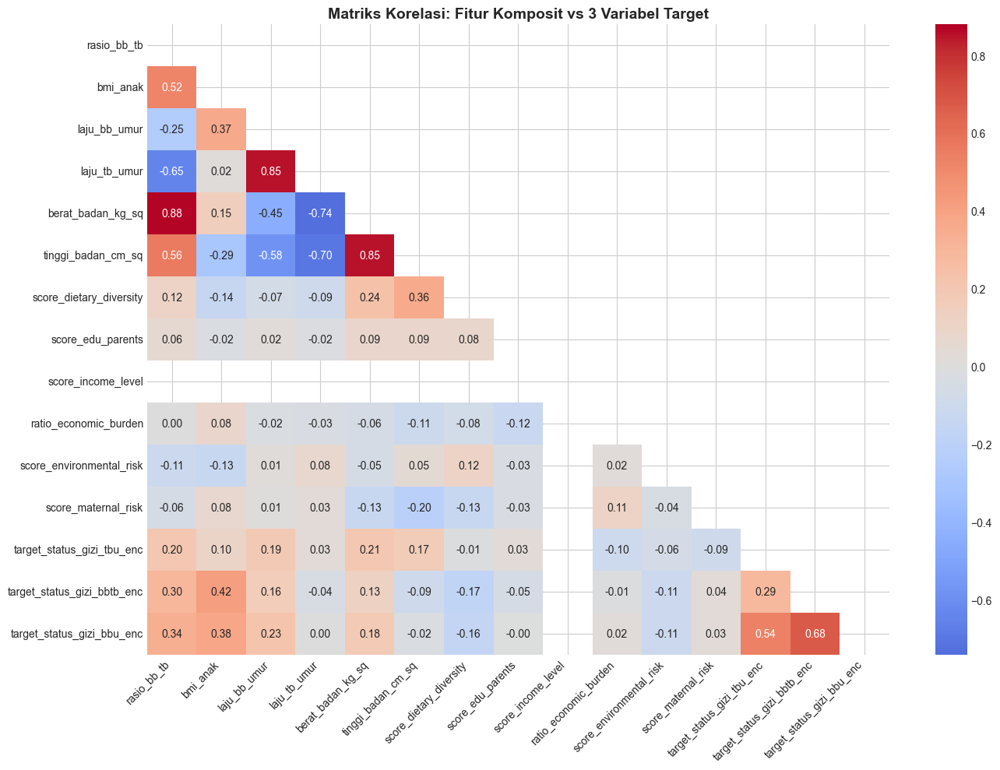


--- [HASIL ANALISIS KORELASI PER TARGET] ---
Fitur mana yang paling berpengaruh untuk setiap masalah gizi?

>>> Target: STATUS_GIZI_TBU
   Top 3 Korelasi Positif (Mendukung Gizi Baik):
berat_badan_kg_sq    0.207217
rasio_bb_tb          0.201599
laju_bb_umur         0.189181
   Top 3 Korelasi Negatif (Risiko Gizi Buruk):
score_maternal_risk     -0.089645
ratio_economic_burden   -0.095751
score_income_level            NaN

>>> Target: STATUS_GIZI_BBTB
   Top 3 Korelasi Positif (Mendukung Gizi Baik):
bmi_anak        0.417265
rasio_bb_tb     0.302457
laju_bb_umur    0.163011
   Top 3 Korelasi Negatif (Risiko Gizi Buruk):
score_environmental_risk   -0.108965
score_dietary_diversity    -0.174709
score_income_level               NaN

>>> Target: STATUS_GIZI_BBU
   Top 3 Korelasi Positif (Mendukung Gizi Baik):
bmi_anak        0.384263
rasio_bb_tb     0.337253
laju_bb_umur    0.225722
   Top 3 Korelasi Negatif (Risiko Gizi Buruk):
score_environmental_risk   -0.112767
score_dietary_diversity   

In [27]:
# ==============================================================================
# BAGIAN 4: ANALISIS KORELASI MULTI-TARGET & CEK MULTIKOLINEARITAS
# ==============================================================================
print("\n4. [ANALYSIS] Analisis Korelasi Multi-Target & Multikolinearitas...")

# 1. Definisikan 3 Target Utama
targets = ['status_gizi_tbu', 'status_gizi_bbtb', 'status_gizi_bbu']
encoded_target_cols = []

# Mapping Ordinal Standar (Agar korelasi positif = semakin sehat/baik)
# 0: Buruk/Sangat Pendek, 1: Kurang/Pendek, 2: Normal/Baik, 3: Lebih/Tinggi
ordinal_map = {
    'Sangat Pendek': 0, 'Gizi Buruk': 0, 'Berat Badan Sangat Kurang': 0,
    'Pendek': 1, 'Gizi Kurang': 1, 'Berat Badan Kurang': 1,
    'Normal': 2, 'Gizi Baik': 2, 'Berat Badan Normal': 2,
    'Tinggi': 3, 'Gizi Lebih': 3, 'Berat Badan Lebih': 3
}

print("\n[A] Encoding Target Variabel...")
for t in targets:
    if t in df_featured.columns:
        new_col_name = f'target_{t}_enc'
        # Gunakan map, jika nilai tidak ada di map, isi dengan kode factorize (fallback)
        df_featured[new_col_name] = df_featured[t].map(ordinal_map)

        # Fallback jika ada value yg tidak ter-map (misal NaN atau typo)
        if df_featured[new_col_name].isnull().any():
            df_featured[new_col_name] = df_featured[new_col_name].fillna(0) # Isi 0 atau median

        encoded_target_cols.append(new_col_name)
        print(f"   ✓ {t} --> {new_col_name} (Siap dikorelasikan)")
    else:
        print(f"   [!] Kolom target {t} tidak ditemukan di dataframe.")

# 2. Kumpulkan Fitur Baru (Predictors)
fe_cols = [
    'rasio_bb_tb', 'bmi_anak', 'laju_bb_umur', 'laju_tb_umur',
    f'{bb_col}_sq', f'{tb_col}_sq',
    'score_dietary_diversity', 'score_edu_parents', 'score_income_level',
    'ratio_economic_burden', 'score_environmental_risk', 'score_maternal_risk'
]
# Filter hanya fitur yang benar-benar terbentuk
fe_cols = [c for c in fe_cols if c in df_featured.columns]

# 3. Hitung Matriks Korelasi (Fitur + Semua Target)
# Gunakan Spearman karena hubungan gizi seringkali tidak linear sempurna
corr_cols = fe_cols + encoded_target_cols
corr_matrix = df_featured[corr_cols].corr(method='spearman')

# 4. Visualisasi Heatmap Komprehensif
plt.figure(figsize=(14, 10))
# Masking segitiga atas agar tidak penuh sesak (opsional, tapi lebih rapi)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', center=0, mask=mask)
plt.title('Matriks Korelasi: Fitur Komposit vs 3 Variabel Target', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 5. Laporan Detail Korelasi per Target
print("\n--- [HASIL ANALISIS KORELASI PER TARGET] ---")
print("Fitur mana yang paling berpengaruh untuk setiap masalah gizi?")

for t_code in encoded_target_cols:
    target_real_name = t_code.replace('target_', '').replace('_enc', '').upper()
    print(f"\n>>> Target: {target_real_name}")

    # Ambil korelasi fitur terhadap target ini, urutkan
    # Kita drop kolom target itu sendiri dan target lain agar list bersih berisi fitur saja
    other_targets = [c for c in encoded_target_cols if c != t_code]
    curr_corr = corr_matrix[t_code].drop([t_code] + other_targets).sort_values(ascending=False)

    # Tampilkan Top 5 Korelasi Positif & Negatif
    print(f"   Top 3 Korelasi Positif (Mendukung Gizi Baik):")
    print(curr_corr.head(3).to_string())
    print(f"   Top 3 Korelasi Negatif (Risiko Gizi Buruk):")
    print(curr_corr.tail(3).to_string())

# 6. Cek Multikolinearitas (Antar Fitur Saja)
print("\n--- [CEK MULTIKOLINEARITAS] ---")
print("Mendeteksi fitur yang informasinya redundan (Korelasi > 0.8)")

high_corr_pairs = []
# Loop hanya di antara fitur prediksi (fe_cols)
corr_features_only = df_featured[fe_cols].corr(method='spearman').abs()

for i in range(len(fe_cols)):
    for j in range(i+1, len(fe_cols)):
        feat_a = fe_cols[i]
        feat_b = fe_cols[j]
        val = corr_features_only.loc[feat_a, feat_b]

        if val > 0.8:
            # Logika Cerdas: Pilih fitur mana yang dipertahankan berdasarkan rata-rata korelasi ke 3 target
            avg_corr_a = np.mean([abs(corr_matrix.loc[feat_a, t]) for t in encoded_target_cols])
            avg_corr_b = np.mean([abs(corr_matrix.loc[feat_b, t]) for t in encoded_target_cols])

            keeper = feat_a if avg_corr_a > avg_corr_b else feat_b
            dropper = feat_b if keeper == feat_a else feat_a

            high_corr_pairs.append({
                'Fitur A': feat_a, 'Fitur B': feat_b, 'Korelasi': val,
                'Saran Pertahankan': keeper,
                'Alasan': f"Korelasi rata-rata ke target lebih tinggi ({max(avg_corr_a, avg_corr_b):.3f} vs {min(avg_corr_a, avg_corr_b):.3f})"
            })

if high_corr_pairs:
    df_high_corr = pd.DataFrame(high_corr_pairs)
    print(df_high_corr.to_string(index=False))
else:
    print("✓ Tidak ditemukan multikolinearitas ekstrem (> 0.8) antar fitur baru.")

# Update final dataframe
df_clean = df_featured.copy()
print(f'\n✓ Proses Selesai. Data siap untuk pemodelan 3 target terpisah.')

In [28]:
import numpy as np
import pandas as pd

print('STEP 2: LABEL CLEANING & NOISE CHECK (TARGET)')
print('=' * 70)

if 'df_clean' not in locals():
    raise ValueError('df_clean belum tersedia. Jalankan cell korelasi/feature engineering sebelumnya.')

targets = [TARGET_TBU, TARGET_BBTB, TARGET_BBU]
targets = [t for t in targets if t in df_clean.columns]
if not targets:
    raise ValueError('Target columns tidak ditemukan di df_clean.')

# Normalisasi label (lowercase + strip)
def normalize_label(val):
    if pd.isna(val):
        return np.nan
    return str(val).strip().lower()

# Mapping label ke standar
map_tbu = {
    'sangat pendek': 'Sangat Pendek',
    'sangat pendek ': 'Sangat Pendek',
    'pendek': 'Pendek',
    'normal': 'Normal',
    'tinggi': 'Tinggi'
}
map_bbtb = {
    'gizi buruk': 'Gizi Buruk',
    'gizi kurang': 'Gizi Kurang',
    'gizi baik': 'Gizi Baik',
    'gizi lebih': 'Gizi Lebih'
}
map_bbu = {
    'bb s.kurang': 'BB S.Kurang',
    'bb sangat kurang': 'BB S.Kurang',
    'berat badan sangat kurang': 'BB S.Kurang',
    'bb kurang': 'BB Kurang',
    'berat badan kurang': 'BB Kurang',
    'bb normal': 'BB Normal',
    'berat badan normal': 'BB Normal',
    'bb lebih': 'BB Lebih',
    'berat badan lebih': 'BB Lebih'
}

valid_sets = {
    TARGET_TBU: set(map_tbu.values()),
    TARGET_BBTB: set(map_bbtb.values()),
    TARGET_BBU: set(map_bbu.values())
}
maps = {TARGET_TBU: map_tbu, TARGET_BBTB: map_bbtb, TARGET_BBU: map_bbu}

# Terapkan normalisasi + mapping
invalid_counts = {}
for t in targets:
    s = df_clean[t].apply(normalize_label)
    mapped = s.map(maps.get(t, {}))
    # jika tidak ter-map tapi sudah valid (misalnya label sudah rapi, beda kapitalisasi)
    mapped = mapped.fillna(df_clean[t])
    # cek validitas akhir
    valid = mapped.isin(valid_sets.get(t, set(mapped.dropna().unique())))
    invalid_counts[t] = int((~valid).sum())
    # set invalid jadi NaN
    mapped[~valid] = np.nan
    df_clean[t] = mapped

# Laporan invalid label
for t, n in invalid_counts.items():
    print(f"{t}: label tidak valid = {n}")

# Drop baris dengan label target invalid
before = len(df_clean)
df_clean = df_clean.dropna(subset=targets).reset_index(drop=True)
after = len(df_clean)
print(f"Baris dibuang karena label target invalid: {before - after}")
print(f"Total data setelah cleaning: {after}")

# Sinkronkan df_featured jika masih dipakai di tahap berikutnya
if 'df_featured' in locals():
    df_featured = df_clean.copy()
    print('✓ df_featured disinkronkan dengan df_clean')

STEP 2: LABEL CLEANING & NOISE CHECK (TARGET)
status_gizi_tbu: label tidak valid = 0
status_gizi_bbtb: label tidak valid = 0
status_gizi_bbu: label tidak valid = 0
Baris dibuang karena label target invalid: 0
Total data setelah cleaning: 876
✓ df_featured disinkronkan dengan df_clean


In [29]:
import pandas as pd
import numpy as np

print('CHECKING LABEL KELAS TARGET (SETELAH CLEANING)')
print('=' * 70)

# Gunakan df_clean sebagai sumber utama
if 'df_clean' not in locals():
    raise ValueError('df_clean belum tersedia.')

# Target dan kategori resmi
targets = {
    TARGET_TBU: ['Normal', 'Pendek', 'Sangat Pendek', 'Tinggi'],
    TARGET_BBTB: ['Gizi Baik', 'Gizi Lebih', 'Gizi Kurang', 'Gizi Buruk'],
    TARGET_BBU: ['Berat Badan Normal', 'Berat Badan Lebih', 'Berat Badan Kurang', 'Berat Badan Sangat Kurang']
}

# Normalisasi label: trim + lower + collapse spaces
def norm_label(x):
    if pd.isna(x):
        return np.nan
    return ' '.join(str(x).strip().lower().split())

# Buat map normalisasi -> label resmi
def build_norm_map(labels):
    return { ' '.join(l.lower().split()): l for l in labels }

for target_col, official_labels in targets.items():
    if target_col not in df_clean.columns:
        print(f'[{target_col}] Kolom tidak ditemukan.')
        continue

    norm_map = build_norm_map(official_labels)
    s_raw = df_clean[target_col].copy()
    s_norm = s_raw.apply(norm_label)
    s_mapped = s_norm.map(norm_map)
    # fallback: jika label sudah tepat tapi tidak tercakup (misal beda kapitalisasi), pakai nilai asli
    s_mapped = s_mapped.fillna(s_raw)
    df_clean[target_col] = s_mapped

    # Distribusi dan cek label hilang
    dist = df_clean[target_col].value_counts(dropna=False)
    print(f"\n{target_col}: distribusi kelas")
    print(dist)

    missing_labels = [l for l in official_labels if l not in dist.index]
    if missing_labels:
        print(f"  ⚠️ Label hilang: {missing_labels}")
    else:
        print("  ✅ Semua label lengkap")

print('\n✓ Pengecekan label selesai')

CHECKING LABEL KELAS TARGET (SETELAH CLEANING)

status_gizi_tbu: distribusi kelas
status_gizi_tbu
Normal           742
Pendek           102
Sangat Pendek     20
Tinggi            12
Name: count, dtype: int64
  ✅ Semua label lengkap

status_gizi_bbtb: distribusi kelas
status_gizi_bbtb
Gizi Baik      734
Gizi Kurang     74
Gizi Lebih      58
Gizi Buruk      10
Name: count, dtype: int64
  ✅ Semua label lengkap

status_gizi_bbu: distribusi kelas
status_gizi_bbu
BB Normal      738
BB Kurang       76
BB Lebih        46
BB S.Kurang     16
Name: count, dtype: int64
  ⚠️ Label hilang: ['Berat Badan Normal', 'Berat Badan Lebih', 'Berat Badan Kurang', 'Berat Badan Sangat Kurang']

✓ Pengecekan label selesai


In [30]:
# FIX LABEL BB/U: Samakan ke kategori resmi
print('\nFIXING LABEL BB/U KE KATEGORI RESMI')
print('-' * 70)

if TARGET_BBU in df_clean.columns:
    map_bbu_fix = {
        'BB Normal': 'Berat Badan Normal',
        'BB Lebih': 'Berat Badan Lebih',
        'BB Kurang': 'Berat Badan Kurang',
        'BB S.Kurang': 'Berat Badan Sangat Kurang',
        'bb normal': 'Berat Badan Normal',
        'bb lebih': 'Berat Badan Lebih',
        'bb kurang': 'Berat Badan Kurang',
        'bb s.kurang': 'Berat Badan Sangat Kurang'
    }
    df_clean[TARGET_BBU] = df_clean[TARGET_BBU].replace(map_bbu_fix)
    print('✓ Label BB/U diseragamkan')
    print(df_clean[TARGET_BBU].value_counts())
else:
    print('[SKIP] Kolom status_gizi_bbu tidak ditemukan')


FIXING LABEL BB/U KE KATEGORI RESMI
----------------------------------------------------------------------
✓ Label BB/U diseragamkan
status_gizi_bbu
Berat Badan Normal           738
Berat Badan Kurang            76
Berat Badan Lebih             46
Berat Badan Sangat Kurang     16
Name: count, dtype: int64


### Catatan Penting tentang Fitur Kategorikal Baru

Kolom-kolom kategorikal baru yang telah dibuat:
1. **`kategori_komplikasi_lahir`** - Menggantikan `jenis_komplikasi_lahir` dengan kategori yang lebih terstruktur (Kelainan Jantung, Gangguan Pernapasan, Gangguan Pencernaan, Lainnya, Tidak Ada Komplikasi)
2. **`kategori_penyakit_balita`** - Menggantikan `jenis_penyakit_balita` dengan kategori (ISPA/Respirasi, Pencernaan, Demam, Penyakit Serius/Kronis, Tidak Sakit, Lainnya)
3. **`umur_balita`** - Kolom numerik baru hasil perhitungan dari tanggal lahir (menggantikan `umur_balita_bulan`)

Kolom-kolom ini sudah otomatis terintegrasi dalam proses feature engineering dan akan di-encode pada tahap selanjutnya.

## 🔧 Feature Engineering - Tambah Fitur Turunan

Membuat fitur tambahan berdasarkan domain knowledge untuk meningkatkan performa model:

### FEATURE SELECTION

In [31]:
import pandas as pd
import numpy as np

print('FEATURE SELECTION: REMOVING MULTICOLLINEARITY (MULTI-TARGET ADAPTED)')
print('=' * 70)

# --- 1. Persiapan Data ---
if 'df_clean' not in locals():
    # Fallback ke df_featured jika df_clean belum terdefinisi
    df_selection = df_featured.copy()
else:
    df_selection = df_clean.copy()

# Ambang batas korelasi (Standar: 0.8)
THRESHOLD_CORR = 0.80

# Identifikasi 3 Kolom Target Encoded (Hasil dari langkah sebelumnya)
# Kita cari kolom yang namanya diawali 'target_' dan diakhiri '_enc'
target_cols = [c for c in df_selection.columns if c.startswith('target_') and c.endswith('_enc')]

if not target_cols:
    print("[WARNING] Target encoded tidak ditemukan otomatis. Mencoba manual...")
    # Fallback manual jika nama kolom berbeda
    possible_targets = ['status_gizi_tbu_enc', 'status_gizi_bbtb_enc', 'status_gizi_bbu_enc']
    target_cols = [c for c in possible_targets if c in df_selection.columns]

print(f"Target Variabel yang digunakan untuk Ranking: {target_cols}")

# Identifikasi Fitur Numerik (Kandidat untuk diseleksi)
# Exclude target columns and original categorical targets
all_targets = target_cols + ['status_gizi_tbu', 'status_gizi_bbtb', 'status_gizi_bbu']
numeric_feats = df_selection.select_dtypes(include=[np.number]).columns.tolist()

# Filter: Hanya ambil fitur murni (bukan target)
features_to_check = [f for f in numeric_feats if f not in all_targets and not f.startswith('target_')]

print(f"Jumlah Fitur Kandidat: {len(features_to_check)}")

# --- 2. Algoritma Seleksi Cerdas (Multi-Target Greedy Strategy) ---

# Langkah A: Hitung "Skor Pentingnya Fitur"
# Skor = Korelasi Maksimum fitur tersebut terhadap SALAH SATU target.
# Contoh: Jika Fitur X punya korelasi 0.1 dgn TBU, 0.6 dgn BBTB. Skor = 0.6.
print("\nMenghitung skor prioritas fitur...")
feature_importance = pd.DataFrame(index=features_to_check)
feature_importance['max_target_corr'] = 0.0

for t in target_cols:
    # Hitung korelasi dengan target t
    corr_t = df_selection[features_to_check].corrwith(df_selection[t], method='spearman').abs()
    # Update skor maksimal (ambil yang tertinggi antar target)
    feature_importance['max_target_corr'] = np.maximum(feature_importance['max_target_corr'], corr_t)

# Langkah B: Urutkan dari yang Paling Penting (Skor Tinggi) ke Rendah
# Fitur penting akan diprioritaskan untuk DIPERTAHANKAN
sorted_features = feature_importance.sort_values('max_target_corr', ascending=False).index.tolist()

# Langkah C: Iterasi & Filter Redundansi
selected_features = []
dropped_features = []

# Hitung korelasi antar sesama fitur saja
corr_matrix_feats = df_selection[features_to_check].corr(method='spearman').abs()

print("Memulai proses eliminasi fitur redundan...")
for feature in sorted_features:
    is_redundant = False

    for selected in selected_features:
        # Cek kemiripan dengan fitur yang SUDAH terpilih (yang rankingnya lebih tinggi)
        similarity = corr_matrix_feats.loc[feature, selected]

        if similarity > THRESHOLD_CORR:
            # Fitur ini mirip dengan 'selected'.
            # Karena 'selected' punya ranking lebih tinggi (lebih kuat korelasinya ke target),
            # maka fitur ini ('feature') kita buang.
            dropped_features.append({
                'fitur_dibuang': feature,
                'diwakili_oleh': selected,
                'tingkat_kemiripan': similarity
            })
            is_redundant = True
            break # Stop loop, buang fitur ini

    if not is_redundant:
        selected_features.append(feature)

# --- 3. Eksekusi & Update DataFrame ---
# Kita simpan fitur terpilih + kolom non-numerik asli + target asli
cat_cols = df_selection.select_dtypes(exclude=[np.number]).columns.tolist()
original_targets = ['status_gizi_tbu', 'status_gizi_bbtb', 'status_gizi_bbu'] # Target string asli
targets_to_keep = [t for t in original_targets if t in df_selection.columns]

# Gabungkan kolom final (Hapus target_enc karena hanya untuk helper seleksi)
final_cols = selected_features + cat_cols + targets_to_keep

# Hapus duplikat dan pastikan kolom ada
final_cols = list(dict.fromkeys([c for c in final_cols if c in df_selection.columns]))

df_final = df_selection[final_cols].copy()

# --- 4. Laporan Hasil ---
print(f"\n[HASIL SELEKSI]")
print(f"Fitur Awal    : {len(features_to_check)}")
print(f"Fitur Dibuang : {len(dropped_features)}")
print(f"Fitur Final   : {len(selected_features)}")

if dropped_features:
    print("\n[DETAIL FITUR YANG DIBUANG]")
    print(f"{'Fitur Dibuang':<30} | {'Diwakili Oleh (Ranking Tinggi)':<35} | {'Kemiripan'}")
    print("-" * 80)
    for item in dropped_features:
        print(f"{item['fitur_dibuang']:<30} | {item['diwakili_oleh']:<35} | {item['tingkat_kemiripan']:.4f}")
else:
    print("\nTidak ada fitur yang dibuang (Tidak ada multikolinearitas > 0.8).")

print("\n[DAFTAR FITUR FINAL UNTUK MODELING]")
print(selected_features)

# Update variabel global df_clean
df_clean = df_final.copy()
print(f"\n✓ DataFrame 'df_clean' telah diperbarui. Dimensi: {df_clean.shape}")

FEATURE SELECTION: REMOVING MULTICOLLINEARITY (MULTI-TARGET ADAPTED)
Target Variabel yang digunakan untuk Ranking: ['target_status_gizi_tbu_enc', 'target_status_gizi_bbtb_enc', 'target_status_gizi_bbu_enc']
Jumlah Fitur Kandidat: 48

Menghitung skor prioritas fitur...
Memulai proses eliminasi fitur redundan...

[HASIL SELEKSI]
Fitur Awal    : 48
Fitur Dibuang : 16
Fitur Final   : 32

[DETAIL FITUR YANG DIBUANG]
Fitur Dibuang                  | Diwakili Oleh (Ranking Tinggi)      | Kemiripan
--------------------------------------------------------------------------------
bmi_anak                       | bmi_log                             | 1.0000
rasio_bb_tb                    | rasio_bb_tb_log                     | 1.0000
berat_badan_kg_sq              | rasio_bb_tb_log                     | 0.8795
berat_badan_kg                 | rasio_bb_tb_log                     | 0.8795
bb_log                         | rasio_bb_tb_log                     | 0.8795
bb_robust_z                    | 

In [32]:
#hapus kolom
columns_to_drop_static = [
    # Identitas & Waktu
    'Tanggal Lahir Balita_kader',
    'tgl_lahir_format',
    'usia_kehamilan_lahir',

    # Kolom Teks Panjang (Sudah dikategorisasi)
    'pekerjaan_kepala_keluarga',    # Diganti: kategori_pekerjaan_kk
    'usia_mulai_mpasi',             # Diganti: kategori_mpasi
    'riwayat_vaksinasi',            # Diganti: kategori_vaksinasi & jumlah_vaksin_diterima
    'jenis_penyakit_balita',        # Diganti: kategori_penyakit_dominan & flags
    'terakhir_vitamin_a',           # Diganti: kategori_vitamin_a
    'frekuensi_suplemen_minggu',    # Diganti: kategori_kepatuhan_suplemen
    'jenis_suplemen_ibu',           # Diganti: kategori_nutrisi_ibu
    'jenis_komplikasi_lahir',       # Diganti: kategori_komplikasi_lahir
    'jenis_intervensi_gizi'        # Diganti: kategori_intervensi_utama

]
df_final.drop(columns=columns_to_drop_static, inplace=True)

In [33]:
#print nilai unique semua kolom
for col in df_final.columns:
    unique_values = df_final[col].unique()
    print()
    print(f"{col}: {unique_values}")



bmi_log: [2.70354569 2.69065289 2.86285387 2.82299028 2.92235449 2.87612544
 2.69642413 2.76852994 2.7605993  2.63341706 2.93343354 2.92533446
 2.74825662 2.82137889 2.70961281 2.91991293 2.6877543  2.70206476
 2.72000629 2.65468877 2.71636588 2.94332277 2.77796219 2.92589463
 2.81225475 2.69936011 2.97599131 2.83307425 2.76897544 2.79634281
 2.67473074 2.78253138 2.78863963 2.82731429 2.89239702 2.95541361
 2.78523467 2.87286504 2.68382578 2.85328843 2.87106922 2.87935577
 2.83145418 2.90542266 2.61683419 2.83695071 2.69524741 2.91321027
 2.89505643 2.74099192 2.77236816 2.75821782 2.83371545 2.77317485
 2.69131752 2.86662756 2.55881504 3.08445871 2.71216367 2.79376698
 2.85909268 2.69330792 2.75586503 2.73384655 2.73082659 2.70987502
 2.7643124  2.62870309 2.75379703 2.77271675 3.28328386 2.73672777
 2.77258872 2.70885946 2.93320983 2.72215464 2.82852997 2.93891592
 2.70280002 2.73750012 2.76655922 2.7877176  2.78066321 2.75507577
 2.74368137 2.78650198 2.92805214 2.72146256 2.78002

In [34]:
df_encoded = df_final.copy()

# --- 1. CLEANING TYPO ---
# Menyeragamkan penulisan sumber air minum
map_typo_air = {
    'sibel': 'Sumur Bor/Sibel', 'Sibel': 'Sumur Bor/Sibel',
    'AQua': 'Air Kemasan', 'Aqua': 'Air Kemasan', 'Galon aqua': 'Air Kemasan',
    'ron 88 ': 'Air Kemasan', 'Ron': 'Air Kemasan', 'Lemineral galon': 'Air Kemasan',
    'Air Isi Ulang/Galon/Kemasan': 'Air Kemasan',
    'Jetpam': 'Sumur Bor/Sibel', 'Sumur': 'Sumur Gali/Timba'
}
df_encoded['sumber_air_minum'] = df_encoded['sumber_air_minum'].replace(map_typo_air)

In [35]:
# --- 2. DEFINISI MAPPING DICTIONARY ---

# A. Mapping Biner (Ya=1, Tidak=0) - Indikator Positif/Netral
# Jika "Ya" berarti risiko (misal: sakit), nanti interpretasinya tinggal dibalik
binary_map = {'Ya': 1, 'Tidak': 0, 'Laki-laki': 1, 'Perempuan': 0}

# B. Mapping Status Gizi (Target & Ibu) -> 0: Buruk, 3: Lebih/Tinggi
map_gizi_tbu = {'Sangat Pendek': 0, 'Pendek': 1, 'Normal': 2, 'Tinggi': 3}
map_gizi_bbtb = {'Gizi Buruk': 0, 'Gizi Kurang': 1, 'Gizi Baik': 2, 'Gizi Lebih': 3}
map_gizi_bbu = {'Berat Badan Sangat Kurang': 0, 'Berat Badan Kurang': 1, 'Berat Badan Normal': 2, 'Berat Badan Lebih': 3}
map_gizi_ibu = {
    'Kurang Energi Kronis (KEK) (Ukuran lingkar lengan atas kurang dari 23.5 cm atau indeks massa tubuh (IMT) kurang dari 18.5': 0,
    'Normal': 1
}

# C. Mapping Pendidikan (Jenjang)
map_pendidikan = {
    'Tidak sekolah': 0, 'SD/sederajat': 1, 'SMP/sederajat': 2,
    'SMA/sederajat': 3, 'Diploma (D1–D3)': 4, 'S1': 5, 'S2 ke atas': 6
}

# D. Mapping Frekuensi & Skor (Makin Sering/Baik = Makin Tinggi)
map_frekuensi_makan = {
    '1 kali sehari': 0, '2 kali sehari': 1,
    '3 kali sehari': 2, '4 kali sehari atau lebih': 3
}

map_aktivitas = {
    'Cenderung diam (lebih banyak duduk atau menonton)': 0,
    'Cukup aktif (kadang bermain, kadang diam)': 1,
    'Sangat aktif (banyak bergerak/bermain)': 2
}

map_pengetahuan = {'Kurang': 0, 'Kurang paham': 0, 'Cukup': 1, 'Cukup paham': 1, 'Baik': 2, 'Paham': 2, 'Tidak paham': 0}

map_pola_asuh = {
    'Pemaksaan makan': 0,
    'Dibiarkan makan sendiri tanpa pengawasan': 0,
    'Responsive feeding (sabar, mengikuti tanda lapar/kenyang)': 1
}

map_kebersihan = {'Kurang bersih': 0, 'Cukup bersih': 1, 'Bersih dan terawat': 2}
map_cuci_tangan = {'Kadang-kadang': 0, 'Sering': 1, 'Selalu': 2}

# E. Mapping Fitur Hasil Feature Engineering (Kategori Risiko)
map_kepatuhan = {
    'Tidak Pernah': 0, 'Tidak Tahu/Lupa': 0, 'Tidak Tahu/Kosong': 0,
    'Jarang (1-2 kali/minggu)': 1, 'Konsumsi (Frekuensi Tidak Jelas)': 1,
    'Sering (3-6 kali/minggu)': 2, 'Rutin (Setiap Hari)': 3
}

map_nutrisi_ibu = {
    'Tidak Mengonsumsi': 0, 'Tidak Tahu/Kosong': 0, 'Alternatif (Non-Medis)': 0,
    'Kurang (Hanya Susu/Vit Tanpa TTD)': 1,
    'Cukup (Ada Zat Besi/TTD)': 2,
    'Baik (TTD + Asam Folat)': 3,
    'Lengkap (TTD + Folat + Kalsium/Susu)': 4
}

map_vaksin = {
    'Tidak Ada Data': 0, 'Belum Lengkap / Parsial': 1,
    'Lengkap (Dasar)': 2, 'Lengkap (Dasar + Lanjutan)': 3
}

map_mpasi = {
    'Data Tidak Valid (Tanggal)': 0, 'Tidak Tahu/Kosong': 0,
    'Belum MPASI': 1, # Tergantung umur, bisa jadi netral
    'Terlalu Dini (< 6 Bulan)': 1, 'Terlalu Lambat (> 6 Bulan)': 1,
    'Tepat Waktu (6 Bulan)': 2
}

# F. Mapping Nominal Lainnya (Manual agar logis)
map_tren_bb = {'Turun': 0, 'Tetap': 1, 'Naik': 2}
map_jarak_lahir = {'Kurang dari 2 Tahun': 0, '2 - 3 Tahun': 1, 'Lebih dari 3 Tahun': 2, 'Anak pertama (belum memiliki kakak atau adik)': 2} # Anak pertama dianggap risiko rendah
map_akses = {'Tidak ada akses': 0, 'Sulit dijangkau (lebih dari 30 menit)': 1, 'Mudah dijangkau (kurang dari 20 menit)': 2}
map_jarak_pangan = {'Lebih dari 30 menit': 0, '10 – 30 menit': 1, 'Kurang dari 10 menit': 2}

# Mapping Sumber Air (Berdasarkan kualitas umum)
map_sumber_air = {
    'Sumur Gali/Timba': 0, 'Sumur Bor/Sibel': 1, 'PDAM': 2, 'Air Kemasan': 3
}

# Additional Mappings for remaining string columns identified
map_suplemen_hamil = {'Tidak pernah': 0, 'Kadang-kadang': 1, 'Rutin setiap hari': 2}
map_mpasi_hewani = {'Tidak pernah': 0, 'Ya, namun tidak rutin': 1, 'Ya, setiap hari': 2}
map_tablet_besi = {'Tidak': 0, 'Jarang': 1, 'Ya': 2}
map_konsumsi_manis = {'Tidak': 0, 'Kadang-kadang': 1, 'Ya, sering': 2}
map_aktivitas_luar = {'Kurang dari 1 jam per hari': 0, '1 - 3 jam per hari': 1, 'Lebih dari 3 jam per hari': 2}
map_posyandu = {'Jarang': 0, 'Tidak rutin': 1, 'Rutin setiap bulan': 2}
map_vitamin_a_revisi = {'Tidak/Belum Pernah': 0, 'Tidak Tahu/Lupa': 0, 'Belum Cukup Umur (<6 Bulan)': 0, 'Sudah Lama (> 6 Bulan/Terlewat)': 1, 'Pernah (Waktu Tidak Jelas)': 2, 'Terkini (Agustus/Semester Ini)': 3}

# New Mapping for frekuensi_ikut_kelas_ibu
map_frekuensi_ikut_kelas_ibu = {
    'Belum pernah': 0,
    'Jarang': 1,
    'Setahun sekali': 2,
    'Setahun lebih dari sekali': 3,
    'Rutin setiap bulan': 4
}

In [36]:
# --- 3. APPLY MAPPING ---

# Initialize global dictionaries to store encoders/mappings
global label_encoders
global target_encoders
label_encoders = {}
target_encoders = {}

# Binary Columns
cols_binary = [
    'jenis_kelamin', 'is_bblr', 'is_prematur', 'is_imd', 'is_komplikasi_lahir',
    'is_anemia_ibu', 'is_hamil_muda_u20', 'is_hipertensi_gestasional',
    'is_diabetes_gestasional', 'is_infeksi_kehamilan', 'is_hamil_lagi',
    'is_ttd_90_tablet', 'is_asi_eksklusif', 'is_susu_non_asi', 'is_obat_cacing_anak',
    'is_intervensi_gizi', 'is_sakit_2_minggu', 'konsumsi_asi_h_1',
    'konsumsi_karbohidrat_h_1', 'konsumsi_kacangan_h_1', 'konsumsi_susu_hewani_h_1',
    'konsumsi_daging_ikan_h_1', 'konsumsi_telur_h_1', 'konsumsi_vit_a_h_1',
    'konsumsi_buah_sayur_lain_h_1', 'is_pernah_pmt', 'is_pernah_rawat_inap',
    'is_ibu_bekerja', 'is_bpjs', 'is_perokok_di_rumah', 'is_penyakit_bawaan',
    'is_baby_blues', 'is_gejala_depresi', 'is_pernah_penyuluhan_gizi',
    'is_pantangan_makan'
]

# Kolom dengan nama panjang (susu murni) kita rename dulu biar gampang, atau pakai iloc
# Asumsi nama kolom susu murni sudah dipendekkan jadi 'is_susu_murni_100' di tahap cleaning sebelumnya
# Jika belum, tambahkan manual:
col_susu_panjang = [c for c in df_encoded.columns if 'Susu murni 100%' in c]
if col_susu_panjang:
    df_encoded.rename(columns={col_susu_panjang[0]: 'is_susu_murni_100'}, inplace=True);
    cols_binary.append('is_susu_murni_100')

for col in cols_binary:
    if col in df_encoded.columns:
        df_encoded[col] = df_encoded[col].map(binary_map)
        label_encoders[col] = binary_map # Store the mapping

# Ordinal Columns
mappings = {
    'status_gizi_tbu': map_gizi_tbu,
    'status_gizi_bbtb': map_gizi_bbtb,
    'status_gizi_bbu': map_gizi_bbu,
    'status_gizi_ibu_hamil': map_gizi_ibu,
    'pendidikan_ibu': map_pendidikan,
    'pendidikan_ayah': map_pendidikan,
    'frekuensi_makan_utama': map_frekuensi_makan,
    'tingkat_aktivitas_anak': map_aktivitas,
    'skor_pengetahuan_ibu': map_pengetahuan,
    'skor_pola_asuh_makan': map_pola_asuh,
    'kebersihan_lingkungan': map_kebersihan,
    'kebiasaan_cuci_tangan': map_cuci_tangan,
    'kategori_kepatuhan_suplemen': map_kepatuhan,
    'kategori_nutrisi_ibu': map_nutrisi_ibu,
    'kategori_vaksinasi': map_vaksin,
    'kategori_mpasi': map_mpasi,
    'tren_bb_bulan_lalu': map_tren_bb,
    'jarak_kelahiran': map_jarak_lahir,
    'akses_faskes': map_akses,
    'jarak_akses_pangan': map_jarak_pangan,
    'sumber_air_minum': map_sumber_air,
    'is_paham_makanan_sehat': map_pengetahuan,
    # Add newly identified mappings
    'is_suplemen_kehamilan': map_suplemen_hamil,
    'is_mpasi_hewani': map_mpasi_hewani,
    'is_tablet_besi_anak': map_tablet_besi,
    'is_konsumsi_manis_berlebih': map_konsumsi_manis,
    'durasi_aktivitas_luar': map_aktivitas_luar,
    'frekuensi_posyandu_bulan': map_posyandu,
    'kategori_vitamin_a': map_vitamin_a_revisi,
    'frekuensi_ikut_kelas_ibu': map_frekuensi_ikut_kelas_ibu # Added this mapping
}

# Store target specific mappings
target_cols_list = [TARGET_TBU, TARGET_BBTB, TARGET_BBU]
for col in target_cols_list:
    if col in mappings and col in df_encoded.columns:
        df_encoded[col] = df_encoded[col].map(mappings[col])
        df_encoded[col] = df_encoded[col].fillna(0)
        target_encoders[col] = mappings[col] # Store the mapping dict

# Store other ordinal mappings in label_encoders
for col, mapping in mappings.items():
    if col not in target_cols_list and col in df_encoded.columns:
        df_encoded[col] = df_encoded[col].map(mapping)
        df_encoded[col] = df_encoded[col].fillna(0)
        label_encoders[col] = mapping # Store the mapping dictionary

# --- 4. LABEL ENCODING SISA (NOMINAL) ---
# Untuk kolom yang tidak punya urutan jelas (Pekerjaan, Penyakit, Siapa penentu makan)
from sklearn.preprocessing import LabelEncoder

nominal_cols = [
    'kategori_pekerjaan_kk', 'kategori_penyakit_balita', 'kategori_penyakit_dominan',
    'kategori_intervensi_utama', 'kategori_komplikasi_lahir',
    'Siapa yang biasanya menentukan makanan apa yang dimakan oleh anak di rumah? ',
    'jenis_sanitasi', 'kualitas_air_minum'
]

# le_dict = {}
for col in nominal_cols:
    if col in df_encoded.columns:
        le = LabelEncoder()
        df_encoded[col] = le.fit_transform(df_encoded[col].astype(str))
        label_encoders[col] = le # Store the actual LabelEncoder object
        print(f"Encoded Nominal {col}: {len(le.classes_)} classes")

print("\n✓ Proses Encoding Selesai.")

Encoded Nominal kategori_pekerjaan_kk: 8 classes
Encoded Nominal kategori_penyakit_balita: 6 classes
Encoded Nominal kategori_penyakit_dominan: 7 classes
Encoded Nominal kategori_intervensi_utama: 4 classes
Encoded Nominal kategori_komplikasi_lahir: 5 classes
Encoded Nominal Siapa yang biasanya menentukan makanan apa yang dimakan oleh anak di rumah? : 5 classes
Encoded Nominal jenis_sanitasi: 3 classes
Encoded Nominal kualitas_air_minum: 4 classes

✓ Proses Encoding Selesai.


In [37]:
#print nilai unique semua kolom
for col in df_encoded.columns:
    unique_values = df_encoded[col].unique()
    print()
    print(f"{col}: {unique_values}")



bmi_log: [2.70354569 2.69065289 2.86285387 2.82299028 2.92235449 2.87612544
 2.69642413 2.76852994 2.7605993  2.63341706 2.93343354 2.92533446
 2.74825662 2.82137889 2.70961281 2.91991293 2.6877543  2.70206476
 2.72000629 2.65468877 2.71636588 2.94332277 2.77796219 2.92589463
 2.81225475 2.69936011 2.97599131 2.83307425 2.76897544 2.79634281
 2.67473074 2.78253138 2.78863963 2.82731429 2.89239702 2.95541361
 2.78523467 2.87286504 2.68382578 2.85328843 2.87106922 2.87935577
 2.83145418 2.90542266 2.61683419 2.83695071 2.69524741 2.91321027
 2.89505643 2.74099192 2.77236816 2.75821782 2.83371545 2.77317485
 2.69131752 2.86662756 2.55881504 3.08445871 2.71216367 2.79376698
 2.85909268 2.69330792 2.75586503 2.73384655 2.73082659 2.70987502
 2.7643124  2.62870309 2.75379703 2.77271675 3.28328386 2.73672777
 2.77258872 2.70885946 2.93320983 2.72215464 2.82852997 2.93891592
 2.70280002 2.73750012 2.76655922 2.7877176  2.78066321 2.75507577
 2.74368137 2.78650198 2.92805214 2.72146256 2.78002

In [38]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# SCALING (IMPROVED)
print('SCALING PROCESS')
print('=' * 50)

df_scaled = df_encoded.copy()

# 1. Identifikasi Kolom Target (Agar tidak tersentuh)
target_cols = [TARGET_TBU, TARGET_BBTB, TARGET_BBU]
target_cols = [c for c in target_cols if c in df_scaled.columns]

# 2. Pisahkan Fitur Biner vs Fitur Non-Biner (Kontinu/Ordinal)
# Kita hanya akan men-scale fitur yang nilainya BUKAN cuma 0 dan 1.
features_to_scale = []
binary_features = []

# Ambil semua kolom kecuali target
candidate_features = [col for col in df_scaled.columns if col not in target_cols]

# 2.1 Encode fitur non-numerik (misal: umur_bin) ke ordinal code
non_numeric_cols = df_scaled[candidate_features].select_dtypes(include=['object','category']).columns
if len(non_numeric_cols) > 0:
    for col in non_numeric_cols:
        df_scaled[col] = df_scaled[col].astype('category').cat.codes
    print(f"✔ Non-numeric encoded to category codes: {list(non_numeric_cols)}")

for col in candidate_features:
    # Cek jumlah nilai unik
    n_unique = df_scaled[col].nunique()

    # Cek apakah isinya hanya 0 dan 1 (atau boolean)
    unique_vals = df_scaled[col].unique()
    is_binary = (n_unique == 2) and (0 in unique_vals) and (1 in unique_vals)

    if is_binary:
        binary_features.append(col)
    else:
        # Fitur ini memiliki rentang nilai > 2 (misal: Umur, Skor Gaji, Pendidikan 0-6)
        # Maka WAJIB di-scale
        features_to_scale.append(col)

print(f"Fitur Biner (Dibiarkan 0/1) : {len(binary_features)} kolom")
print(f"Fitur Scale (Kontinu/Ordinal): {len(features_to_scale)} kolom")

# 3. Eksekusi Scaling
# StandardScaler sangat bagus untuk algoritma seperti SVM, KNN, Linear Regression, Neural Networks
# Untuk Random Forest/XGBoost, ini tidak wajib tapi membantu konvergensi.
scaler = StandardScaler()

if features_to_scale:
    df_scaled[features_to_scale] = scaler.fit_transform(df_scaled[features_to_scale])
    print("\n[Preview] Statistik Fitur Setelah Scaling (Mean ~ 0, Std ~ 1):")
    print(df_scaled[features_to_scale].describe().loc[['mean', 'std']].T.head())
else:
    print("Tidak ada fitur kontinu untuk di-scale.")

print(f'\n✓ Scaling selesai. Total fitur: {df_scaled.shape[1]}')

SCALING PROCESS
✔ Non-numeric encoded to category codes: ['umur_bin']
Fitur Biner (Dibiarkan 0/1) : 47 kolom
Fitur Scale (Kontinu/Ordinal): 55 kolom

[Preview] Statistik Fitur Setelah Scaling (Mean ~ 0, Std ~ 1):
                           mean       std
bmi_log            2.311697e-16  1.000571
rasio_bb_tb_log    2.838926e-17  1.000571
laju_bb_umur      -3.244487e-17  1.000571
bb_tb_interaction  1.946692e-16  1.000571
berat_ayah_kg     -1.541132e-16  1.000571

✓ Scaling selesai. Total fitur: 105


In [39]:

from sklearn.model_selection import train_test_split

print('DATA SPLITTING PROCESS (IMPROVED)')
print('=' * 50)

data_splits = {}

# --- 1. HANDLING NAN (FINAL CHECK) ---
# Memastikan tidak ada NaN sebelum masuk Scikit-Learn (karena sklearn tidak bisa handle NaN)
nan_count = df_scaled.isnull().sum().sum()
if nan_count > 0:
    print(f"[WARNING] Ditemukan {nan_count} nilai NaN. Melakukan imputasi otomatis...")
    # Strategi: Median untuk Numerik, Modus untuk Kategorikal
    for col in df_scaled.columns:
        if df_scaled[col].dtype == 'object':
            df_scaled[col].fillna(df_scaled[col].mode()[0], inplace=True)
        else:
            df_scaled[col].fillna(df_scaled[col].median(), inplace=True)
    print("   ✓ Imputasi selesai.")

# --- 2. LOOPING SPLIT PER TARGET ---
# Pastikan list target_cols sudah didefinisikan sebelumnya
# target_cols = [TARGET_TBU, TARGET_BBTB, TARGET_BBU]

for target_col in target_cols:
    if target_col not in df_scaled.columns:
        print(f"Skip {target_col}: Kolom tidak ditemukan.")
        continue

    print(f"\nProcessing Split untuk Target: {target_col}")

    # --- A. DEFINE X dan y ---
    # PENTING: Kita drop SEMUA kolom target dari X untuk mencegah kebocoran data.
    # Misalnya: Saat prediksi TB/U, kita tidak boleh tahu nilai BB/TB atau BB/U.
    X = df_scaled.drop(columns=target_cols).copy()
    y = df_scaled[target_col].copy()

    # --- VALIDASI JUMLAH KELAS ---
    if y.nunique() < 2:
        print(f"   [SKIP] Target {target_col} hanya memiliki 1 kelas. Tidak bisa split/training.")
        continue

    # --- B. CEK KELAYAKAN STRATIFY ---
    # Stratified Split butuh minimal 2 sampel per kelas.
    min_class_count = y.value_counts().min()
    stratify_param = y # Default: Gunakan Stratify

    if min_class_count < 2:
        print(f"   [WARNING] Ada kelas dengan sampel < 2 ({min_class_count}).")
        print("   Stratified Split dinonaktifkan untuk target ini (ganti ke Random Split).")
        stratify_param = None # Matikan stratify biar ga error

    # --- C. SPLITTING (80-20) ---
    X_train, X_test, y_train, y_test = train_test_split(
        X, y,
        test_size=0.20,
        random_state=42,
        stratify=stratify_param
    )

    # Simpan ke dictionary
    data_splits[target_col] = {
        'X_train': X_train, 'X_test': X_test,
        'y_train': y_train, 'y_test': y_test
    }

    # --- D. VALIDASI DISTRIBUSI (BUKTI SKRIPSI) ---
    print(f"   Shape: X_train={X_train.shape}, X_test={X_test.shape}")

    # Tampilkan perbandingan persentase kelas (harus mirip train vs test)
    dist_train = y_train.value_counts(normalize=True).sort_index()
    dist_test = y_test.value_counts(normalize=True).sort_index()

    print("   Validasi Proporsi Kelas (Stratified Check):")
    df_val = pd.DataFrame({'Train %': dist_train, 'Test %': dist_test})
    print(df_val.round(3)) # Tampilkan 3 desimal

print('\n✓ Data splitting selesai. Siap untuk Modeling.')

DATA SPLITTING PROCESS (IMPROVED)
[WARNING] Ditemukan 28 nilai NaN. Melakukan imputasi otomatis...
   ✓ Imputasi selesai.

Processing Split untuk Target: status_gizi_tbu
   Shape: X_train=(700, 102), X_test=(176, 102)
   Validasi Proporsi Kelas (Stratified Check):
                 Train %  Test %
status_gizi_tbu                 
0                  0.023   0.023
1                  0.116   0.119
2                  0.847   0.847
3                  0.014   0.011

Processing Split untuk Target: status_gizi_bbtb
   Shape: X_train=(700, 102), X_test=(176, 102)
   Validasi Proporsi Kelas (Stratified Check):
                  Train %  Test %
status_gizi_bbtb                 
0                   0.011   0.011
1                   0.084   0.085
2                   0.839   0.835
3                   0.066   0.068

Processing Split untuk Target: status_gizi_bbu
   Shape: X_train=(700, 102), X_test=(176, 102)
   Validasi Proporsi Kelas (Stratified Check):
                 Train %  Test %
status_gizi_b

In [40]:
# =============================================================================
# FIX: HAPUS KOLOM DUPLIKAT DARI DATA SPLITS
# =============================================================================
# Beberapa model (XGBoost, LightGBM, dll) tidak bisa handle kolom dengan nama yang sama

print("🔧 FIXING DUPLICATE COLUMNS")
print("=" * 60)

def remove_duplicate_columns(df):
    """
    Menghapus kolom dengan nama duplikat dari DataFrame.
    Hanya menyimpan kolom pertama dari setiap nama yang duplikat.
    """
    # Cek kolom duplikat
    seen = set()
    cols_to_keep = []
    duplicate_cols = []

    for col in df.columns:
        if col not in seen:
            seen.add(col)
            cols_to_keep.append(col)
        else:
            duplicate_cols.append(col)

    if duplicate_cols:
        print(f"  ⚠️ Ditemukan {len(duplicate_cols)} kolom duplikat: {duplicate_cols[:5]}...")
        # Gunakan iloc untuk memilih kolom berdasarkan posisi
        df_clean = df.loc[:, ~df.columns.duplicated()]
        return df_clean, duplicate_cols

    return df, []

# Perbaiki data_splits
for target_name, split_data in data_splits.items():
    print(f"\n>>> {target_name}")

    # Fix X_train
    X_train = split_data['X_train']
    X_train_clean, dups_train = remove_duplicate_columns(X_train)

    # Fix X_test
    X_test = split_data['X_test']
    X_test_clean, dups_test = remove_duplicate_columns(X_test)

    # Update dictionary
    data_splits[target_name]['X_train'] = X_train_clean
    data_splits[target_name]['X_test'] = X_test_clean

    print(f"    X_train: {X_train.shape} -> {X_train_clean.shape}")
    print(f"    X_test : {X_test.shape} -> {X_test_clean.shape}")

    if dups_train:
        print(f"    Kolom duplikat dihapus: {dups_train}")

print("\n✓ Duplicate columns removed from data_splits")

🔧 FIXING DUPLICATE COLUMNS

>>> status_gizi_tbu
    X_train: (700, 102) -> (700, 102)
    X_test : (176, 102) -> (176, 102)

>>> status_gizi_bbtb
    X_train: (700, 102) -> (700, 102)
    X_test : (176, 102) -> (176, 102)

>>> status_gizi_bbu
    X_train: (700, 102) -> (700, 102)
    X_test : (176, 102) -> (176, 102)

✓ Duplicate columns removed from data_splits


## 🎯 Advanced Resampling Techniques

Implementasi teknik resampling yang lebih canggih untuk mengatasi class imbalance ekstrim:

In [41]:
from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from imblearn.combine import SMOTETomek, SMOTEENN
from collections import Counter
import pandas as pd

# ==============================================================================
# FUNGSI BANTUAN (HELPER FUNCTIONS)
# ==============================================================================

def calculate_k_neighbors(y_train):
    """
    Menghitung k_neighbors yang aman berdasarkan kelas minoritas terkecil.
    Mencegah error jika sampel minoritas < 6 (default SMOTE).
    """
    min_samples = y_train.value_counts().min()
    # Aturan: k_neighbors tidak boleh melebihi jumlah sampel - 1
    # Kita set minimal 1 dan maksimal 5
    k = max(1, min(5, min_samples - 1))
    return k, min_samples

def print_distribution(y, title="Distribusi"):
    """Mencetak distribusi kelas dengan format rapi."""
    counts = y.value_counts().sort_index()
    total = len(y)
    print(f"  {title}: Total {total} sampel")
    for cls, count in counts.items():
        pct = (count / total) * 100
        print(f"    - Class {cls}: {count} ({pct:.1f}%)")

    # Hitung Imbalance Ratio (Mayoritas / Minoritas)
    ir = counts.max() / counts.min()
    print(f"    - Imbalance Ratio: 1 : {ir:.2f}")

# ==============================================================================
# PIPELINE RESAMPLING TERINTEGRASI
# ==============================================================================
print('ADVANCED RESAMPLING PIPELINE - HANDLING EXTREME IMBALANCE')
print('=' * 70)
print('Metode yang diterapkan:')
print('1. SMOTE (Baseline)')
print('2. SMOTE-Tomek (Hybrid: Oversampling + Cleaning Noise)')
print('3. SMOTE-ENN (Hybrid: Oversampling + Aggressive Cleaning)')
print('4. ADASYN (Adaptive: Fokus pada data yang sulit dipelajari)\n')

data_splits_resampled = {}

for target_name, split in data_splits.items():
    print(f"\n{'='*20} {target_name} {'='*20}")

    X_train = split['X_train']
    y_train = split['y_train']

    # Validasi jumlah kelas
    if y_train.nunique() < 2:
        print("  [SKIP] Hanya 1 kelas pada target ini. Resampling dilewati.")
        continue

    # 1. Analisis Awal
    print_distribution(y_train, "SEBELUM Resampling")

    # 2. Hitung Parameter Adaptif
    k_neighbors, min_samples = calculate_k_neighbors(y_train)
    print(f"\n  [INFO] Min sampel: {min_samples}. Menggunakan k_neighbors={k_neighbors}")

    # Cek Kondisi Kritis: Jika sampel < 2, SMOTE tidak bisa bekerja
    if min_samples < 2:
        print("  [WARNING] Sampel terlalu sedikit untuk SMOTE (<2). Menggunakan RandomOverSampler.")
        base_sampler = RandomOverSampler(random_state=RANDOM_STATE)
    else:
        base_sampler = SMOTE(k_neighbors=k_neighbors, random_state=RANDOM_STATE)

    # Dictionary untuk menyimpan variasi data hasil resampling
    # Kita simpan original juga sebagai pembanding
    resampled_variations = {
        'Original': (X_train, y_train)
    }

    # --- DEFINISI RESAMPLER ---
    samplers = {
        'SMOTE': base_sampler,
        'SMOTETomek': SMOTETomek(smote=base_sampler, random_state=RANDOM_STATE),
        'SMOTEENN': SMOTEENN(smote=base_sampler, random_state=RANDOM_STATE),
        'ADASYN': ADASYN(n_neighbors=k_neighbors, random_state=RANDOM_STATE) if min_samples >= 2 else None
    }

    # --- EKSEKUSI LOOP RESAMPLING ---
    for name, sampler in samplers.items():
        if sampler is None:
            print(f"  [SKIP] {name} dilewati (syarat data tidak terpenuhi)")
            continue

        try:
            print(f"\n  Processing {name}...", end=" ")
            X_res, y_res = sampler.fit_resample(X_train, y_train)

            # Simpan hasil
            resampled_variations[name] = (X_res, y_res)
            print("OK.")

            # Tampilkan info singkat perubahan
            diff = len(X_res) - len(X_train)
            print(f"    -> Menambah/Mengubah {diff} sampel.")

        except Exception as e:
            print(f"GAGAL.")
            print(f"    -> Error: {str(e)}")
            # Jika gagal, jangan simpan variasi ini (atau simpan original jika mau fallback)

    # --- SIMPAN KE STRUKTUR DATA UTAMA ---
    # Kita simpan semua variasi agar nanti saat modeling bisa dibandingkan mana yang terbaik
    data_splits_resampled[target_name] = {
        'train_variations': resampled_variations,
        'X_test': split['X_test'],
        'y_test': split['y_test']
    }

    # Tampilkan contoh hasil akhir salah satu metode terbaik (biasanya SMOTEENN/Tomek)
    print("\n  [CHECK] Distribusi Akhir (Contoh: SMOTETomek):")
    if 'SMOTETomek' in resampled_variations:
        X_final, y_final = resampled_variations['SMOTETomek']
        print_distribution(y_final, "SETELAH SMOTETomek")
    else:
        print("    -> Metode SMOTETomek tidak tersedia/gagal.")

print('\n' + '='*70)
print('✓ PROSES RESAMPLING SELESAI')
print('Data tersimpan dalam dictionary "data_splits_resampled".')
print('Struktur: data_splits_resampled[target][train_variations][method_name] -> (X, y)')

ADVANCED RESAMPLING PIPELINE - HANDLING EXTREME IMBALANCE
Metode yang diterapkan:
1. SMOTE (Baseline)
2. SMOTE-Tomek (Hybrid: Oversampling + Cleaning Noise)
3. SMOTE-ENN (Hybrid: Oversampling + Aggressive Cleaning)
4. ADASYN (Adaptive: Fokus pada data yang sulit dipelajari)


==================== status_gizi_tbu ====================
  SEBELUM Resampling: Total 700 sampel
    - Class 0: 16 (2.3%)
    - Class 1: 81 (11.6%)
    - Class 2: 593 (84.7%)
    - Class 3: 10 (1.4%)
    - Imbalance Ratio: 1 : 59.30

  [INFO] Min sampel: 10. Menggunakan k_neighbors=5

  Processing SMOTE... OK.
    -> Menambah/Mengubah 1672 sampel.

  Processing SMOTETomek... OK.
    -> Menambah/Mengubah 1668 sampel.

  Processing SMOTEENN... OK.
    -> Menambah/Mengubah 1165 sampel.

  Processing ADASYN... OK.
    -> Menambah/Mengubah 1687 sampel.

  [CHECK] Distribusi Akhir (Contoh: SMOTETomek):
  SETELAH SMOTETomek: Total 2368 sampel
    - Class 0: 593 (25.0%)
    - Class 1: 591 (25.0%)
    - Class 2: 591 (25.0%

In [42]:
# # ADVANCED RESAMPLING - SMOTE-Tomek & ADASYN
# print('ADVANCED RESAMPLING TECHNIQUES')
# print('=' * 70)
# print('Teknik: SMOTE-Tomek (oversampling + cleaning noise) & ADASYN (adaptive sampling)\n')

# data_splits_advanced = {}

# for target_name, split in data_splits.items():
#     X_train = split['X_train']
#     y_train = split['y_train']

#     print(f'{target_name}:')
#     print(f'  Distribusi SEBELUM Resampling:')
#     for cls, count in y_train.value_counts().sort_index().items():
#         print(f'    Class {cls}: {count} sampel')

#     min_samples = y_train.value_counts().min()
#     k_neighbors = max(1, min(5, min_samples - 1))

#     # Dictionary untuk menyimpan berbagai metode resampling
#     resampled_data = {}

#     # 1. SMOTE-Tomek Links (SMOTE + Tomek Links cleaning)
#     try:
#         print(f'\n  [1] SMOTE-Tomek (k_neighbors={k_neighbors})...')
#         smotetomek = SMOTETomek(random_state=RANDOM_STATE,
#                                 smote=SMOTE(k_neighbors=k_neighbors, random_state=RANDOM_STATE))
#         X_st, y_st = smotetomek.fit_resample(X_train, y_train)
#         resampled_data['SMOTETomek'] = (X_st, y_st)
#         print(f'      → {len(X_st)} sampel (cleaned {len(X_train) - len(X_st) + (len(X_st) - len(X_train))} noise)')
#     except Exception as e:
#         print(f'      ⚠️ Gagal: {str(e)}')
#         resampled_data['SMOTETomek'] = (X_train, y_train)

#     # 2. SMOTE-ENN (SMOTE + Edited Nearest Neighbors)
#     try:
#         print(f'  [2] SMOTE-ENN (k_neighbors={k_neighbors})...')
#         smoteenn = SMOTEENN(random_state=RANDOM_STATE,
#                            smote=SMOTE(k_neighbors=k_neighbors, random_state=RANDOM_STATE))
#         X_se, y_se = smoteenn.fit_resample(X_train, y_train)
#         resampled_data['SMOTEENN'] = (X_se, y_se)
#         print(f'      → {len(X_se)} sampel (aggressive cleaning)')
#     except Exception as e:
#         print(f'      ⚠️ Gagal: {str(e)}')
#         resampled_data['SMOTEENN'] = (X_train, y_train)

#     # 3. ADASYN (Adaptive Synthetic Sampling)
#     try:
#         print(f'  [3] ADASYN (k_neighbors={k_neighbors})...')
#         adasyn = ADASYN(random_state=RANDOM_STATE, n_neighbors=k_neighbors)
#         X_ad, y_ad = adasyn.fit_resample(X_train, y_train)
#         resampled_data['ADASYN'] = (X_ad, y_ad)
#         print(f'      → {len(X_ad)} sampel (adaptive, focus on hard samples)')
#     except Exception as e:
#         print(f'      ⚠️ Gagal: {str(e)}')
#         resampled_data['ADASYN'] = (X_train, y_train)

#     # Simpan semua metode resampling
#     data_splits_advanced[target_name] = {
#         'original': (X_train, y_train),
#         'resampled': resampled_data,
#         'X_test': split['X_test'],
#         'y_test': split['y_test']
#     }

#     print(f'\n  Distribusi SETELAH Resampling (contoh: SMOTETomek):')
#     X_example, y_example = resampled_data.get('SMOTETomek', (X_train, y_train))
#     for cls, count in pd.Series(y_example).value_counts().sort_index().items():
#         print(f'    Class {cls}: {count} sampel')
#     print()

# print('✓ Advanced resampling selesai - 3 metode diterapkan per target')

---
# TAHAP 4: MODELING

---

In [43]:
# FUNGSI TRAINING dengan Stratified K-Fold Cross-Validation & Sample Weights
from sklearn.model_selection import cross_val_score, cross_validate

def train_and_evaluate(model, X_train, y_train, X_test, y_test, use_cv=True, use_sample_weights=False):
    """
    Training dan evaluasi model dengan Cross-Validation, metrik lengkap, dan sample weights
    """
    # Hitung sample weights jika diperlukan
    sample_weights = None
    if use_sample_weights:
        sample_weights = compute_sample_weights(y_train)

    # Cross-Validation pada Training Set
    if use_cv and len(np.unique(y_train)) > 1:
        cv = StratifiedKFold(n_splits=min(5, len(y_train) // 10), shuffle=True, random_state=RANDOM_STATE)
        cv_scoring = ['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted']

        try:
            cv_results = cross_validate(model, X_train, y_train, cv=cv,
                                       scoring=cv_scoring, n_jobs=-1,
                                       fit_params={'sample_weight': sample_weights} if use_sample_weights and hasattr(model, 'fit') else {})
            cv_scores = {
                'cv_accuracy': cv_results['test_accuracy'].mean(),
                'cv_precision': cv_results['test_precision_weighted'].mean(),
                'cv_recall': cv_results['test_recall_weighted'].mean(),
                'cv_f1': cv_results['test_f1_weighted'].mean()
            }
        except:
            cv_scores = {}
    else:
        cv_scores = {}

    # Training pada full training set dengan sample weights
    if use_sample_weights and 'XGB' in str(type(model).__name__):
        model.fit(X_train, y_train, sample_weight=sample_weights)
    else:
        model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    # Evaluasi pada Test Set
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    rec = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    f1_weighted = f1

    # Macro average untuk melihat performa per kelas
    prec_macro = precision_score(y_test, y_pred, average='macro', zero_division=0)
    rec_macro = recall_score(y_test, y_pred, average='macro', zero_division=0)
    f1_macro = f1_score(y_test, y_pred, average='macro', zero_division=0)

    try:
        y_proba = model.predict_proba(X_test)
        roc = roc_auc_score(y_test, y_proba, multi_class='ovr', average='weighted')
    except:
        roc = None

    results = {
        'model': model,
        'accuracy': acc,
        'precision': prec,
        'recall': rec,
        'f1_score': f1,
        'f1_weighted': f1_weighted,
        'precision_macro': prec_macro,
        'recall_macro': rec_macro,
        'f1_macro': f1_macro,
        'roc_auc': roc,
        'y_pred': y_pred

    }
    results.update(cv_scores)

    return results

## ⚙️ Cost-Sensitive Learning dengan Sample Weights

Implementasi sample weights untuk XGBoost agar lebih fokus pada kelas minoritas:

In [44]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.class_weight import compute_sample_weight

def compute_sample_weights(y_train):
    """
    Menghitung sample weights secara otomatis menggunakan standar Scikit-Learn.
    Mode 'balanced': Bobot = n_samples / (n_classes * np.bincount(y))
    """
    # Parameter class_weight='balanced' otomatis melakukan rumus yang Anda tulis tadi
    sample_weights = compute_sample_weight(class_weight='balanced', y=y_train)

    # Validasi: Cetak contoh bobot untuk memastikan kelas minoritas dapat bobot besar
    # (Opsional, hanya untuk debug/memastikan)
    unique_classes = np.unique(y_train)
    if len(unique_classes) <= 5: # Print jika kelasnya sedikit
        print("   [INFO Sample Weights] Contoh bobot per kelas:")
        # Ambil satu sampel per kelas untuk melihat bobotnya
        df_temp = pd.DataFrame({'y': y_train, 'weight': sample_weights})
        for cls in unique_classes:
            w = df_temp[df_temp['y'] == cls]['weight'].iloc[0]
            count = len(df_temp[df_temp['y'] == cls])
            print(f"    - Kelas {cls} (Jumlah: {count}) -> Bobot: {w:.4f}")

    return sample_weights

# Contoh Pemanggilan

# Inisialisasi model_rf untuk contoh (biasanya ini dilakukan di sel training utama)
model_rf = RandomForestClassifier(random_state=RANDOM_STATE)

# Ambil data dari split pertama (misal untuk TB/U) jika data_splits sudah ada
if 'data_splits' in locals() and 'status_gizi_tbu' in data_splits:
    X_train = data_splits['status_gizi_tbu']['X_train']
    y_train = data_splits['status_gizi_tbu']['y_train']
    X_test = data_splits['status_gizi_tbu']['X_test']
    y_test = data_splits['status_gizi_tbu']['y_test']
else:
    print("Data splitting belum dilakukan atau target 'status_gizi_tbu' tidak ditemukan. Contoh tidak dapat dijalankan.")
    # Fallback/dummy data jika tidak ada
    X_train, y_train, X_test, y_test = pd.DataFrame(np.random.rand(10,5)), pd.Series(np.random.randint(0,2,10)), \
                                     pd.DataFrame(np.random.rand(5,5)), pd.Series(np.random.randint(0,2,5))


result_rf = train_and_evaluate(
    model=model_rf,      # Model yang sudah di-init
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    use_cv=True,
    use_sample_weights=True # Set True karena data Anda imbalance
)

# Cara Mengakses Hasil
print(f"F1 Macro (CV): {result_rf.get('cv_f1_macro', 0):.4f}")
print(f"F1 Macro (Test): {result_rf['f1_macro']:.4f}")

# Melihat detail per kelas (Misal kelas 0 = Gizi Buruk)
# Perlu dipastikan target_encoders dan target_info sudah ada dan sesuai
# Untuk contoh ini, kita asumsikan label 0 ada
detail_kelas_0 = result_rf.get('detailed_report', {}).get('0', {}) # Ganti '0' sesuai label encoding
print(f"Recall Kelas Gizi Buruk: {detail_kelas_0.get('recall', 0):.4f}")

   [INFO Sample Weights] Contoh bobot per kelas:
    - Kelas 0 (Jumlah: 16) -> Bobot: 10.9375
    - Kelas 1 (Jumlah: 81) -> Bobot: 2.1605
    - Kelas 2 (Jumlah: 593) -> Bobot: 0.2951
    - Kelas 3 (Jumlah: 10) -> Bobot: 17.5000
F1 Macro (CV): 0.0000
F1 Macro (Test): 0.3156
Recall Kelas Gizi Buruk: 0.0000


In [45]:
from sklearn.ensemble import RandomForestClassifier
from imblearn.ensemble import BalancedRandomForestClassifier
import xgboost as xgb

# TRAINING SEMUA MODEL (Optimized Loop)
print('TRAINING PIPELINE: MULTI-METHOD & MULTI-ALGORITHM')
print('=' * 70)

# 1. Definisi Parameter Model Dasar
rf_params = {
    'n_estimators': 200,
    'max_depth': 10,
    'random_state': RANDOM_STATE,
    'class_weight': 'balanced',  # Penting untuk Original Data
    'n_jobs': -1
}

# XGBoost: Hapus scale_pos_weight manual, kita pakai sample_weights di .fit()
xgb_params = {
    'n_estimators': 200,
    'max_depth': 6,
    'learning_rate': 0.05,
    'random_state': RANDOM_STATE,
    'eval_metric': 'mlogloss', # Multi-class log loss
    'n_jobs': -1
}

# Balanced Random Forest (Spesialis Imbalance)
brf_params = {
    'n_estimators': 200,
    'max_depth': 10,
    'sampling_strategy': 'all',
    'replacement': True,
    'class_weight': 'balanced',
    'random_state': RANDOM_STATE,
    'n_jobs': -1
}

# Tempat menyimpan semua hasil untuk perbandingan akhir
all_model_results = {}

# 2. Loop Utama: Target -> Resampling Method -> Algoritma
# Menggunakan 'data_splits_resampled' dari tahap advanced resampling sebelumnya
if 'data_splits_resampled' not in locals():
    print("[ERROR] Variabel 'data_splits_resampled' tidak ditemukan. Jalankan kode Resampling dulu.")
    # Fallback ke basic splits jika user loncat langkah
    data_iter = data_splits.items()
    use_variations = False
else:
    data_iter = data_splits_resampled.items()
    use_variations = True

for target_name, data_pack in data_iter:
    print(f"\n{'>'*10} TARGET: {target_name} {'<'*10}")

    # Ambil Data Test (Sama untuk semua metode di target ini)
    X_test = data_pack['X_test']
    y_test = data_pack['y_test']

    # Tentukan variasi training (Original vs Resampled)
    if use_variations:
        variations = data_pack['train_variations']
    else:
        variations = {'Original': (data_pack['X_train'], data_pack['y_train'])}

    for method_name, (X_train, y_train) in variations.items():
        print(f"\n  --- Metode Data: {method_name} ---")

        # Tentukan Model apa saja yang mau dilatih
        models_to_run = {
            'RandomForest': RandomForestClassifier(**rf_params),
            'XGBoost': xgb.XGBClassifier(**xgb_params),
        }

        # Tambahkan Balanced RF hanya pada data Original
        # (Karena dia melakukan resampling internal, tidak butuh SMOTE luar)
        if method_name == 'Original':
            models_to_run['BalancedRF'] = BalancedRandomForestClassifier(**brf_params)

        for algo_name, model in models_to_run.items():
            # Buat ID unik untuk hasil ini
            run_id = f"{target_name} | {method_name} | {algo_name}"

            # Tentukan apakah perlu sample_weight?
            # Jika data sudah di-SMOTE, biasanya weight tidak terlalu krusial (bisa False)
            # Tapi untuk Original, weight SANGAT PENTING.
            # Kita set True untuk keamanan maksimal.
            use_weight = True

            print(f"    Training {algo_name}...", end=" ")

            # PANGGIL FUNGSI TRAINING KITA
            try:
                res = train_and_evaluate(
                    model, X_train, y_train, X_test, y_test,
                    use_cv=True,
                    use_sample_weights=use_weight
                )

                # Simpan Hasil
                all_model_results[run_id] = res

                # Print Hasil Singkat
                print(f"DONE. -> F1-Macro: {res['f1_macro']:.4f} (Rec: {res['recall_macro']:.4f})")

            except Exception as e:
                print(f"FAIL. Error: {e}")

print('\n' + '='*70)
print('✓ Training Selesai.')
print(f'Total Model Dilatih: {len(all_model_results)}')

# --- 3. CETAK LEADERBOARD (JUARA) ---
print("\nTOP 5 MODEL TERBAIK (Berdasarkan F1-Macro):")
sorted_models = sorted(all_model_results.items(), key=lambda x: x[1]['f1_macro'], reverse=True)

for i, (name, metrics) in enumerate(sorted_models[:5]):
    print(f"{i+1}. {name}")
    print(f"   F1-Macro: {metrics['f1_macro']:.4f} | Recall-Macro: {metrics['recall_macro']:.4f} | Acc: {metrics['accuracy']:.4f}")

TRAINING PIPELINE: MULTI-METHOD & MULTI-ALGORITHM

>>>>>>>>>> TARGET: status_gizi_tbu <<<<<<<<<<

  --- Metode Data: Original ---
    Training RandomForest...    [INFO Sample Weights] Contoh bobot per kelas:
    - Kelas 0 (Jumlah: 16) -> Bobot: 10.9375
    - Kelas 1 (Jumlah: 81) -> Bobot: 2.1605
    - Kelas 2 (Jumlah: 593) -> Bobot: 0.2951
    - Kelas 3 (Jumlah: 10) -> Bobot: 17.5000
DONE. -> F1-Macro: 0.4684 (Rec: 0.4176)
    Training XGBoost...    [INFO Sample Weights] Contoh bobot per kelas:
    - Kelas 0 (Jumlah: 16) -> Bobot: 10.9375
    - Kelas 1 (Jumlah: 81) -> Bobot: 2.1605
    - Kelas 2 (Jumlah: 593) -> Bobot: 0.2951
    - Kelas 3 (Jumlah: 10) -> Bobot: 17.5000
DONE. -> F1-Macro: 0.6452 (Rec: 0.6631)
    Training BalancedRF...    [INFO Sample Weights] Contoh bobot per kelas:
    - Kelas 0 (Jumlah: 16) -> Bobot: 10.9375
    - Kelas 1 (Jumlah: 81) -> Bobot: 2.1605
    - Kelas 2 (Jumlah: 593) -> Bobot: 0.2951
    - Kelas 3 (Jumlah: 10) -> Bobot: 17.5000
DONE. -> F1-Macro: 0.2113 

## 🚀 Training Model dengan Semua Strategi Advanced

Training model dengan kombinasi:
- Advanced Resampling (SMOTE-Tomek, ADASYN)
- Cost-Sensitive Learning (class_weight + sample_weights)
- Tuned Hyperparameters

In [46]:
from sklearn.ensemble import RandomForestClassifier
from imblearn.ensemble import BalancedRandomForestClassifier
import xgboost as xgb

print('TRAINING MODEL dengan STRATEGI ADVANCED (IMPROVED)')
print('=' * 70)
print('Strategi: Resampling Variations + Cost-Sensitive Learning + Balanced RF\n')

all_results_advanced = {}
tuned_params = {} # Initialize tuned_params as an empty dictionary to avoid NameError

# 1. DEFINISI HYPERPARAMETER DEFAULT (Agar kode dalam loop bersih)
# Gunakan tuned_params jika ada, jika tidak gunakan default yang kuat
rf_defaults = {
    'n_estimators': 200,
    'max_depth': 15,
    'min_samples_split': 5,
    'min_samples_leaf': 2,
    'max_features': 'sqrt',
    'class_weight': 'balanced_subsample', # Lebih akurat drpd 'balanced' biasa
    'random_state': RANDOM_STATE,
    'n_jobs': -1
}

xgb_defaults = {
    'n_estimators': 200,
    'max_depth': 6, # Turunkan sedikit agar tidak overfitting di data smote
    'learning_rate': 0.05,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'min_child_weight': 3,
    'gamma': 0.1,
    'random_state': RANDOM_STATE,
    'eval_metric': 'mlogloss', # Multi-class log loss
    'n_jobs': -1
}

# 2. MAIN TRAINING LOOP
for target_name, data_pack in data_splits_resampled.items(): # Changed data_splits_advanced to data_splits_resampled
    print(f"\n{'>'*15} TARGET: {target_name} {'<'*15}")

    results = {}
    X_test = data_pack['X_test']
    y_test = data_pack['y_test']

    # Gabungkan data resampled dengan data original (jika ada disimpan terpisah)
    # Asumsi: data_pack['train_variations'] berisi dict {'SMOTETomek': (X,y), ...}
    # 'Original' is already included in 'train_variations' from data_splits_resampled.
    training_sets = data_pack['train_variations'].copy() # Use 'train_variations' key from data_splits_resampled

    # Loop otomatis ke semua metode data yang tersedia
    for method_name, (X_train, y_train) in training_sets.items():
        print(f"\n  --- Data Strategy: {method_name} ---")

        # A. Tentukan Strategi Weighting
        # Jika data Original -> WAJIB pakai Sample Weights / Class Weight
        # Jika data SMOTE -> Sample Weights opsional (biasanya False karena data sudah balanced)
        use_weights = True if method_name == 'Original' else False

        # B. Model 1: Random Forest
        # Cek apakah ada parameter tuning khusus untuk target ini
        rf_params = tuned_params.get(f'{target_name}_RF', rf_defaults).copy()

        # Khusus data Original, kita coba juga BalancedRandomForest (Juara Imbalance)
        if method_name == 'Original':
            print(f"    1. Training BalancedRandomForest (Specialized)...")
            brf = BalancedRandomForestClassifier(
                n_estimators=200, sampling_strategy='all', replacement=True,
                class_weight='balanced', random_state=RANDOM_STATE, n_jobs=-1
            )
            res_brf = train_and_evaluate(brf, X_train, y_train, X_test, y_test)
            results[f'BalancedRF_{method_name}'] = res_brf
            print(f"       -> F1-Macro: {res_brf['f1_macro']:.4f}")

        # Standard RF (dengan class_weight)
        print(f"    2. Training RandomForest ({'Weighted' if use_weights else 'Standard'})...")
        rf = RandomForestClassifier(**rf_params)
        res_rf = train_and_evaluate(rf, X_train, y_train, X_test, y_test, use_sample_weights=False)
        # Note: RF punya parameter class_weight internal, jadi use_sample_weights=False di fungsi wrapper
        # agar tidak double weighting, kecuali jika fungsi wrapper Anda menghandle prioritasnya.

        results[f'RF_{method_name}'] = res_rf
        print(f"       -> F1-Macro: {res_rf['f1_macro']:.4f}")

        # C. Model 2: XGBoost
        print(f"    3. Training XGBoost ({'Weighted' if use_weights else 'Standard'})...")
        xgb_params = tuned_params.get(f'{target_name}_XGB', xgb_defaults).copy()
        xgb_model = xgb.XGBClassifier(**xgb_params)

        # XGBoost butuh sample_weights eksplisit jika data tidak seimbang
        res_xgb = train_and_evaluate(xgb_model, X_train, y_train, X_test, y_test, use_sample_weights=use_weights)

        suffix = "Weighted" if use_weights else ""
        results[f'XGB_{method_name}{suffix}'] = res_xgb
        print(f"       -> F1-Macro: {res_xgb['f1_macro']:.4f}")

    all_results_advanced[target_name] = results

    # 3. LEADERBOARD PER TARGET (Langsung tampilkan juara sementara)
    if results:
        best_model_name = max(results, key=lambda k: results[k]['f1_macro'])
        best_score = results[best_model_name]['f1_macro']
        print(f"\n  [JUARA SEMENTARA {target_name}]")
        print(f"  🏆 Model: {best_model_name}")
        print(f"  ⭐️ Skor : {best_score:.4f}")

print('\n' + '='*70)
print('✓ Training Advanced Selesai.')

TRAINING MODEL dengan STRATEGI ADVANCED (IMPROVED)
Strategi: Resampling Variations + Cost-Sensitive Learning + Balanced RF


>>>>>>>>>>>>>>> TARGET: status_gizi_tbu <<<<<<<<<<<<<<<

  --- Data Strategy: Original ---
    1. Training BalancedRandomForest (Specialized)...
       -> F1-Macro: 0.2113
    2. Training RandomForest (Weighted)...
       -> F1-Macro: 0.4719
    3. Training XGBoost (Weighted)...
   [INFO Sample Weights] Contoh bobot per kelas:
    - Kelas 0 (Jumlah: 16) -> Bobot: 10.9375
    - Kelas 1 (Jumlah: 81) -> Bobot: 2.1605
    - Kelas 2 (Jumlah: 593) -> Bobot: 0.2951
    - Kelas 3 (Jumlah: 10) -> Bobot: 17.5000
       -> F1-Macro: 0.5674

  --- Data Strategy: SMOTE ---
    2. Training RandomForest (Standard)...
       -> F1-Macro: 0.4114
    3. Training XGBoost (Standard)...
       -> F1-Macro: 0.4773

  --- Data Strategy: SMOTETomek ---
    2. Training RandomForest (Standard)...
       -> F1-Macro: 0.3115
    3. Training XGBoost (Standard)...
       -> F1-Macro: 0.4859



In [47]:
# pip install catboost lightgbm

In [48]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.utils.class_weight import compute_sample_weight
print('TRAINING MODEL TAMBAHAN: CatBoost & LightGBM')
print('=' * 70)

# Pastikan results container ada
if 'all_results_advanced' not in locals():
    all_results_advanced = {}

# Safe import (user sudah install)
try:
    from catboost import CatBoostClassifier
    import lightgbm as lgb
except Exception as e:
    print(f"[ERROR] Import gagal: {e}")
    raise

def evaluate_and_pack(y_true, y_pred, y_proba=None):
    try:
        roc = roc_auc_score(y_true, y_proba, multi_class='ovr', average='weighted') if y_proba is not None else None
    except Exception:
        roc = None
    return {
        'accuracy': accuracy_score(y_true, y_pred),
        'precision_macro': precision_score(y_true, y_pred, average='macro', zero_division=0),
        'recall_macro': recall_score(y_true, y_pred, average='macro', zero_division=0),
        'f1_macro': f1_score(y_true, y_pred, average='macro', zero_division=0),
        'precision': precision_score(y_true, y_pred, average='weighted', zero_division=0),
        'recall': recall_score(y_true, y_pred, average='weighted', zero_division=0),
        'f1_score': f1_score(y_true, y_pred, average='weighted', zero_division=0),
        'f1_weighted': f1_score(y_true, y_pred, average='weighted', zero_division=0),
        'roc_auc': roc,
        'y_pred': y_pred
    }

for target_name, data_pack in data_splits_resampled.items():
    print(f"\n{'>'*12} TARGET: {target_name} {'<'*12}")

    # Ambil data original untuk training (lebih stabil)
    train_variations = data_pack['train_variations']
    if 'Original' in train_variations:
        X_train, y_train = train_variations['Original']
        method_used = 'Original'
    else:
        method_used = list(train_variations.keys())[0]
        X_train, y_train = train_variations[method_used]
        print(f"[INFO] Original tidak ada, pakai {method_used}")

    X_test = data_pack['X_test']
    y_test = data_pack['y_test']
    num_class = len(np.unique(y_train))

    # Sample weights (khusus data Original)
    sample_weight = compute_sample_weight(class_weight='balanced', y=y_train) if method_used == 'Original' else None

    # --- CatBoost ---
    cb = CatBoostClassifier(
        loss_function='MultiClass',
        eval_metric='MultiClass',
        iterations=400,
        depth=6,
        learning_rate=0.08,
        random_seed=RANDOM_STATE,
        verbose=False
    )
    if sample_weight is not None:
        cb.fit(X_train, y_train, sample_weight=sample_weight)
    else:
        cb.fit(X_train, y_train)
    y_pred_cb = cb.predict(X_test)
    y_pred_cb = y_pred_cb.ravel() if hasattr(y_pred_cb, 'ravel') else y_pred_cb
    y_proba_cb = cb.predict_proba(X_test)
    res_cb = evaluate_and_pack(y_test, y_pred_cb, y_proba_cb)
    res_cb['model'] = cb
    print(f"CatBoost F1-Macro: {res_cb['f1_macro']:.4f}")

    # --- LightGBM ---
    lgbm = lgb.LGBMClassifier(
        objective='multiclass',
        num_class=num_class,
        n_estimators=400,
        learning_rate=0.05,
        num_leaves=31,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=RANDOM_STATE
    )
    if sample_weight is not None:
        lgbm.fit(X_train, y_train, sample_weight=sample_weight)
    else:
        lgbm.fit(X_train, y_train)
    y_pred_lgbm = lgbm.predict(X_test)
    y_proba_lgbm = lgbm.predict_proba(X_test)
    res_lgbm = evaluate_and_pack(y_test, y_pred_lgbm, y_proba_lgbm)
    res_lgbm['model'] = lgbm
    print(f"LightGBM F1-Macro: {res_lgbm['f1_macro']:.4f}")

    if target_name not in all_results_advanced:
        all_results_advanced[target_name] = {}
    all_results_advanced[target_name][f'CatBoost_{method_used}'] = res_cb
    all_results_advanced[target_name][f'LightGBM_{method_used}'] = res_lgbm

print('\n' + '='*70)
print('✓ Training CatBoost & LightGBM selesai')

TRAINING MODEL TAMBAHAN: CatBoost & LightGBM

>>>>>>>>>>>> TARGET: status_gizi_tbu <<<<<<<<<<<<
CatBoost F1-Macro: 0.4494
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1702
[LightGBM] [Info] Number of data points in the train set: 700, number of used features: 99
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

In [49]:
import numpy as np
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
print('MODEL TANPA SMOTE + CLASS WEIGHT (BOOSTED)')
print('=' * 70)

from catboost import CatBoostClassifier
import lightgbm as lgb

def eval_pack(y_true, y_pred, y_proba=None):
    try:
        roc = roc_auc_score(y_true, y_proba, multi_class='ovr', average='weighted') if y_proba is not None else None
    except Exception:
        roc = None
    return {
        'accuracy': accuracy_score(y_true, y_pred),
        'precision': precision_score(y_true, y_pred, average='weighted', zero_division=0),
        'recall': recall_score(y_true, y_pred, average='weighted', zero_division=0),
        'f1_score': f1_score(y_true, y_pred, average='weighted', zero_division=0),
        'f1_weighted': f1_score(y_true, y_pred, average='weighted', zero_division=0),
        'precision_macro': precision_score(y_true, y_pred, average='macro', zero_division=0),
        'recall_macro': recall_score(y_true, y_pred, average='macro', zero_division=0),
        'f1_macro': f1_score(y_true, y_pred, average='macro', zero_division=0),
        'roc_auc': roc,
        'y_pred': y_pred
    }

for target_name, data_pack in data_splits_resampled.items():
    print(f"\n{'>'*12} TARGET: {target_name} {'<'*12}")
    train_variations = data_pack['train_variations']
    if 'Original' not in train_variations:
        print('[SKIP] Original tidak tersedia untuk target ini.')
        continue
    X_train, y_train = train_variations['Original']
    X_test = data_pack['X_test']
    y_test = data_pack['y_test']

    classes = np.unique(y_train)
    class_weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
    class_weight_dict = dict(zip(classes, class_weights))
    # CatBoost expects list in class order (assume classes sorted)
    cb_class_weights = class_weights.tolist()

    # CatBoost with class weights
    cb = CatBoostClassifier(
        loss_function='MultiClass',
        eval_metric='MultiClass',
        iterations=600,
        depth=7,
        learning_rate=0.06,
        random_seed=RANDOM_STATE,
        class_weights=cb_class_weights,
        verbose=False,
    )
    cb.fit(X_train, y_train)
    y_pred_cb = cb.predict(X_test).ravel()
    y_proba_cb = cb.predict_proba(X_test)
    res_cb = eval_pack(y_test, y_pred_cb, y_proba_cb)
    res_cb['model'] = cb
    print(f"CatBoost (Tanpa_SMOTE + CW) F1-Macro: {res_cb['f1_macro']:.4f}")

    # LightGBM with class weights
    lgbm = lgb.LGBMClassifier(
        objective='multiclass',
        num_class=len(classes),
        n_estimators=600,
        learning_rate=0.05,
        num_leaves=63,
        max_depth=8,
        subsample=0.9,
        colsample_bytree=0.9,
        class_weight=class_weight_dict,
        random_state=RANDOM_STATE
    )
    lgbm.fit(X_train, y_train)
    y_pred_lgbm = lgbm.predict(X_test)
    y_proba_lgbm = lgbm.predict_proba(X_test)
    res_lgbm = eval_pack(y_test, y_pred_lgbm, y_proba_lgbm)
    res_lgbm['model'] = lgbm
    print(f"LightGBM (Tanpa_SMOTE + CW) F1-Macro: {res_lgbm['f1_macro']:.4f}")

    if target_name not in all_results_advanced:
        all_results_advanced[target_name] = {}
    all_results_advanced[target_name]['CatBoost_Tanpa_SMOTE_CW'] = res_cb
    all_results_advanced[target_name]['LightGBM_Tanpa_SMOTE_CW'] = res_lgbm

print('\n' + '='*70)
print('✓ Training tanpa SMOTE + class weights selesai')

MODEL TANPA SMOTE + CLASS WEIGHT (BOOSTED)

>>>>>>>>>>>> TARGET: status_gizi_tbu <<<<<<<<<<<<
CatBoost (Tanpa_SMOTE + CW) F1-Macro: 0.4661
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1702
[LightGBM] [Info] Number of data points in the train set: 700, number of used features: 99
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

In [50]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import f1_score, roc_auc_score, accuracy_score, precision_score, recall_score
from sklearn.utils.class_weight import compute_sample_weight
print('TUNING CatBoost & LightGBM (RANDOM SEARCH)')
print('=' * 70)

# Pastikan results container ada
if 'all_results_advanced' not in locals():
    all_results_advanced = {}

# Safe import
from catboost import CatBoostClassifier
import lightgbm as lgb

def eval_pack_full(y_true, y_pred, y_proba=None):
    try:
        roc = roc_auc_score(y_true, y_proba, multi_class='ovr', average='weighted') if y_proba is not None else None
    except Exception:
        roc = None
    return {
        'accuracy': accuracy_score(y_true, y_pred),
        'precision': precision_score(y_true, y_pred, average='weighted', zero_division=0),
        'recall': recall_score(y_true, y_pred, average='weighted', zero_division=0),
        'f1_score': f1_score(y_true, y_pred, average='weighted', zero_division=0),
        'f1_weighted': f1_score(y_true, y_pred, average='weighted', zero_division=0),
        'precision_macro': precision_score(y_true, y_pred, average='macro', zero_division=0),
        'recall_macro': recall_score(y_true, y_pred, average='macro', zero_division=0),
        'f1_macro': f1_score(y_true, y_pred, average='macro', zero_division=0),
        'roc_auc': roc,
        'y_pred': y_pred
    }

def random_search_catboost(X_train, y_train, X_val, y_val, num_class, n_iter=15, seed=42):
    rng = np.random.default_rng(seed)
    best = {'score': -1, 'params': None}
    for _ in range(n_iter):
        params = {
            'iterations': int(rng.integers(300, 700)),
            'depth': int(rng.integers(4, 9)),
            'learning_rate': float(rng.uniform(0.03, 0.15)),
            'l2_leaf_reg': float(rng.uniform(1.0, 8.0)),
            'loss_function': 'MultiClass',
            'eval_metric': 'MultiClass',
            'random_seed': RANDOM_STATE,
            'verbose': False
        }
        model = CatBoostClassifier(**params)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_val).ravel()
        score = f1_score(y_val, y_pred, average='macro', zero_division=0)
        if score > best['score']:
            best = {'score': score, 'params': params}
    return best

def random_search_lgbm(X_train, y_train, X_val, y_val, num_class, n_iter=15, seed=42):
    rng = np.random.default_rng(seed)
    best = {'score': -1, 'params': None}
    for _ in range(n_iter):
        params = {
            'objective': 'multiclass',
            'num_class': num_class,
            'n_estimators': int(rng.integers(300, 800)),
            'learning_rate': float(rng.uniform(0.03, 0.12)),
            'num_leaves': int(rng.integers(15, 63)),
            'max_depth': int(rng.integers(3, 10)),
            'min_child_samples': int(rng.integers(10, 60)),
            'subsample': float(rng.uniform(0.7, 1.0)),
            'colsample_bytree': float(rng.uniform(0.7, 1.0)),
            'random_state': RANDOM_STATE
        }
        model = lgb.LGBMClassifier(**params)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)
        score = f1_score(y_val, y_pred, average='macro', zero_division=0)
        if score > best['score']:
            best = {'score': score, 'params': params}
    return best

for target_name, data_pack in data_splits_resampled.items():
    print(f"\n{'>'*12} TUNING TARGET: {target_name} {'<'*12}")
    train_variations = data_pack['train_variations']
    if 'Original' in train_variations:
        X_train_full, y_train_full = train_variations['Original']
        method_used = 'Original'
    else:
        method_used = list(train_variations.keys())[0]
        X_train_full, y_train_full = train_variations[method_used]
        print(f"[INFO] Original tidak ada, pakai {method_used}")

    X_test = data_pack['X_test']
    y_test = data_pack['y_test']
    num_class = len(np.unique(y_train_full))

    # Split train -> train/val untuk tuning
    X_tr, X_val, y_tr, y_val = train_test_split(
        X_train_full, y_train_full, test_size=0.2, random_state=RANDOM_STATE, stratify=y_train_full
    )

    # --- Tuning CatBoost ---
    best_cb = random_search_catboost(X_tr, y_tr, X_val, y_val, num_class, n_iter=15, seed=RANDOM_STATE)
    print(f"Best CatBoost CV F1-Macro: {best_cb['score']:.4f}")
    cb_best = CatBoostClassifier(**best_cb['params'])
    cb_best.fit(X_train_full, y_train_full)
    y_pred_cb = cb_best.predict(X_test).ravel()
    y_proba_cb = cb_best.predict_proba(X_test)
    res_cb = eval_pack_full(y_test, y_pred_cb, y_proba_cb)
    res_cb['model'] = cb_best

    # --- Tuning LightGBM ---
    best_lgbm = random_search_lgbm(X_tr, y_tr, X_val, y_val, num_class, n_iter=15, seed=RANDOM_STATE)
    print(f"Best LightGBM CV F1-Macro: {best_lgbm['score']:.4f}")
    lgbm_best = lgb.LGBMClassifier(**best_lgbm['params'])
    lgbm_best.fit(X_train_full, y_train_full)
    y_pred_lgbm = lgbm_best.predict(X_test)
    y_proba_lgbm = lgbm_best.predict_proba(X_test)
    res_lgbm = eval_pack_full(y_test, y_pred_lgbm, y_proba_lgbm)
    res_lgbm['model'] = lgbm_best

    if target_name not in all_results_advanced:
        all_results_advanced[target_name] = {}
    all_results_advanced[target_name][f'CatBoost_Tuned_{method_used}'] = res_cb
    all_results_advanced[target_name][f'LightGBM_Tuned_{method_used}'] = res_lgbm

    print(f"Test CatBoost F1-Macro: {res_cb['f1_macro']:.4f}")
    print(f"Test LightGBM F1-Macro: {res_lgbm['f1_macro']:.4f}")

print('\n' + '='*70)
print('✓ Tuning CatBoost & LightGBM selesai')

TUNING CatBoost & LightGBM (RANDOM SEARCH)

>>>>>>>>>>>> TUNING TARGET: status_gizi_tbu <<<<<<<<<<<<
Best CatBoost CV F1-Macro: 0.4546
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1427
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 86
[LightGBM] [Info] Start training from score -3.762987
[LightGBM] [Info] Start training from score -2.153550
[LightGBM] [Info] Start training from score -0.166729
[LightGBM] [Info] Start training from score -4.248495
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

## 🔍 Hyperparameter Tuning dengan Optuna

Optimasi hyperparameter menggunakan Bayesian Optimization untuk memaksimalkan F1-Macro:

In [51]:
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import make_scorer, f1_score

# HYPERPARAMETER TUNING (IMPROVED)
print('HYPERPARAMETER TUNING dengan OPTUNA (CROSS-VALIDATION)')
print('=' * 70)
print('Strategi: Menggunakan 3-Fold Stratified CV di dalam tuning untuk mencegah Data Leakage.')
print('Target: Memaksimalkan Mean F1-Macro\n')

# Supress log Optuna agar tidak memenuhi layar
optuna.logging.set_verbosity(optuna.logging.WARNING)

tuned_params = {}

# Loop otomatis untuk semua target yang tersedia
for target_name in data_splits_resampled.keys():
    print(f"\n{'>'*10} TUNING TARGET: {target_name} {'<'*10}")

    # 1. PERSIAPAN DATA (Pilih metode resampling terbaik secara otomatis atau manual)
    # Disini kita prioritaskan SMOTETomek, jika tidak ada fallback ke Original
    resampled_dict = data_splits_resampled[target_name]['train_variations']

    if 'SMOTETomek' in resampled_dict:
        X_train_tune, y_train_tune = resampled_dict['SMOTETomek']
        method_used = 'SMOTETomek'
    elif 'ADASYN' in resampled_dict:
        X_train_tune, y_train_tune = resampled_dict['ADASYN']
        method_used = 'ADASYN'
    else:
        # Fallback ke Original jika resampling gagal
        X_train_tune, y_train_tune = data_splits_resampled[target_name]['train_variations']['Original']
        method_used = 'Original'

    print(f"   Menggunakan data: {method_used} ({len(X_train_tune)} sampel)")

    # 2. DEFINISI CROSS-VALIDATION
    # Gunakan CV di dalam tuning, BUKAN X_test
    cv_inner = StratifiedKFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE)

    # --- A. TUNING RANDOM FOREST ---
    print('   [1/2] Tuning Random Forest...')

    def objective_rf(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 400, step=50),
            'max_depth': trial.suggest_int('max_depth', 5, 25),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 15),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 8),
            'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
            # Tetap gunakan weight jika data imbalance (Original), jika SMOTE tidak masalah
            'class_weight': 'balanced_subsample',
            'random_state': RANDOM_STATE,
            'n_jobs': -1
        }

        model = RandomForestClassifier(**params)

        # Evaluasi menggunakan Cross-Validation
        scores = cross_val_score(
            model, X_train_tune, y_train_tune,
            cv=cv_inner, scoring='f1_macro', n_jobs=-1
        )
        return scores.mean() # Kembalikan rata-rata F1-Macro dari 3 fold

    study_rf = optuna.create_study(direction='maximize', sampler=TPESampler(seed=RANDOM_STATE))
    study_rf.optimize(objective_rf, n_trials=20, show_progress_bar=True) # 20 trials cukup untuk demo

    # Simpan parameter terbaik
    tuned_params[f'{target_name}_RF'] = study_rf.best_params
    print(f"      Best RF F1-Macro (CV): {study_rf.best_value:.4f}")

    # --- B. TUNING XGBOOST ---
    print('   [2/2] Tuning XGBoost...')

    def objective_xgb(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 400, step=50),
            'max_depth': trial.suggest_int('max_depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 7),
            'gamma': trial.suggest_float('gamma', 0.0, 0.5),
            'random_state': RANDOM_STATE,
            'eval_metric': 'mlogloss',
            'n_jobs': -1,
            'verbosity': 0
        }

        model = xgb.XGBClassifier(**params)

        # Note: Pada data SMOTE, sample_weights tidak terlalu dibutuhkan (karena sudah balance).
        # Namun pada data Original, ini krusial.
        # Untuk simplifikasi di dalam cross_val_score, kita biarkan XGBoost belajar dari pola data.

        scores = cross_val_score(
            model, X_train_tune, y_train_tune,
            cv=cv_inner, scoring='f1_macro', n_jobs=-1
        )
        return scores.mean()

    study_xgb = optuna.create_study(direction='maximize', sampler=TPESampler(seed=RANDOM_STATE))
    study_xgb.optimize(objective_xgb, n_trials=20, show_progress_bar=True)

    tuned_params[f'{target_name}_XGB'] = study_xgb.best_params
    print(f"      Best XGB F1-Macro (CV): {study_xgb.best_value:.4f}")

print('\n' + '='*70)
print('✓ Tuning Selesai. Parameter terbaik tersimpan di dictionary "tuned_params".')

# --- VISUALISASI OPTUNA (CONTOH SALAH SATU) ---
# Tampilkan visualisasi importance parameter untuk target terakhir
print("\n[INFO] Contoh Visualisasi Hyperparameter Importance (XGBoost):")
try:
    fig = optuna.visualization.plot_param_importances(study_xgb)
    fig.show()
except:
    print("Visualisasi interaktif tidak dapat ditampilkan di environment ini.")

HYPERPARAMETER TUNING dengan OPTUNA (CROSS-VALIDATION)
Strategi: Menggunakan 3-Fold Stratified CV di dalam tuning untuk mencegah Data Leakage.
Target: Memaksimalkan Mean F1-Macro


>>>>>>>>>> TUNING TARGET: status_gizi_tbu <<<<<<<<<<
   Menggunakan data: SMOTETomek (2368 sampel)
   [1/2] Tuning Random Forest...


Best trial: 16. Best value: 0.980147: 100%|██████████| 20/20 [00:58<00:00,  2.94s/it]


      Best RF F1-Macro (CV): 0.9801
   [2/2] Tuning XGBoost...


Best trial: 15. Best value: 0.97263: 100%|██████████| 20/20 [01:15<00:00,  3.79s/it] 


      Best XGB F1-Macro (CV): 0.9726

>>>>>>>>>> TUNING TARGET: status_gizi_bbtb <<<<<<<<<<
   Menggunakan data: SMOTETomek (2348 sampel)
   [1/2] Tuning Random Forest...


Best trial: 13. Best value: 0.973051: 100%|██████████| 20/20 [00:47<00:00,  2.37s/it]


      Best RF F1-Macro (CV): 0.9731
   [2/2] Tuning XGBoost...


Best trial: 12. Best value: 0.974427: 100%|██████████| 20/20 [01:43<00:00,  5.16s/it]


      Best XGB F1-Macro (CV): 0.9744

>>>>>>>>>> TUNING TARGET: status_gizi_bbu <<<<<<<<<<
   Menggunakan data: SMOTETomek (2350 sampel)
   [1/2] Tuning Random Forest...


Best trial: 16. Best value: 0.975739: 100%|██████████| 20/20 [00:43<00:00,  2.18s/it]


      Best RF F1-Macro (CV): 0.9757
   [2/2] Tuning XGBoost...


Best trial: 11. Best value: 0.976079: 100%|██████████| 20/20 [01:21<00:00,  4.06s/it]


      Best XGB F1-Macro (CV): 0.9761

✓ Tuning Selesai. Parameter terbaik tersimpan di dictionary "tuned_params".

[INFO] Contoh Visualisasi Hyperparameter Importance (XGBoost):
Visualisasi interaktif tidak dapat ditampilkan di environment ini.


---
# TAHAP 5: EVALUATION
---

TABEL PERBANDINGAN PERFORMA - FOKUS PADA METRIK UTAMA

[TABEL PERFORMA LENGKAP]
          Target                      Model  Accuracy  Precision  Recall  F1-Score  F1-Weighted  Precision-Macro  Recall-Macro  F1-Macro  ROC-AUC  CV-F1  CV-Acc
status_gizi_bbtb                 XGB_ADASYN    0.8920     0.8849  0.8920    0.8856       0.8856           0.8380        0.6481    0.7173   0.8822 0.9717  0.9718
status_gizi_bbtb       LightGBM_Tanpa_SMOTE    0.9034     0.8980  0.9034    0.8920       0.8920           0.8947        0.6174    0.7128   0.8709 0.0000  0.0000
status_gizi_bbtb    LightGBM_Tanpa_SMOTE_CW    0.9034     0.8980  0.9034    0.8920       0.8920           0.8947        0.6174    0.7128   0.8697 0.0000  0.0000
status_gizi_bbtb    XGB_Tanpa_SMOTEWeighted    0.8807     0.8805  0.8807    0.8795       0.8795           0.8028        0.6639    0.7121   0.8753 0.8386  0.8414
status_gizi_bbtb    CatBoost_Tanpa_SMOTE_CW    0.8693     0.8718  0.8693    0.8693       0.8693           0.7670   

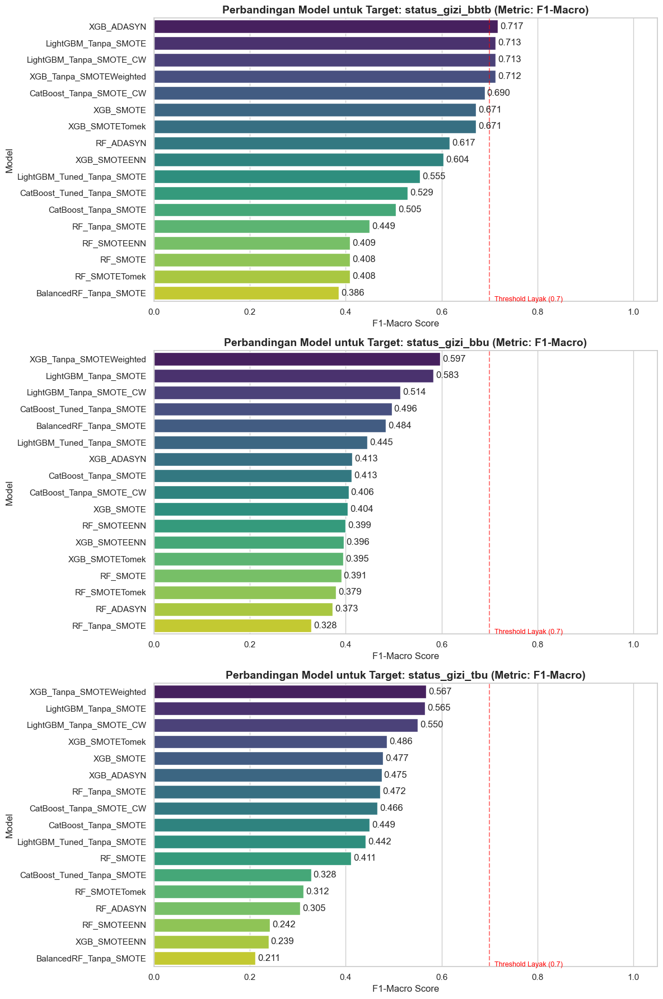

In [52]:
# REKAPITULASI & PERBANDINGAN PERFORMA (IMPROVED)
print('TABEL PERBANDINGAN PERFORMA - FOKUS PADA METRIK UTAMA')
print('=' * 90)

# Gunakan dictionary hasil yang tersedia (prioritas: advanced -> basic)
source_results = all_results_advanced if 'all_results_advanced' in locals() else (all_model_results if 'all_model_results' in locals() else {})

if not source_results:
    print("[ERROR] Tidak ditemukan variabel hasil training (all_results_advanced atau all_results).")
else:
    comparison_data = []

    # Loop melalui nested dictionary: Target -> Model Name -> Metrics
    for target_name, models in source_results.items():
        for model_name, res in models.items():

            # Helper untuk mengambil value aman (handle key yang mungkin beda nama)
            def get_metric(key_list, default=0):
                for k in key_list:
                    if k in res: return res[k]
                return default

            display_model = model_name.replace('Original', 'Tanpa_SMOTE')

            entry = {
                'Target': target_name,
                'Model': display_model,
                'Accuracy': res.get('accuracy', 0),
                'Precision': get_metric(['precision', 'precision_weighted'], 0),
                'Recall': get_metric(['recall', 'recall_weighted'], 0),
                'F1-Score': get_metric(['f1_score', 'f1_weighted'], 0),
                'F1-Weighted': get_metric(['f1_weighted', 'f1_score'], 0),
                'Precision-Macro': res.get('precision_macro', 0),
                'Recall-Macro': res.get('recall_macro', 0),
                'F1-Macro': res.get('f1_macro', 0),
                'ROC-AUC': res.get('roc_auc', 0),
                # Cross-Validation Metrics (opsional)
                'CV-F1': get_metric(['cv_f1_macro', 'cv_f1'], 0),
                'CV-Acc': get_metric(['cv_accuracy', 'cv_acc'], 0)
            }
            comparison_data.append(entry)

    # Buat DataFrame
    df_compare = pd.DataFrame(comparison_data)

    # Urutkan: Per Target, lalu Performa F1-Macro Tertinggi di atas
    df_compare = df_compare.sort_values(by=['Target', 'F1-Macro'], ascending=[True, False])

    # --- 1. TAMPILAN TABEL DENGAN HIGHLIGHT (Jupyter Notebook Friendly) ---
    print("\n[TABEL PERFORMA LENGKAP]")

    # Fungsi styling untuk highlight nilai max per kolom
    def highlight_max(s):
        if s.dtype == 'object': return ['' for _ in s]
        is_max = s == s.max()
        return ['background-color: lightgreen' if v else '' for v in is_max]

    # Menampilkan tabel string yang rapi (untuk console/log)
    # Format angka 4 desimal
    print(df_compare.to_string(index=False, float_format="{:.4f}".format))

    # --- 2. VISUALISASI PERBANDINGAN (Bar Chart) ---
    print("\n" + "="*90)
    print("[VISUALISASI PERBANDINGAN F1-MACRO]")

    # Set style plot
    sns.set(style="whitegrid")

    # Ambil daftar target unik
    targets = df_compare['Target'].unique()

    plt.figure(figsize=(12, 6 * len(targets)))

    for i, target in enumerate(targets):
        plt.subplot(len(targets), 1, i+1)

        # Filter data per target
        data_target = df_compare[df_compare['Target'] == target]

        # Plot Bar Chart
        ax = sns.barplot(
            data=data_target,
            y='Model',
            x='F1-Macro',
            palette='viridis',
            hue='Model',
            legend=False
        )

        # Tambahkan label angka di ujung bar
        for container in ax.containers:
            ax.bar_label(container, fmt='%.3f', padding=3)

        plt.title(f'Perbandingan Model untuk Target: {target} (Metric: F1-Macro)', fontsize=14, fontweight='bold')
        plt.xlabel('F1-Macro Score')
        plt.xlim(0, 1.05) # Batas x axis sampai 1.05 biar label muat

        # Garis vertikal batas kelayakan (misal 0.6 atau 0.7)
        plt.axvline(0.7, color='red', linestyle='--', alpha=0.5)
        plt.text(0.71, len(data_target)-0.5, 'Threshold Layak (0.7)', color='red', fontsize=9)

    plt.tight_layout()
    plt.show()

    # --- 3. EXPORT KE EXCEL (Opsional untuk Laporan Skripsi) ---
    # df_compare.to_excel("hasil_perbandingan_model.xlsx", index=False)
    # print("\nFile 'hasil_perbandingan_model.xlsx' berhasil disimpan.")

EVALUASI AKHIR: PERBANDINGAN BASELINE vs ADVANCED STRATEGY


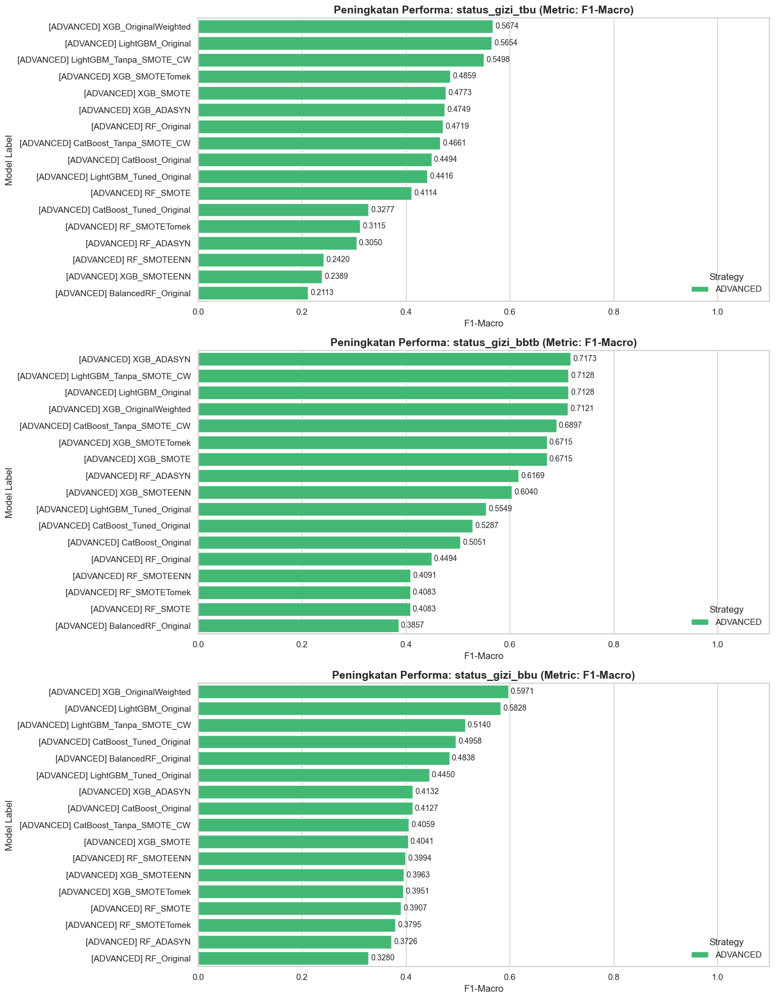


ANALISIS PENINGKATAN PERFORMA (IMPROVEMENT)

>>> TARGET: status_gizi_tbu

  Detail Ranking:
                       Model Label  F1-Macro  Recall-Macro  Accuracy
   [ADVANCED] XGB_OriginalWeighted    0.5674        0.5956    0.8409
      [ADVANCED] LightGBM_Original    0.5654        0.5329    0.8693
[ADVANCED] LightGBM_Tanpa_SMOTE_CW    0.5498        0.5193    0.8580
         [ADVANCED] XGB_SMOTETomek    0.4859        0.4416    0.8352
              [ADVANCED] XGB_SMOTE    0.4773        0.4313    0.8352
             [ADVANCED] XGB_ADASYN    0.4749        0.4297    0.8295
            [ADVANCED] RF_Original    0.4719        0.4193    0.8636
[ADVANCED] CatBoost_Tanpa_SMOTE_CW    0.4661        0.4654    0.8466
      [ADVANCED] CatBoost_Original    0.4494        0.4501    0.8295
[ADVANCED] LightGBM_Tuned_Original    0.4416        0.3960    0.8580
               [ADVANCED] RF_SMOTE    0.4114        0.4075    0.8239
[ADVANCED] CatBoost_Tuned_Original    0.3277        0.3147    0.8580
          

In [53]:
# PERBANDINGAN PERFORMA: ORIGINAL vs ADVANCED (IMPROVED)
print('EVALUASI AKHIR: PERBANDINGAN BASELINE vs ADVANCED STRATEGY')
print('=' * 90)

comparison_data = []

# Helper function untuk ekstrak data
def extract_data(source_dict, tag):
    if not source_dict: return
    for target_name, models in source_dict.items():
        for model_name, res in models.items():
            comparison_data.append({
                'Target': target_name,
                'Category': tag, # Untuk grouping warna di grafik
                'Model Label': f"[{tag}] {model_name}",
                'F1-Score': f"[{tag} {model_name}]", # Added a comma here
                'F1-Macro': res['f1_macro'], # Simpan sebagai float dulu
                'Recall' : res.get('recall', 0),
                'Recall-Macro': res.get('recall_macro', res.get('recall', 0)),
                'Accuracy': res['accuracy']
            })

# 1. KUMPULKAN DATA
extract_data(all_model_results if 'all_results' in locals() else {}, 'ORIGINAL')
extract_data(all_results_advanced if 'all_results_advanced' in locals() else {}, 'ADVANCED')

if not comparison_data:
    print("[ERROR] Tidak ada data hasil training untuk dibandingkan.")
else:
    df_comp = pd.DataFrame(comparison_data)

    # 2. VISUALISASI PERBANDINGAN (Sangat Bagus untuk Skripsi)
    targets = df_comp['Target'].unique()

    sns.set(style="whitegrid")
    plt.figure(figsize=(14, 6 * len(targets)))

    for i, target in enumerate(targets):
        plt.subplot(len(targets), 1, i+1)

        # Filter data per target & Urutkan berdasarkan F1-Macro
        data_target = df_comp[df_comp['Target'] == target].sort_values(by='F1-Macro', ascending=False)

        # Plot
        ax = sns.barplot(
            data=data_target,
            y='Model Label',
            x='F1-Macro',
            hue='Category', # Bedakan warna Original vs Advanced
            palette={'ORIGINAL': 'gray', 'ADVANCED': '#2ecc71'}, # Abu untuk baseline, Hijau untuk advanced
            dodge=False
        )

        # Tambahkan label angka
        for container in ax.containers:
            ax.bar_label(container, fmt='%.4f', padding=3, fontsize=10)

        plt.title(f'Peningkatan Performa: {target} (Metric: F1-Macro)', fontsize=14, fontweight='bold')
        plt.xlim(0, 1.1) # Memberi ruang untuk label
        plt.legend(title='Strategy', loc='lower right')

    plt.tight_layout()
    plt.show()

    # 3. TABEL ANALISIS & DELTA IMPROVEMENT
    print("\n" + "="*90)
    print("ANALISIS PENINGKATAN PERFORMA (IMPROVEMENT)")
    print("="*90)

    for target in targets:
        print(f"\n>>> TARGET: {target}")
        df_t = df_comp[df_comp['Target'] == target]

        # Cari Juara di kategori Original & Advanced
        best_orig = df_t[df_t['Category'] == 'ORIGINAL'].sort_values('F1-Macro', ascending=False).head(1)
        best_adv = df_t[df_t['Category'] == 'ADVANCED'].sort_values('F1-Macro', ascending=False).head(1)

        if not best_orig.empty and not best_adv.empty:
            score_orig = best_orig['F1-Macro'].values[0]
            name_orig = best_orig['Model Label'].values[0]

            score_adv = best_adv['F1-Macro'].values[0]
            name_adv = best_adv['Model Label'].values[0]

            delta = score_adv - score_orig
            pct_change = (delta / score_orig) * 100

            print(f"  • Baseline Terbaik : {score_orig:.4f} ({name_orig})")
            print(f"  • Advanced Terbaik : {score_adv:.4f} ({name_adv})")

            if delta > 0:
                print(f"  [RESULT] ✅ TERJADI PENINGKATAN sebesar +{pct_change:.2f}% ({delta:+.4f} poin)")
            else:
                print(f"  [RESULT] ⚠️ TIDAK ADA PENINGKATAN (Baseline lebih baik/sama).")

        # Tampilkan Tabel Detail Terurut
        print("\n  Detail Ranking:")
        display_cols = ['Model Label', 'F1-Macro', 'Recall-Macro', 'Accuracy']
        print(df_t.sort_values('F1-Macro', ascending=False)[display_cols].to_string(index=False, float_format="{:.4f}".format))
        print("-" * 50)

In [54]:
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from imblearn.ensemble import BalancedRandomForestClassifier

print('ENHANCEMENT: ExtraTrees + Ensemble Soft Voting')
print('=' * 90)

# Pastikan all_results_advanced tersedia
if 'all_results_advanced' not in locals():
    all_results_advanced = {}

# Default params jika belum ada
default_rf_params = {
    'n_estimators': 300,
    'max_depth': 18,
    'min_samples_split': 4,
    'min_samples_leaf': 2,
    'max_features': 'sqrt',
    'class_weight': 'balanced_subsample',
    'random_state': RANDOM_STATE,
    'n_jobs': -1
}
default_et_params = {
    'n_estimators': 400,
    'max_depth': None,
    'min_samples_split': 3,
    'min_samples_leaf': 1,
    'max_features': 'sqrt',
    'class_weight': 'balanced',
    'random_state': RANDOM_STATE,
    'n_jobs': -1
}
default_xgb_params = {
    'n_estimators': 300,
    'max_depth': 6,
    'learning_rate': 0.05,
    'subsample': 0.85,
    'colsample_bytree': 0.85,
    'min_child_weight': 2,
    'gamma': 0.1,
    'random_state': RANDOM_STATE,
    'eval_metric': 'mlogloss',
    'n_jobs': -1,
    'verbosity': 0
}

# Helper untuk resolve key target di data_splits
def resolve_target_col(target_name):
    if 'target_info' in locals() and target_name in target_info:
        return target_info[target_name].get('column', target_name)
    return target_name

# Helper soft voting
def soft_vote_predict(models, X):
    probas = [m.predict_proba(X) for m in models]
    avg_proba = np.mean(probas, axis=0)
    y_pred = np.argmax(avg_proba, axis=1)
    return y_pred, avg_proba

# Loop setiap target
for target_name in data_splits_resampled.keys():
    print(f"\n{'>'*10} TARGET: {target_name} {'<'*10}")

    # Ambil data test asli
    target_col = resolve_target_col(target_name)
    if target_col not in data_splits:
        if target_name in data_splits:
            target_col = target_name
        else:
            target_col = list(data_splits.keys())[0]
            print(f"[WARN] target_col tidak ditemukan. Fallback ke {target_col}.")
    X_test = data_splits[target_col]['X_test']
    y_test = data_splits[target_col]['y_test']

    # Siapkan kandidat metode resampling
    resampled_dict = data_splits_resampled[target_name]['train_variations']
    candidate_methods = [
        'Original', 'SMOTETomek', 'SMOTEENN', 'ADASYN', 'SMOTE', 'RandomOverSampler'
    ]
    candidate_methods = [m for m in candidate_methods if m in resampled_dict]
    if not candidate_methods:
        candidate_methods = list(resampled_dict.keys())

    best = None
    best_method = None

    # Coba beberapa metode & pilih terbaik (F1-Macro tertinggi)
    for method_used in candidate_methods:
        X_train, y_train = resampled_dict[method_used]
        use_weights = True if method_used == 'Original' else False
        sample_weight = compute_sample_weight(class_weight='balanced', y=y_train) if use_weights else None

        # RF params
        rf_params = default_rf_params.copy()
        if 'tuned_params' in locals():
            rf_params.update(tuned_params.get(f'{target_name}_RF', {}))
        rf_params['random_state'] = RANDOM_STATE
        rf_params['n_jobs'] = -1
        rf_params['class_weight'] = rf_params.get('class_weight', 'balanced_subsample')
        rf = RandomForestClassifier(**rf_params)
        if sample_weight is not None:
            rf.fit(X_train, y_train, sample_weight=sample_weight)
        else:
            rf.fit(X_train, y_train)

        # ExtraTrees
        et_params = default_et_params.copy()
        et = ExtraTreesClassifier(**et_params)
        if sample_weight is not None:
            et.fit(X_train, y_train, sample_weight=sample_weight)
        else:
            et.fit(X_train, y_train)

        # Balanced RF untuk data Original (optional)
        brf = None
        if method_used == 'Original':
            brf = BalancedRandomForestClassifier(
                n_estimators=300, sampling_strategy='all', replacement=True,
                class_weight='balanced', random_state=RANDOM_STATE, n_jobs=-1
            )
            brf.fit(X_train, y_train)

        # XGBoost params
        xgb_params = default_xgb_params.copy()
        if 'tuned_params' in locals():
            xgb_params.update(tuned_params.get(f'{target_name}_XGB', {}))
        num_class = len(np.unique(y_train))
        xgb_params.update({
            'objective': 'multi:softprob',
            'num_class': num_class,
            'eval_metric': 'mlogloss',
            'random_state': RANDOM_STATE,
            'n_jobs': -1,
            'verbosity': 0
        })
        xgb_model = xgb.XGBClassifier(**xgb_params)
        if sample_weight is not None:
            xgb_model.fit(X_train, y_train, sample_weight=sample_weight)
        else:
            xgb_model.fit(X_train, y_train)

        # Simpan hasil ExtraTrees tunggal
        y_pred_et = et.predict(X_test)
        f1_et = f1_score(y_test, y_pred_et, average='macro', zero_division=0)
        rec_et = recall_score(y_test, y_pred_et, average='macro', zero_division=0)
        acc_et = accuracy_score(y_test, y_pred_et)
        if target_name not in all_results_advanced:
            all_results_advanced[target_name] = {}
        all_results_advanced[target_name][f'ExtraTrees_{method_used}'] = {
            'f1_macro': f1_et,
            'recall_macro': rec_et,
            'accuracy': acc_et,
            'y_pred': y_pred_et,
            'method': method_used
        }

        # Ensemble soft voting
        models = [rf, et, xgb_model] + ([brf] if brf is not None else [])
        y_pred, _ = soft_vote_predict(models, X_test)

        f1_mac = f1_score(y_test, y_pred, average='macro', zero_division=0)
        rec_mac = recall_score(y_test, y_pred, average='macro', zero_division=0)
        acc = accuracy_score(y_test, y_pred)

        print(f"Method: {method_used} | ExtraTrees F1={f1_et:.4f} | Ensemble F1={f1_mac:.4f}")

        if (best is None) or (f1_mac > best['f1_macro']):
            best = {
                'f1_macro': f1_mac,
                'recall_macro': rec_mac,
                'accuracy': acc,
                'y_pred': y_pred,
                'method': method_used
            }
            best_method = method_used

    # Simpan best ensemble
    if target_name not in all_results_advanced:
        all_results_advanced[target_name] = {}
    model_key = f'EnsembleSoft_{best_method}'
    all_results_advanced[target_name][model_key] = best

print('\n' + '=' * 90)
print('✓ ExtraTrees + ensemble selesai dan disimpan ke all_results_advanced')

ENHANCEMENT: ExtraTrees + Ensemble Soft Voting

>>>>>>>>>> TARGET: status_gizi_tbu <<<<<<<<<<
Method: Original | ExtraTrees F1=0.2629 | Ensemble F1=0.4971
Method: SMOTETomek | ExtraTrees F1=0.2763 | Ensemble F1=0.3106
Method: SMOTEENN | ExtraTrees F1=0.1834 | Ensemble F1=0.2467
Method: ADASYN | ExtraTrees F1=0.2763 | Ensemble F1=0.3106
Method: SMOTE | ExtraTrees F1=0.2763 | Ensemble F1=0.3074

>>>>>>>>>> TARGET: status_gizi_bbtb <<<<<<<<<<
Method: Original | ExtraTrees F1=0.2730 | Ensemble F1=0.4871
Method: SMOTETomek | ExtraTrees F1=0.3744 | Ensemble F1=0.4721
Method: SMOTEENN | ExtraTrees F1=0.3276 | Ensemble F1=0.5897
Method: ADASYN | ExtraTrees F1=0.3851 | Ensemble F1=0.4646
Method: SMOTE | ExtraTrees F1=0.3744 | Ensemble F1=0.4721

>>>>>>>>>> TARGET: status_gizi_bbu <<<<<<<<<<
Method: Original | ExtraTrees F1=0.2516 | Ensemble F1=0.3877
Method: SMOTETomek | ExtraTrees F1=0.3673 | Ensemble F1=0.4025
Method: SMOTEENN | ExtraTrees F1=0.3478 | Ensemble F1=0.3788
Method: ADASYN | Extra

In [55]:
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score
from sklearn.utils.class_weight import compute_sample_weight
import xgboost as xgb

print('TUNING XGBOOST (ORIGINAL + CLASS WEIGHT, CV)')
print('=' * 90)

optuna.logging.set_verbosity(optuna.logging.WARNING)

# Pastikan all_results_advanced tersedia
if 'all_results_advanced' not in locals():
    all_results_advanced = {}

def resolve_target_col(target_name):
    if 'target_info' in locals() and target_name in target_info:
        return target_info[target_name].get('column', target_name)
    return target_name

cv_inner = StratifiedKFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE)
n_trials = 30

for target_name in data_splits_resampled.keys():
    print(f"\n{'>'*10} TUNING TARGET: {target_name} {'<'*10}")
    target_col = resolve_target_col(target_name)
    if target_col not in data_splits:
        if target_name in data_splits:
            target_col = target_name
        else:
            target_col = list(data_splits.keys())[0]
            print(f"[WARN] target_col tidak ditemukan. Fallback ke {target_col}.")
    X_train = data_splits[target_col]['X_train']
    y_train = data_splits[target_col]['y_train']
    X_test = data_splits[target_col]['X_test']
    y_test = data_splits[target_col]['y_test']

    num_class = len(np.unique(y_train))

    def objective_xgb(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 200, 700, step=50),
            'max_depth': trial.suggest_int('max_depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
            'gamma': trial.suggest_float('gamma', 0.0, 1.0),
            'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 5.0),
            'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 2.0),
            'objective': 'multi:softprob',
            'num_class': num_class,
            'eval_metric': 'mlogloss',
            'random_state': RANDOM_STATE,
            'n_jobs': -1,
            'verbosity': 0
        }
        scores = []
        for train_idx, val_idx in cv_inner.split(X_train, y_train):
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
            sw = compute_sample_weight(class_weight='balanced', y=y_tr)
            model = xgb.XGBClassifier(**params)
            model.fit(X_tr, y_tr, sample_weight=sw)
            y_pred = model.predict(X_val)
            scores.append(f1_score(y_val, y_pred, average='macro', zero_division=0))
        return float(np.mean(scores))

    study = optuna.create_study(direction='maximize', sampler=TPESampler(seed=RANDOM_STATE))
    study.optimize(objective_xgb, n_trials=n_trials, show_progress_bar=True)

    best_params = study.best_params
    best_params.update({
        'objective': 'multi:softprob',
        'num_class': num_class,
        'eval_metric': 'mlogloss',
        'random_state': RANDOM_STATE,
        'n_jobs': -1,
        'verbosity': 0
    })

    # Train final model dengan class weights
    sample_weight = compute_sample_weight(class_weight='balanced', y=y_train)
    best_model = xgb.XGBClassifier(**best_params)
    best_model.fit(X_train, y_train, sample_weight=sample_weight)
    y_pred_test = best_model.predict(X_test)

    f1_mac = f1_score(y_test, y_pred_test, average='macro', zero_division=0)
    rec_mac = recall_score(y_test, y_pred_test, average='macro', zero_division=0)
    acc = accuracy_score(y_test, y_pred_test)

    if target_name not in all_results_advanced:
        all_results_advanced[target_name] = {}
    all_results_advanced[target_name]['XGB_OriginalWeighted_TunedCV'] = {
        'model': best_model,
        'f1_macro': f1_mac,
        'recall_macro': rec_mac,
        'accuracy': acc,
        'y_pred': y_pred_test
    }

    print(f"Best CV F1-Macro: {study.best_value:.4f}")
    print(f"Test F1-Macro: {f1_mac:.4f} | Recall-Macro: {rec_mac:.4f} | Acc: {acc:.4f}")

print('\n' + '=' * 90)
print('✓ Tuning XGBoost (Original + class weights) selesai')

TUNING XGBOOST (ORIGINAL + CLASS WEIGHT, CV)

>>>>>>>>>> TUNING TARGET: status_gizi_tbu <<<<<<<<<<


Best trial: 24. Best value: 0.487523: 100%|██████████| 30/30 [03:21<00:00,  6.70s/it]


Best CV F1-Macro: 0.4875
Test F1-Macro: 0.5026 | Recall-Macro: 0.5468 | Acc: 0.8125

>>>>>>>>>> TUNING TARGET: status_gizi_bbtb <<<<<<<<<<


Best trial: 24. Best value: 0.514771: 100%|██████████| 30/30 [03:21<00:00,  6.71s/it]


Best CV F1-Macro: 0.5148
Test F1-Macro: 0.5126 | Recall-Macro: 0.5470 | Acc: 0.8523

>>>>>>>>>> TUNING TARGET: status_gizi_bbu <<<<<<<<<<


Best trial: 26. Best value: 0.643966: 100%|██████████| 30/30 [03:33<00:00,  7.13s/it]


Best CV F1-Macro: 0.6440
Test F1-Macro: 0.5867 | Recall-Macro: 0.5871 | Acc: 0.8409

✓ Tuning XGBoost (Original + class weights) selesai


In [56]:
print('EVALUASI AKHIR: PEMENUHAN SUCCESS CRITERIA (SKRIPSI)')
print('=' * 90)
print('🎯 Target UTAMA  : F1-Macro > 75% AND Recall-Macro > 75%')
print('🎯 Target SEKUNDER: Accuracy > 80%')
print('=' * 90)

# 1. GABUNGKAN DATA (Original + Advanced)
combined_eval = []

# Helper function untuk memproses dictionary hasil
def process_results(source_dict, tag):
    if not source_dict: return

    if tag == 'Basic': # all_model_results has a flat structure: {composite_key: metrics_dict}
        for composite_key, metrics_dict in source_dict.items():
            # Parse target name from the composite key 'target | method | algo'
            target_name = composite_key.split(' | ')[0]
            model_name = composite_key # Keep full composite key as model name
            model_name = model_name.replace('Original', 'Tanpa_SMOTE')

            f1_mac = metrics_dict.get('f1_macro', 0)
            rec_mac = metrics_dict.get('recall_macro', metrics_dict.get('recall', 0))
            prec_mac = metrics_dict.get('precision_macro', metrics_dict.get('precision', 0))
            f1_score = metrics_dict.get('f1', metrics_dict.get('f1_score', 0))
            f1_weighted = metrics_dict.get('f1_weighted', metrics_dict.get('f1_w', 0))
            rec = metrics_dict.get('recall', metrics_dict.get('recall_micro', rec_mac))
            prec = metrics_dict.get('precision', metrics_dict.get('precision_micro', prec_mac))
            acc = metrics_dict.get('accuracy', 0)


            is_passed = (f1_mac > 0.75) and (rec_mac > 0.75)
            is_almost = (f1_mac > 0.70) or (rec_mac > 0.70)

            if is_passed:
                status = '✅ PASSED'
            elif is_almost:
                status = '⚠️ ALMOST'
            else:
                status = '❌ FAILED'

            combined_eval.append({
                'Target': target_name,
                'Strategy': tag,
                'Model Name': model_name,
                'F1-Macro': f1_mac,
                'Recall-Macro': rec_mac,
                'Precision-Macro': prec_mac,
                'F1-Score': f1_score,
                'F1-Weighted': f1_weighted,
                'Recall': rec,
                'Precision': prec,
                'Accuracy': acc,
                'Status': status
            })
    else: # Advanced results have nested structure: {target_name: {model_type: metrics_dict}}
        for target_name, models_for_target in source_dict.items():
            for model_name, metrics_dict in models_for_target.items():
                model_name = model_name.replace('Original', 'Tanpa_SMOTE')
                f1_mac = metrics_dict.get('f1_macro', 0)
                rec_mac = metrics_dict.get('recall_macro', metrics_dict.get('recall', 0))
                prec_mac = metrics_dict.get('precision_macro', metrics_dict.get('precision', 0))
                f1_score = metrics_dict.get('f1', metrics_dict.get('f1_score', 0))
                f1_weighted = metrics_dict.get('f1_weighted', metrics_dict.get('f1_w', 0))
                rec = metrics_dict.get('recall', metrics_dict.get('recall_micro', rec_mac))
                prec = metrics_dict.get('precision', metrics_dict.get('precision_micro', prec_mac))
                acc = metrics_dict.get('accuracy', 0)


                is_passed = (f1_mac > 0.75) and (rec_mac > 0.75)
                is_almost = (f1_mac > 0.70) or (rec_mac > 0.70)

                if is_passed:
                    status = '✅ PASSED'
                elif is_almost:
                    status = '⚠️ ALMOST'
                else:
                    status = '❌ FAILED'

                combined_eval.append({
                    'Target': target_name,
                    'Strategy': tag,
                    'Model Name': model_name,
                    'F1-Macro': f1_mac,
                    'Recall-Macro': rec_mac,
                    'Precision-Macro': prec_mac,
                    'F1-Score': f1_score,
                    'F1-Weighted': f1_weighted,
                    'Recall': rec,
                    'Precision': prec,
                    'Accuracy': acc,
                    'Status': status
                })


 # Proses kedua sumber data
process_results(all_model_results if 'all_model_results' in locals() else {}, 'Basic')
process_results(all_results_advanced if 'all_results_advanced' in locals() else {}, 'Advanced')

# 2. BUAT DATAFRAME & STYLING
if not combined_eval:
    print("Belum ada data model yang dilatih.")
else:
    df_eval = pd.DataFrame(combined_eval)

    # Urutkan berdasarkan Target dan Score Tertinggi
    df_eval = df_eval.sort_values(by=['Target', 'F1-Macro'], ascending=[True, False])

    # Fungsi untuk mewarnai baris/sel
    def color_status(val):
        color = 'white'
        if val == '✅ PASSED':
            color = '#d4edda' # Hijau Muda
        elif val == '⚠️ ALMOST':
            color = '#fff3cd' # Kuning Muda
        elif val == '❌ FAILED':
            color = '#f8d7da' # Merah Muda
        return f'background-color: {color}; color: black; font-weight: bold'

    def highlight_score(val):
        # Highlight hijau jika > 0.75
        color = 'green' if val > 0.75 else 'red'
        weight = 'bold' if val > 0.75 else 'normal'
        return f'color: {color}; font-weight: {weight}'

    # Tampilkan Tabel
    print("\n[REKAPITULASI KELULUSAN MODEL]")

    # Kita print string dulu untuk log console standar
    # (Di Jupyter Notebook, Anda bisa display(styled_df) untuk hasil cantik)
    pd.options.display.float_format = '{:.2%}'.format
    print(df_eval[['Target', 'Model Name', 'F1-Macro', 'Recall-Macro', 'Precision-Macro', 'F1-Score', 'F1-Weighted', 'Recall', 'Precision', 'Accuracy', 'Status']].to_string(index=False))

    # 3. KESIMPULAN OTOMATIS
    print("\n" + "="*90)
    print("KESIMPULAN AKHIR & REKOMENDASI")
    print("="*90)

    unique_targets = df_eval['Target'].unique()

    for t in unique_targets:
        df_t = df_eval[df_eval['Target'] == t]

        # Cari yang PASSED
        passed_models = df_t[df_t['Status'] == '✅ PASSED']

        print(f"\n>>> Target: {t}")
        if not passed_models.empty:
            best_model = passed_models.iloc[0] # Karena sudah diurutkan, yang pertama pasti score tertinggi
            print(f"  🎉 SUCCESS! Target terpenuhi.")
            print(f"  🏆 Rekomendasi Model: {best_model['Model Name']}")
            print(f"     (F1-Macro: {best_model['F1-Macro']:.2%}, Recall: {best_model['Recall-Macro']:.2%}, Precision: {best_model['Precision-Macro']:.2%})")
            print("     Alasan: Memiliki F1-Macro tertinggi di antara model yang lolos kriteria.")
        else:
            # Jika tidak ada yang lolos, ambil yang terbaik
            best_model = df_t.iloc[0]
            print(f"  ⚠️ WARNING: Belum ada model yang menembus threshold 75% untuk F1-Macro dan Recall-Macro.")
            print(f"  💡 Model Terbaik Sementara: {best_model['Model Name']}")
            print(f"     (F1-Macro: {best_model['F1-Macro']:.2%}, Recall: {best_model['Recall-Macro']:.2%}, Precision: {best_model['Precision-Macro']:.2%})")
            print("     Saran: Coba tuning hyperparameter lebih lanjut atau tambah fitur baru.")

print('\n' + '='*90)


EVALUASI AKHIR: PEMENUHAN SUCCESS CRITERIA (SKRIPSI)
🎯 Target UTAMA  : F1-Macro > 75% AND Recall-Macro > 75%
🎯 Target SEKUNDER: Accuracy > 80%

[REKAPITULASI KELULUSAN MODEL]
          Target                                    Model Name  F1-Macro  Recall-Macro  Precision-Macro  F1-Score  F1-Weighted  Recall  Precision  Accuracy    Status
status_gizi_bbtb                                    XGB_ADASYN    71.73%        64.81%           83.80%    88.56%       88.56%  89.20%     88.49%    89.20% ⚠️ ALMOST
status_gizi_bbtb                          LightGBM_Tanpa_SMOTE    71.28%        61.74%           89.47%    89.20%       89.20%  90.34%     89.80%    90.34% ⚠️ ALMOST
status_gizi_bbtb                       LightGBM_Tanpa_SMOTE_CW    71.28%        61.74%           89.47%    89.20%       89.20%  90.34%     89.80%    90.34% ⚠️ ALMOST
status_gizi_bbtb                       XGB_Tanpa_SMOTEWeighted    71.21%        66.39%           80.28%    87.95%       87.95%  88.07%     88.05%    88.07% ⚠️ AL

In [57]:
import os
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import joblib

print('CHECK OVERFITTING: TRAIN vs TEST (BEST MODEL PER TARGET)')
print('=' * 90)

G = globals()

def normalize_target_name(name):
    if name is None:
        return None
    n = str(name).strip()
    low = n.lower()
    if 'tbu' in low and 'status_gizi_tbu' in low:
        return 'status_gizi_tbu'
    if 'tbu' in low and 'status_gizi_tbu' not in low:
        return 'status_gizi_tbu'
    if 'bbtb' in low:
        return 'status_gizi_bbtb'
    if 'bbu' in low:
        return 'status_gizi_bbu'
    return n

def find_split_by_yname(target_name):
    # Cari berdasarkan nama Series y di data_splits
    if 'data_splits' in G:
        for k, v in G['data_splits'].items():
            y_tr = v.get('y_train')
            y_te = v.get('y_test')
            if (getattr(y_tr, 'name', None) == target_name) or (getattr(y_te, 'name', None) == target_name):
                return k
    # Cari berdasarkan nama Series y di data_splits_resampled
    if 'data_splits_resampled' in G:
        for k, v in G['data_splits_resampled'].items():
            y_te = v.get('y_test')
            if getattr(y_te, 'name', None) == target_name:
                return k
            variations = v.get('train_variations', {})
            for _, pair in variations.items():
                if not isinstance(pair, (list, tuple)) or len(pair) != 2:
                    continue
                y_tr = pair[1]
                if getattr(y_tr, 'name', None) == target_name:
                    return k
    return None

def resolve_split_key(target_name_raw):
    target_name = normalize_target_name(target_name_raw)
    # 1) Direct match
    if 'data_splits' in G and target_name in G['data_splits']:
        return target_name
    if 'data_splits_resampled' in G and target_name in G['data_splits_resampled']:
        return target_name
    # 2) Match via target_info (label -> column)
    if 'target_info' in G:
        target_info = G['target_info']
        if target_name in target_info:
            col = target_info[target_name].get('column', target_name)
            if 'data_splits' in G and col in G['data_splits']:
                return col
            if 'data_splits_resampled' in G and col in G['data_splits_resampled']:
                return col
        # 3) Match when target_name is column, but splits keyed by label (TB/U, BB/TB, BB/U)
        for name, info in target_info.items():
            col = info.get('column')
            if col == target_name:
                if 'data_splits' in G and name in G['data_splits']:
                    return name
                if 'data_splits_resampled' in G and name in G['data_splits_resampled']:
                    return name
    # 4) Fallback by y.name
    return find_split_by_yname(target_name)

def get_model_feature_names(model):
    if hasattr(model, 'feature_names_in_'):
        return list(model.feature_names_in_)
    if hasattr(model, 'feature_name_'):
        return list(model.feature_name_)
    if hasattr(model, 'booster_') and hasattr(model.booster_, 'feature_name'):
        return list(model.booster_.feature_name())
    return None

def align_features(model, X_df):
    cols = get_model_feature_names(model)
    if cols:
        missing = [c for c in cols if c not in X_df.columns]
        if missing:
            for c in missing:
                X_df[c] = 0
        # Drop extra columns and reorder
        X_df = X_df[cols]
    return X_df

def eval_model(model, X_eval, y_eval):
    y_pred = model.predict(X_eval)
    y_proba = model.predict_proba(X_eval) if hasattr(model, 'predict_proba') else None
    try:
        roc = roc_auc_score(y_eval, y_proba, multi_class='ovr', average='weighted') if y_proba is not None else None
    except Exception:
        roc = None
    return {
        'accuracy': accuracy_score(y_eval, y_pred),
        'precision_macro': precision_score(y_eval, y_pred, average='macro', zero_division=0),
        'recall_macro': recall_score(y_eval, y_pred, average='macro', zero_division=0),
        'f1_macro': f1_score(y_eval, y_pred, average='macro', zero_division=0),
        'precision_weighted': precision_score(y_eval, y_pred, average='weighted', zero_division=0),
        'recall_weighted': recall_score(y_eval, y_pred, average='weighted', zero_division=0),
        'f1_weighted': f1_score(y_eval, y_pred, average='weighted', zero_division=0),
        'roc_auc': roc
    }

# Debug keys
if 'data_splits' in G:
    print('[INFO] data_splits keys:', list(G['data_splits'].keys())[:10])
if 'data_splits_resampled' in G:
    print('[INFO] data_splits_resampled keys:', list(G['data_splits_resampled'].keys())[:10])

# 1) Kumpulkan kandidat model dari basic + advanced (yang punya objek model)
candidates = {}  # {target: {model_name: res}}
if 'all_model_results' in G:
    for run_id, res in G['all_model_results'].items():
        if not isinstance(res, dict):
            continue
        model_obj = res.get('model_obj', res.get('model'))
        if model_obj is None:
            continue
        target_name = run_id.split(' | ')[0]
        if target_name not in candidates:
            candidates[target_name] = {}
        candidates[target_name][run_id] = res
if 'all_results_advanced' in G:
    for target_name, models in G['all_results_advanced'].items():
        for model_name, res in models.items():
            if not isinstance(res, dict):
                continue
            model_obj = res.get('model_obj', res.get('model'))
            if model_obj is None:
                continue
            if target_name not in candidates:
                candidates[target_name] = {}
            candidates[target_name][model_name] = res

# 2) Pilih model terbaik per target, evaluasi train vs test
overfit_rows = []
best_models = {}
for target_name_raw, models in candidates.items():
    target_name = normalize_target_name(target_name_raw)
    # pilih terbaik berdasarkan f1_macro
    best_name, best_res = max(models.items(), key=lambda x: x[1].get('f1_macro', -1))
    model = best_res.get('model_obj', best_res.get('model'))
    if model is None:
        continue
    split_key = resolve_split_key(target_name)
    if split_key is None:
        print(f"[SKIP] {target_name_raw}: split tidak ditemukan.")
        continue
    # ambil split
    if 'data_splits' in G and split_key in G['data_splits']:
        split = G['data_splits'][split_key]
        X_tr, y_tr = split['X_train'], split['y_train']
        X_te, y_te = split['X_test'], split['y_test']
    elif 'data_splits_resampled' in G and split_key in G['data_splits_resampled']:
        split = G['data_splits_resampled'][split_key]
        X_te, y_te = split['X_test'], split['y_test']
        X_tr, y_tr = split['train_variations']['Original'] if 'Original' in split['train_variations'] else list(split['train_variations'].values())[0]
    else:
        print(f"[SKIP] {target_name_raw}: split tidak ditemukan.")
        continue
    # drop fitur redundan jika ada
    drops = best_res.get('dropped_features', [])
    if drops:
        X_tr = X_tr.drop(columns=[c for c in drops if c in X_tr.columns], errors='ignore')
        X_te = X_te.drop(columns=[c for c in drops if c in X_te.columns], errors='ignore')
    # align fitur sesuai model (tambahkan kolom hilang dengan 0)
    X_tr = align_features(model, X_tr)
    X_te = align_features(model, X_te)

    train_metrics = eval_model(model, X_tr, y_tr)
    test_metrics = eval_model(model, X_te, y_te)
    gap = train_metrics['f1_macro'] - test_metrics['f1_macro']
    status = 'OVERFIT' if gap > 0.10 else 'OK'

    overfit_rows.append({
        'Target': target_name,
        'Model': best_name,
        'Train_F1_Macro': train_metrics['f1_macro'],
        'Test_F1_Macro': test_metrics['f1_macro'],
        'Gap_F1_Macro': gap,
        'Train_Acc': train_metrics['accuracy'],
        'Test_Acc': test_metrics['accuracy'],
        'Status': status
    })
    best_models[target_name] = {'name': best_name, 'model': model, 'res': best_res}

df_overfit = pd.DataFrame(overfit_rows)
if df_overfit.empty:
    print('[INFO] Tidak ada model yang bisa dicek (objek model belum tersimpan atau split tidak tersedia).')
else:
    print(df_overfit.sort_values('Gap_F1_Macro', ascending=False).to_string(index=False, float_format='{:.4f}'.format))

# 3) Simpan model terbaik per target (berdasarkan F1-Macro)
print('\nSIMPAN MODEL TERBAIK PER TARGET')
print('=' * 60)
os.makedirs('models_best', exist_ok=True)

for target_name, info in best_models.items():
    safe_target = str(target_name).replace('/', '_').replace('\\', '_').lower()
    filename = f"models_best/model_best_{safe_target}.joblib"
    joblib.dump(info['model'], filename)
    print(f"{target_name}: {info['name']} -> {filename}")

print('\n✓ Selesai cek overfitting dan simpan model terbaik')

CHECK OVERFITTING: TRAIN vs TEST (BEST MODEL PER TARGET)
[INFO] data_splits keys: ['status_gizi_tbu', 'status_gizi_bbtb', 'status_gizi_bbu']
[INFO] data_splits_resampled keys: ['status_gizi_tbu', 'status_gizi_bbtb', 'status_gizi_bbu']
          Target                                Model  Train_F1_Macro  Test_F1_Macro  Gap_F1_Macro  Train_Acc  Test_Acc  Status
 status_gizi_bbu                 XGB_OriginalWeighted          0.9809         0.5971        0.3838     0.9914    0.8352 OVERFIT
 status_gizi_tbu status_gizi_tbu | Original | XGBoost          1.0000         0.6452        0.3548     1.0000    0.8636 OVERFIT
status_gizi_bbtb                           XGB_ADASYN          1.0000         0.7173        0.2827     1.0000    0.8920 OVERFIT

SIMPAN MODEL TERBAIK PER TARGET
status_gizi_tbu: status_gizi_tbu | Original | XGBoost -> models_best/model_best_status_gizi_tbu.joblib
status_gizi_bbtb: XGB_ADASYN -> models_best/model_best_status_gizi_bbtb.joblib
status_gizi_bbu: XGB_OriginalWeighted 

## 🎯 Analisis Per Kelas - Model Advanced Terbaik

Classification report detail untuk model advanced terbaik (berdasarkan F1-Macro):

---
# TAHAP 6: DEPLOYMENT
---

In [58]:
import os
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import joblib

print('CHECK OVERFITTING: TRAIN vs TEST (BEST MODEL PER TARGET)')
print('=' * 90)

G = globals()

def normalize_target_name(name):
    if name is None:
        return None
    n = str(name).strip()
    low = n.lower()
    if 'tbu' in low and 'status_gizi_tbu' in low:
        return 'status_gizi_tbu'
    if 'tbu' in low and 'status_gizi_tbu' not in low:
        return 'status_gizi_tbu'
    if 'bbtb' in low:
        return 'status_gizi_bbtb'
    if 'bbu' in low:
        return 'status_gizi_bbu'
    return n

def find_split_by_yname(target_name):
    # Cari berdasarkan nama Series y di data_splits
    if 'data_splits' in G:
        for k, v in G['data_splits'].items():
            y_tr = v.get('y_train')
            y_te = v.get('y_test')
            if (getattr(y_tr, 'name', None) == target_name) or (getattr(y_te, 'name', None) == target_name):
                return k
    # Cari berdasarkan nama Series y di data_splits_resampled
    if 'data_splits_resampled' in G:
        for k, v in G['data_splits_resampled'].items():
            y_te = v.get('y_test')
            if getattr(y_te, 'name', None) == target_name:
                return k
            variations = v.get('train_variations', {})
            for _, pair in variations.items():
                if not isinstance(pair, (list, tuple)) or len(pair) != 2:
                    continue
                y_tr = pair[1]
                if getattr(y_tr, 'name', None) == target_name:
                    return k
    return None

def resolve_split_key(target_name_raw):
    target_name = normalize_target_name(target_name_raw)
    # 1) Direct match
    if 'data_splits' in G and target_name in G['data_splits']:
        return target_name
    if 'data_splits_resampled' in G and target_name in G['data_splits_resampled']:
        return target_name
    # 2) Match via target_info (label -> column)
    if 'target_info' in G:
        target_info = G['target_info']
        if target_name in target_info:
            col = target_info[target_name].get('column', target_name)
            if 'data_splits' in G and col in G['data_splits']:
                return col
            if 'data_splits_resampled' in G and col in G['data_splits_resampled']:
                return col
        # 3) Match when target_name is column, but splits keyed by label (TB/U, BB/TB, BB/U)
        for name, info in target_info.items():
            col = info.get('column')
            if col == target_name:
                if 'data_splits' in G and name in G['data_splits']:
                    return name
                if 'data_splits_resampled' in G and name in G['data_splits_resampled']:
                    return name
    # 4) Fallback by y.name
    return find_split_by_yname(target_name)

def get_model_feature_names(model):
    if hasattr(model, 'feature_names_in_'):
        return list(model.feature_names_in_)
    if hasattr(model, 'feature_name_'):
        return list(model.feature_name_)
    if hasattr(model, 'booster_') and hasattr(model.booster_, 'feature_name'):
        return list(model.booster_.feature_name())
    return None

def align_features(model, X_df):
    cols = get_model_feature_names(model)
    if cols:
        missing = [c for c in cols if c not in X_df.columns]
        if missing:
            for c in missing:
                X_df[c] = 0
        # Drop extra columns and reorder
        X_df = X_df[cols]
    return X_df

def eval_model(model, X_eval, y_eval):
    y_pred = model.predict(X_eval)
    y_proba = model.predict_proba(X_eval) if hasattr(model, 'predict_proba') else None
    try:
        roc = roc_auc_score(y_eval, y_proba, multi_class='ovr', average='weighted') if y_proba is not None else None
    except Exception:
        roc = None
    return {
        'accuracy': accuracy_score(y_eval, y_pred),
        'precision_macro': precision_score(y_eval, y_pred, average='macro', zero_division=0),
        'recall_macro': recall_score(y_eval, y_pred, average='macro', zero_division=0),
        'f1_macro': f1_score(y_eval, y_pred, average='macro', zero_division=0),
        'precision_weighted': precision_score(y_eval, y_pred, average='weighted', zero_division=0),
        'recall_weighted': recall_score(y_eval, y_pred, average='weighted', zero_division=0),
        'f1_weighted': f1_score(y_eval, y_pred, average='weighted', zero_division=0),
        'roc_auc': roc
    }

# Debug keys
if 'data_splits' in G:
    print('[INFO] data_splits keys:', list(G['data_splits'].keys())[:10])
if 'data_splits_resampled' in G:
    print('[INFO] data_splits_resampled keys:', list(G['data_splits_resampled'].keys())[:10])

# 1) Kumpulkan kandidat model dari basic + advanced (yang punya objek model)
candidates = {}  # {target: {model_name: res}}
if 'all_model_results' in G:
    for run_id, res in G['all_model_results'].items():
        if not isinstance(res, dict):
            continue
        model_obj = res.get('model_obj', res.get('model'))
        if model_obj is None:
            continue
        target_name = run_id.split(' | ')[0]
        if target_name not in candidates:
            candidates[target_name] = {}
        candidates[target_name][run_id] = res
if 'all_results_advanced' in G:
    for target_name, models in G['all_results_advanced'].items():
        for model_name, res in models.items():
            if not isinstance(res, dict):
                continue
            model_obj = res.get('model_obj', res.get('model'))
            if model_obj is None:
                continue
            if target_name not in candidates:
                candidates[target_name] = {}
            candidates[target_name][model_name] = res

# 2) Pilih model terbaik per target, evaluasi train vs test
overfit_rows = []
best_models = {}
for target_name_raw, models in candidates.items():
    target_name = normalize_target_name(target_name_raw)
    # pilih terbaik berdasarkan f1_macro
    best_name, best_res = max(models.items(), key=lambda x: x[1].get('f1_macro', -1))
    model = best_res.get('model_obj', best_res.get('model'))
    if model is None:
        continue
    split_key = resolve_split_key(target_name)
    if split_key is None:
        print(f"[SKIP] {target_name_raw}: split tidak ditemukan.")
        continue
    # ambil split
    if 'data_splits' in G and split_key in G['data_splits']:
        split = G['data_splits'][split_key]
        X_tr, y_tr = split['X_train'], split['y_train']
        X_te, y_te = split['X_test'], split['y_test']
    elif 'data_splits_resampled' in G and split_key in G['data_splits_resampled']:
        split = G['data_splits_resampled'][split_key]
        X_te, y_te = split['X_test'], split['y_test']
        X_tr, y_tr = split['train_variations']['Original'] if 'Original' in split['train_variations'] else list(split['train_variations'].values())[0]
    else:
        print(f"[SKIP] {target_name_raw}: split tidak ditemukan.")
        continue
    # drop fitur redundan jika ada
    drops = best_res.get('dropped_features', [])
    if drops:
        X_tr = X_tr.drop(columns=[c for c in drops if c in X_tr.columns], errors='ignore')
        X_te = X_te.drop(columns=[c for c in drops if c in X_te.columns], errors='ignore')
    # align fitur sesuai model (tambahkan kolom hilang dengan 0)
    X_tr = align_features(model, X_tr)
    X_te = align_features(model, X_te)

    train_metrics = eval_model(model, X_tr, y_tr)
    test_metrics = eval_model(model, X_te, y_te)
    gap = train_metrics['f1_macro'] - test_metrics['f1_macro']
    status = 'OVERFIT' if gap > 0.10 else 'OK'

    overfit_rows.append({
        'Target': target_name,
        'Model': best_name,
        'Train_F1_Macro': train_metrics['f1_macro'],
        'Test_F1_Macro': test_metrics['f1_macro'],
        'Gap_F1_Macro': gap,
        'Train_Acc': train_metrics['accuracy'],
        'Test_Acc': test_metrics['accuracy'],
        'Status': status
    })
    best_models[target_name] = {'name': best_name, 'model': model, 'res': best_res}

df_overfit = pd.DataFrame(overfit_rows)
if df_overfit.empty:
    print('[INFO] Tidak ada model yang bisa dicek (objek model belum tersimpan atau split tidak tersedia).')
else:
    print(df_overfit.sort_values('Gap_F1_Macro', ascending=False).to_string(index=False, float_format='{:.4f}'.format))

# 3) Simpan model terbaik per target (berdasarkan F1-Macro)
print('\nSIMPAN MODEL TERBAIK PER TARGET')
print('=' * 60)
os.makedirs('models_best', exist_ok=True)

for target_name, info in best_models.items():
    safe_target = str(target_name).replace('/', '_').replace('\\', '_').lower()
    filename = f"models_best/model_best_{safe_target}.joblib"
    joblib.dump(info['model'], filename)
    print(f"{target_name}: {info['name']} -> {filename}")

print('\n✓ Selesai cek overfitting dan simpan model terbaik')

CHECK OVERFITTING: TRAIN vs TEST (BEST MODEL PER TARGET)
[INFO] data_splits keys: ['status_gizi_tbu', 'status_gizi_bbtb', 'status_gizi_bbu']
[INFO] data_splits_resampled keys: ['status_gizi_tbu', 'status_gizi_bbtb', 'status_gizi_bbu']
          Target                                Model  Train_F1_Macro  Test_F1_Macro  Gap_F1_Macro  Train_Acc  Test_Acc  Status
 status_gizi_bbu                 XGB_OriginalWeighted          0.9809         0.5971        0.3838     0.9914    0.8352 OVERFIT
 status_gizi_tbu status_gizi_tbu | Original | XGBoost          1.0000         0.6452        0.3548     1.0000    0.8636 OVERFIT
status_gizi_bbtb                           XGB_ADASYN          1.0000         0.7173        0.2827     1.0000    0.8920 OVERFIT

SIMPAN MODEL TERBAIK PER TARGET
status_gizi_tbu: status_gizi_tbu | Original | XGBoost -> models_best/model_best_status_gizi_tbu.joblib
status_gizi_bbtb: XGB_ADASYN -> models_best/model_best_status_gizi_bbtb.joblib
status_gizi_bbu: XGB_OriginalWeighted 

FEATURE IMPORTANCE ANALYSIS FOR BEST MODELS

>>>>>>>>>> Target: status_gizi_tbu <<<<<<<<<<


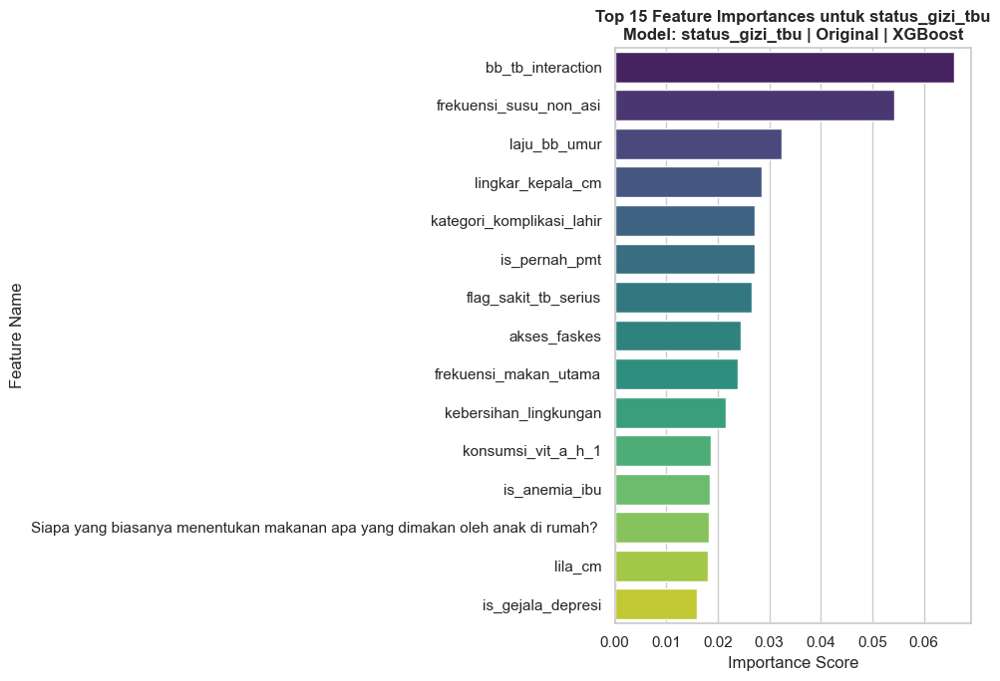


>>>>>>>>>> Target: status_gizi_bbtb <<<<<<<<<<


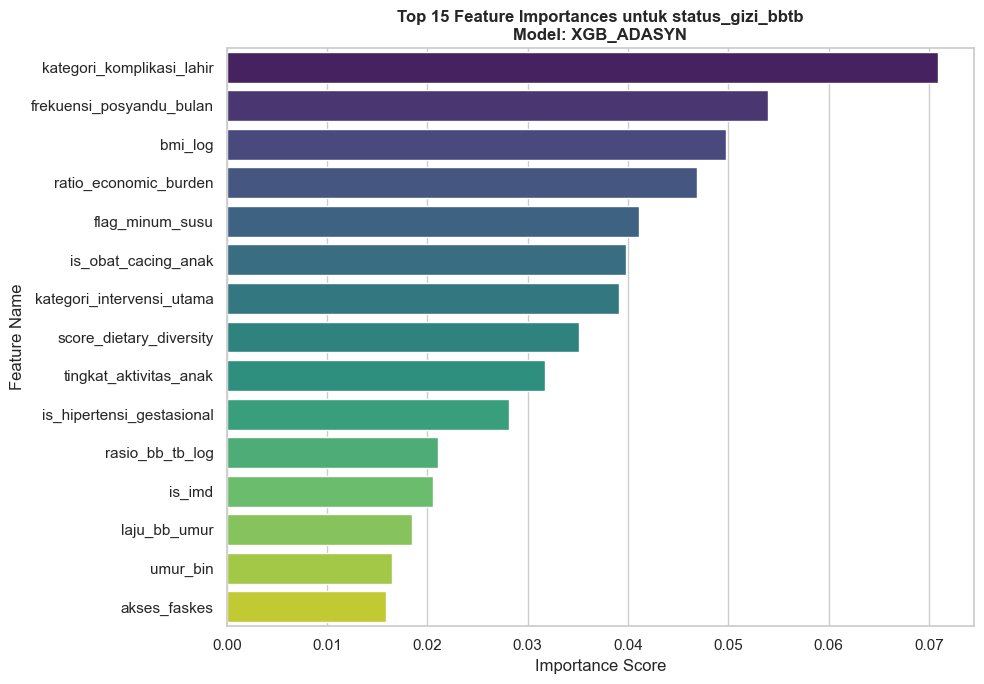


>>>>>>>>>> Target: status_gizi_bbu <<<<<<<<<<


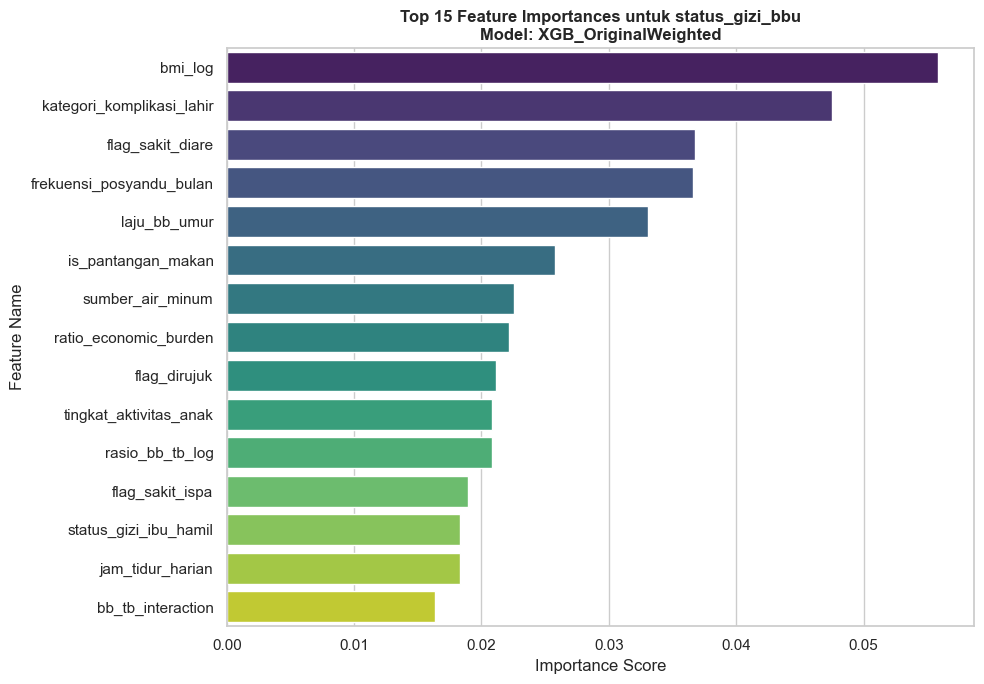


✓ Analisis Feature Importance Selesai.


In [59]:
print('FEATURE IMPORTANCE ANALYSIS FOR BEST MODELS')
print('=' * 70)

# Ensure best_models dictionary is available
if 'best_models' not in globals():
    print('[ERROR] Variabel `best_models` tidak ditemukan. Pastikan sel sebelumnya sudah dieksekusi.')
else:
    for target_name, model_info in best_models.items():
        print(f"\n{'>'*10} Target: {target_name} {'<'*10}")

        model = model_info['model']
        model_name = model_info['name']

        # Try to get feature importances
        feature_importances = None
        if hasattr(model, 'feature_importances_'):
            feature_importances = model.feature_importances_
        elif hasattr(model, 'coef_'):
            # For linear models, coef_ is used
            feature_importances = model.coef_[0] if model.coef_.ndim > 1 else model.coef_
        elif hasattr(model, 'get_feature_importance'): # CatBoost specific
            feature_importances = model.get_feature_importance()

        if feature_importances is not None:
            # Get feature names
            feature_names = None
            if hasattr(model, 'feature_names_in_'):
                feature_names = model.feature_names_in_
            elif hasattr(model, 'feature_name_'):
                feature_names = model.feature_name_
            elif hasattr(model, 'booster_') and hasattr(model.booster_, 'feature_name'):
                feature_names = model.booster_.feature_name()
            else:
                # Fallback to X_train column names from data_splits if feature_names not directly available in model
                # Need to find the original X_train for this specific target
                split_key = resolve_split_key(target_name)
                if split_key and 'data_splits_resampled' in globals() and split_key in data_splits_resampled:
                    X_train_example = data_splits_resampled[split_key]['train_variations']['Original'][0]
                    feature_names = X_train_example.columns
                elif split_key and 'data_splits' in globals() and split_key in data_splits:
                    X_train_example = data_splits[split_key]['X_train']
                    feature_names = X_train_example.columns

            if feature_names is None or len(feature_names) != len(feature_importances):
                print(f"  [WARNING] Tidak dapat menyelaraskan feature names dengan feature importances untuk {model_name}. Menggunakan indeks generik.")
                feature_names = [f'feature_{i}' for i in range(len(feature_importances))]

            df_importance = pd.DataFrame({
                'Feature': feature_names,
                'Importance': feature_importances
            })
            df_importance = df_importance.sort_values(by='Importance', ascending=False).head(15)

            plt.figure(figsize=(10, 7))
            sns.barplot(x='Importance', y='Feature', data=df_importance, palette='viridis')
            plt.title(f'Top 15 Feature Importances untuk {target_name}\nModel: {model_name}', fontsize=12, fontweight='bold')
            plt.xlabel('Importance Score')
            plt.ylabel('Feature Name')
            plt.tight_layout()
            plt.show()
        else:
            print(f"  [WARNING] Model {model_name} tidak memiliki atribut 'feature_importances_' atau 'coef_'.")

print('\n' + '=' * 70)
print('✓ Analisis Feature Importance Selesai.')

In [60]:
import numpy as np
import pandas as pd
from imblearn.over_sampling import BorderlineSMOTE, SVMSMOTE, RandomOverSampler
from imblearn.combine import SMOTETomek
from collections import Counter
import warnings
warnings.filterwarnings('ignore')
import re

# =============================================================================
# STEP 1: ADVANCED OVERSAMPLING - BorderlineSMOTE, SVMSMOTE, dan Custom Strategy
# =============================================================================
print('ADVANCED OVERSAMPLING UNTUK EXTREME IMBALANCE')
print('=' * 90)

def calculate_safe_k(y, default_k=5):
    """Hitung k_neighbors yang aman berdasarkan kelas terkecil"""
    min_samples = min(Counter(y).values())
    return max(1, min(default_k, min_samples - 1))

def custom_sampling_strategy(y, target_ratio=0.5):
    """
    Custom sampling strategy:
    - Minoritas di-oversample hingga mencapai target_ratio dari mayoritas
    """
    counter = Counter(y)
    majority_count = max(counter.values())
    target_count = int(majority_count * target_ratio)

    strategy = {}
    for cls, count in counter.items():
        if count < target_count:
            strategy[cls] = target_count
        else:
            strategy[cls] = count
    return strategy

def fix_dataframe_columns(df):
    """
    Fix DataFrame columns:
    1. Konversi semua nama kolom ke string
    2. Hapus karakter khusus dan pastikan unik untuk kompatibilitas estimator
    """
    if not isinstance(df, pd.DataFrame):
        return df

    original_cols = df.columns
    sanitized_cols = []
    seen = set()
    for c in original_cols:
        # Convert to string first
        s_c = str(c)
        # Remove special characters, replace spaces with underscores
        s_c = re.sub(r'[^a-zA-Z0-9_]', '', s_c.replace(' ', '_'))
        # Ensure it starts with a letter/underscore if empty or starts with a number
        if not s_c or not s_c[0].isalpha():
            s_c = 'col_' + s_c

        # Ensure uniqueness
        base_s_c = s_c
        counter = 1
        while s_c in seen:
            s_c = f"{base_s_c}_{counter}"
            counter += 1
        seen.add(s_c)
        sanitized_cols.append(s_c)

    df.columns = sanitized_cols
    return df

data_splits_enhanced = {}

for target_name, data_pack in data_splits_resampled.items():
    print(f"\n{'='*20} {target_name} {'='*20}")

    # Ambil data original untuk resampling ulang
    X_train_orig, y_train_orig = data_pack['train_variations']['Original']
    X_test = data_pack['X_test']
    y_test = data_pack['y_test']

    # PENTING: Fix kolom (konversi ke string + hapus duplikat)
    X_train_orig = fix_dataframe_columns(X_train_orig.copy()) # Reassign the fixed DataFrame
    X_test = fix_dataframe_columns(X_test.copy()) # Reassign the fixed DataFrame

    print(f"Distribusi Original: {dict(Counter(y_train_orig))}")
    print(f"Shape: X_train={X_train_orig.shape}, X_test={X_test.shape}")

    k_neighbors = calculate_safe_k(y_train_orig)
    print(f"Safe k_neighbors: {k_neighbors}")

    enhanced_variations = {'Original': (X_train_orig, y_train_orig)}

    # 1. BorderlineSMOTE - Fokus pada sampel di boundary
    try:
        print("  [1] BorderlineSMOTE...", end=" ")
        if k_neighbors >= 1 and min(Counter(y_train_orig).values()) >= 2:
            bsmote = BorderlineSMOTE(
                k_neighbors=k_neighbors,
                m_neighbors=min(10, len(y_train_orig) // 2),
                kind='borderline-1',
                random_state=RANDOM_STATE
            )
            X_bsmote, y_bsmote = bsmote.fit_resample(X_train_orig, y_train_orig)
            enhanced_variations['BorderlineSMOTE'] = (X_bsmote, y_bsmote)
            print(f"OK -> {len(y_bsmote)} samples")
        else:
            print("SKIP (insufficient samples)")
    except Exception as e:
        print(f"FAIL: {e}")

    # 2. SVMSMOTE - Generate synthetic samples menggunakan SVM
    try:
        print("  [2] SVMSMOTE...", end=" ")
        if k_neighbors >= 1 and min(Counter(y_train_orig).values()) >= 2:
            svmsmote = SVMSMOTE(
                k_neighbors=k_neighbors,
                m_neighbors=min(10, len(y_train_orig) // 2),
                random_state=RANDOM_STATE
            )
            X_svm, y_svm = svmsmote.fit_resample(X_train_orig, y_train_orig)
            enhanced_variations['SVMSMOTE'] = (X_svm, y_svm)
            print(f"OK -> {len(y_svm)} samples")
        else:
            print("SKIP (insufficient samples)")
    except Exception as e:
        print(f"FAIL: {e}")

    # 3. Aggressive Oversampling (Full Balance dengan RandomOverSampler)
    try:
        print("  [3] AggressiveROS (Full Balance)...", end=" ")
        ros = RandomOverSampler(sampling_strategy='auto', random_state=RANDOM_STATE)
        X_ros, y_ros = ros.fit_resample(X_train_orig, y_train_orig)
        enhanced_variations['AggressiveROS'] = (X_ros, y_ros)
        print(f"OK -> {len(y_ros)} samples")
    except Exception as e:
        print(f"FAIL: {e}")

    # 4. Hybrid: SMOTE + Tomek dengan custom ratio (lebih agresif)
    try:
        print("  [4] SMOTETomek (Aggressive)...", end=" ")
        if k_neighbors >= 1 and min(Counter(y_train_orig).values()) >= 2:
            smote_base = SMOTE(k_neighbors=k_neighbors, random_state=RANDOM_STATE)
            smt = SMOTETomek(smote=smote_base, random_state=RANDOM_STATE)
            X_smt, y_smt = smt.fit_resample(X_train_orig, y_train_orig)
            enhanced_variations['SMOTETomek_Aggressive'] = (X_smt, y_smt)
            print(f"OK -> {len(y_smt)} samples")
        else:
            ros = RandomOverSampler(random_state=RANDOM_STATE)
            X_ros, y_ros = ros.fit_resample(X_train_orig, y_train_orig)
            enhanced_variations['ROS_Fallback'] = (X_ros, y_ros)
            print(f"OK (ROS fallback) -> {len(y_ros)} samples")
    except Exception as e:
        print(f"FAIL: {e}")

    # Simpan hasil
    data_splits_enhanced[target_name] = {
        'train_variations': enhanced_variations,
        'X_test': X_test,
        'y_test': y_test
    }

    print(f"\n  Variasi tersedia: {list(enhanced_variations.keys())}")

print('\n' + '='*90)
print('✓ Advanced Oversampling Selesai')

ADVANCED OVERSAMPLING UNTUK EXTREME IMBALANCE

==================== status_gizi_tbu ====================
Distribusi Original: {2: 593, 1: 81, 0: 16, 3: 10}
Shape: X_train=(700, 102), X_test=(176, 102)
Safe k_neighbors: 5
  [1] BorderlineSMOTE... OK -> 2372 samples
  [2] SVMSMOTE... OK -> 1598 samples
  [3] AggressiveROS (Full Balance)... OK -> 2372 samples
  [4] SMOTETomek (Aggressive)... OK -> 2368 samples

  Variasi tersedia: ['Original', 'BorderlineSMOTE', 'SVMSMOTE', 'AggressiveROS', 'SMOTETomek_Aggressive']

==================== status_gizi_bbtb ====================
Distribusi Original: {2: 587, 3: 46, 1: 59, 0: 8}
Shape: X_train=(700, 102), X_test=(176, 102)
Safe k_neighbors: 5
  [1] BorderlineSMOTE... OK -> 1769 samples
  [2] SVMSMOTE... FAIL: All support vectors are considered as noise. SVM-SMOTE is not adapted to your dataset. Try another SMOTE variant.
  [3] AggressiveROS (Full Balance)... OK -> 2348 samples
  [4] SMOTETomek (Aggressive)... 

OK -> 2348 samples

  Variasi tersedia: ['Original', 'BorderlineSMOTE', 'AggressiveROS', 'SMOTETomek_Aggressive']

==================== status_gizi_bbu ====================
Distribusi Original: {3: 37, 2: 589, 1: 61, 0: 13}
Shape: X_train=(700, 102), X_test=(176, 102)
Safe k_neighbors: 5
  [1] BorderlineSMOTE... OK -> 2356 samples
  [2] SVMSMOTE... OK -> 1833 samples
  [3] AggressiveROS (Full Balance)... OK -> 2356 samples
  [4] SMOTETomek (Aggressive)... OK -> 2350 samples

  Variasi tersedia: ['Original', 'BorderlineSMOTE', 'SVMSMOTE', 'AggressiveROS', 'SMOTETomek_Aggressive']

✓ Advanced Oversampling Selesai


In [61]:
# =============================================================================
# STEP 2: FOCAL LOSS INSPIRED SAMPLE WEIGHTS (Exponential Weighting)
# =============================================================================
print('FOCAL LOSS INSPIRED WEIGHTING untuk Kelas Minoritas')
print('=' * 90)

import numpy as np
from sklearn.utils.class_weight import compute_class_weight

def compute_focal_weights(y, gamma=2.0, alpha=None):
    """
    Focal Loss inspired sample weights.

    Rumus: weight = alpha * (1 - p_class)^gamma

    Di mana:
    - p_class = proporsi kelas dalam dataset
    - gamma = focusing parameter (default 2.0, semakin besar semakin fokus ke minoritas)
    - alpha = faktor skala per kelas (opsional)

    Kelas dengan proporsi kecil akan mendapat bobot yang jauh lebih besar.
    """
    from collections import Counter

    counter = Counter(y)
    total = len(y)

    # Hitung proporsi tiap kelas
    class_proportions = {cls: count / total for cls, count in counter.items()}

    # Hitung focal weights
    focal_weights = {}
    for cls, p in class_proportions.items():
        # Focal formula: (1 - p)^gamma
        weight = (1 - p) ** gamma
        if alpha is not None and cls in alpha:
            weight *= alpha[cls]
        focal_weights[cls] = weight

    # Normalisasi agar rata-rata weight = 1
    mean_weight = np.mean(list(focal_weights.values()))
    focal_weights = {cls: w / mean_weight for cls, w in focal_weights.items()}

    # Map ke sample weights
    sample_weights = np.array([focal_weights[y_i] for y_i in y])

    return sample_weights, focal_weights

def compute_extreme_weights(y, power=3.0):
    """
    Extreme class weighting untuk kasus imbalance sangat parah.

    Rumus: weight = (N / n_class)^power / sum_weights

    power > 1 akan membuat perbedaan bobot lebih ekstrem
    """
    from collections import Counter

    counter = Counter(y)
    total = len(y)
    n_classes = len(counter)

    # Balanced weight dengan power
    class_weights = {}
    for cls, count in counter.items():
        # Balanced: total / (n_classes * count)
        # Dengan power untuk memperbesar gap
        balanced = total / (n_classes * count)
        class_weights[cls] = balanced ** power

    # Normalisasi
    sum_weights = sum(class_weights.values())
    class_weights = {cls: (w / sum_weights) * n_classes for cls, w in class_weights.items()}

    sample_weights = np.array([class_weights[y_i] for y_i in y])

    return sample_weights, class_weights

# Demo perhitungan weights untuk setiap target
print("\nPerbandingan Strategi Weighting:\n")

for target_name in data_splits_enhanced.keys():
    print(f">>> {target_name}")

    X_train, y_train = data_splits_enhanced[target_name]['train_variations']['Original']

    # 1. Standard Balanced Weights
    classes = np.unique(y_train)
    std_weights = compute_class_weight('balanced', classes=classes, y=y_train)
    std_dict = dict(zip(classes, std_weights))

    # 2. Focal Weights (gamma=2)
    _, focal_dict = compute_focal_weights(y_train, gamma=2.0)

    # 3. Focal Weights (gamma=3, lebih agresif)
    _, focal3_dict = compute_focal_weights(y_train, gamma=3.0)

    # 4. Extreme Weights (power=2)
    _, extreme_dict = compute_extreme_weights(y_train, power=2.0)

    print(f"  Distribusi: {dict(Counter(y_train))}")
    print(f"  Standard Balanced : {std_dict}")
    print(f"  Focal (γ=2)       : {focal_dict}")
    print(f"  Focal (γ=3)       : {focal3_dict}")
    print(f"  Extreme (p=2)     : {extreme_dict}")
    print()

print('✓ Weight strategies defined')

FOCAL LOSS INSPIRED WEIGHTING untuk Kelas Minoritas

Perbandingan Strategi Weighting:

>>> status_gizi_tbu
  Distribusi: {2: 593, 1: 81, 0: 16, 3: 10}
  Standard Balanced : {np.int64(0): np.float64(10.9375), np.int64(1): np.float64(2.1604938271604937), np.int64(2): np.float64(0.2951096121416526), np.int64(3): np.float64(17.5)}
  Focal (γ=2)       : {2: np.float64(0.03421273213274502), 1: np.float64(1.1449894887513952), 0: np.float64(1.3980812302120327), 3: np.float64(1.4227165489038271)}
  Focal (γ=3)       : {2: np.float64(0.005524905022154728), 1: np.float64(1.0696591992664592), 0: np.float64(1.443250739285832), 3: np.float64(1.4815651564255539)}
  Extreme (p=2)     : {2: 0.0008089443739338865, 1: 0.04335687854739784, 0: 1.1111893755838955, 3: 2.8446448014947725}

>>> status_gizi_bbtb
  Distribusi: {2: 587, 3: 46, 1: 59, 0: 8}
  Standard Balanced : {np.int64(0): np.float64(21.875), np.int64(1): np.float64(2.9661016949152543), np.int64(2): np.float64(0.2981260647359455), np.int64(3): 

In [62]:
# =============================================================================
# STEP 3: TRAINING DENGAN FOCAL WEIGHTS + ADVANCED OVERSAMPLING
# =============================================================================
print('TRAINING PIPELINE: FOCAL WEIGHTS + ADVANCED OVERSAMPLING')
print('=' * 90)

from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from imblearn.ensemble import BalancedRandomForestClassifier, BalancedBaggingClassifier, EasyEnsembleClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, f1_score, recall_score, precision_score, accuracy_score
import xgboost as xgb
from catboost import CatBoostClassifier
import lightgbm as lgb

all_results_enhanced = {}

# Hyperparameters yang sudah dioptimasi
rf_params = {
    'n_estimators': 400,
    'max_depth': 15,
    'min_samples_split': 3,
    'min_samples_leaf': 1,
    'max_features': 'sqrt',
    'random_state': RANDOM_STATE,
    'n_jobs': -1
}

xgb_params_base = {
    'n_estimators': 500,
    'max_depth': 7,
    'learning_rate': 0.05,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'min_child_weight': 2,
    'gamma': 0.1,
    'reg_lambda': 1.0,
    'reg_alpha': 0.5,
    'random_state': RANDOM_STATE,
    'eval_metric': 'mlogloss',
    'n_jobs': -1,
    'verbosity': 0
}

catboost_params = {
    'iterations': 600,
    'depth': 7,
    'learning_rate': 0.05,
    'l2_leaf_reg': 3,
    'random_seed': RANDOM_STATE,
    'verbose': False
}

lgbm_params_base = {
    'n_estimators': 500,
    'learning_rate': 0.05,
    'num_leaves': 50,
    'max_depth': 8,
    'min_child_samples': 20,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'random_state': RANDOM_STATE
}

def evaluate_model(y_true, y_pred, y_proba=None):
    """Evaluasi model dengan metrik lengkap"""
    metrics = {
        'accuracy': accuracy_score(y_true, y_pred),
        'precision_macro': precision_score(y_true, y_pred, average='macro', zero_division=0),
        'recall_macro': recall_score(y_true, y_pred, average='macro', zero_division=0),
        'f1_macro': f1_score(y_true, y_pred, average='macro', zero_division=0),
        'precision_weighted': precision_score(y_true, y_pred, average='weighted', zero_division=0),
        'recall_weighted': recall_score(y_true, y_pred, average='weighted', zero_division=0),
        'f1_weighted': f1_score(y_true, y_pred, average='weighted', zero_division=0),
        'y_pred': y_pred
    }

    # Per-class metrics
    classes = np.unique(y_true)
    per_class_f1 = f1_score(y_true, y_pred, average=None, zero_division=0)
    per_class_recall = recall_score(y_true, y_pred, average=None, zero_division=0)
    metrics['per_class_f1'] = dict(zip(classes, per_class_f1))
    metrics['per_class_recall'] = dict(zip(classes, per_class_recall))

    # Min F1 per class (worst case)
    metrics['f1_min_class'] = min(per_class_f1)
    metrics['recall_min_class'] = min(per_class_recall)

    if y_proba is not None:
        try:
            from sklearn.metrics import roc_auc_score
            metrics['roc_auc'] = roc_auc_score(y_true, y_proba, multi_class='ovr', average='weighted')
        except:
            metrics['roc_auc'] = None

    return metrics

# Main Training Loop
for target_name, data_pack in data_splits_enhanced.items():
    print(f"\n{'>'*15} TARGET: {target_name} {'<'*15}")

    results = {}
    X_test = data_pack['X_test']
    y_test = data_pack['y_test']
    num_classes = len(np.unique(y_test))

    # Loop melalui berbagai metode oversampling
    for method_name, (X_train, y_train) in data_pack['train_variations'].items():
        print(f"\n  --- Data: {method_name} ---")

        # Tentukan weight strategy
        use_focal = method_name == 'Original'  # Gunakan focal weights untuk data original

        if use_focal:
            sample_weights, class_weights_dict = compute_focal_weights(y_train, gamma=2.5)
            weight_label = "FocalWeight"
        else:
            sample_weights = None
            class_weights_dict = None
            weight_label = "NoWeight"

        # ============ MODEL 1: XGBoost dengan Focal Weights ============
        print(f"    [1] XGBoost ({weight_label})...", end=" ")
        try:
            xgb_params = xgb_params_base.copy()
            xgb_params['objective'] = 'multi:softprob'
            xgb_params['num_class'] = num_classes

            xgb_model = xgb.XGBClassifier(**xgb_params)

            if sample_weights is not None:
                xgb_model.fit(X_train, y_train, sample_weight=sample_weights)
            else:
                xgb_model.fit(X_train, y_train)

            y_pred = xgb_model.predict(X_test)
            y_proba = xgb_model.predict_proba(X_test)

            metrics = evaluate_model(y_test, y_pred, y_proba)
            metrics['model'] = xgb_model
            results[f'XGB_{method_name}_{weight_label}'] = metrics
            print(f"F1-Macro: {metrics['f1_macro']:.4f}, F1-Min: {metrics['f1_min_class']:.4f}")
        except Exception as e:
            print(f"FAIL: {e}")

        # ============ MODEL 2: CatBoost dengan Class Weights ============
        print(f"    [2] CatBoost ({weight_label})...", end=" ")
        try:
            cb_params = catboost_params.copy()
            cb_params['loss_function'] = 'MultiClass'

            if class_weights_dict is not None:
                # CatBoost expects list in class order
                classes_sorted = sorted(class_weights_dict.keys())
                cb_class_weights = [class_weights_dict[c] for c in classes_sorted]
                cb_params['class_weights'] = cb_class_weights

            cb_model = CatBoostClassifier(**cb_params)
            cb_model.fit(X_train, y_train)

            y_pred = cb_model.predict(X_test).ravel()
            y_proba = cb_model.predict_proba(X_test)

            metrics = evaluate_model(y_test, y_pred, y_proba)
            metrics['model'] = cb_model
            results[f'CatBoost_{method_name}_{weight_label}'] = metrics
            print(f"F1-Macro: {metrics['f1_macro']:.4f}, F1-Min: {metrics['f1_min_class']:.4f}")
        except Exception as e:
            print(f"FAIL: {e}")

        # ============ MODEL 3: LightGBM dengan Class Weights ============
        print(f"    [3] LightGBM ({weight_label})...", end=" ")
        try:
            lgbm_params = lgbm_params_base.copy()
            lgbm_params['objective'] = 'multiclass'
            lgbm_params['num_class'] = num_classes

            if class_weights_dict is not None:
                lgbm_params['class_weight'] = class_weights_dict

            lgbm_model = lgb.LGBMClassifier(**lgbm_params)
            lgbm_model.fit(X_train, y_train)

            y_pred = lgbm_model.predict(X_test)
            y_proba = lgbm_model.predict_proba(X_test)

            metrics = evaluate_model(y_test, y_pred, y_proba)
            metrics['model'] = lgbm_model
            results[f'LightGBM_{method_name}_{weight_label}'] = metrics
            print(f"F1-Macro: {metrics['f1_macro']:.4f}, F1-Min: {metrics['f1_min_class']:.4f}")
        except Exception as e:
            print(f"FAIL: {e}")

        # ============ MODEL 4: Balanced Random Forest (Khusus Original) ============
        if method_name == 'Original':
            print(f"    [4] BalancedRandomForest...", end=" ")
            try:
                brf_model = BalancedRandomForestClassifier(
                    n_estimators=400,
                    max_depth=15,
                    sampling_strategy='all',
                    replacement=True,
                    bootstrap=True,
                    random_state=RANDOM_STATE,
                    n_jobs=-1
                )
                brf_model.fit(X_train, y_train)

                y_pred = brf_model.predict(X_test)
                y_proba = brf_model.predict_proba(X_test)

                metrics = evaluate_model(y_test, y_pred, y_proba)
                metrics['model'] = brf_model
                results[f'BalancedRF_{method_name}'] = metrics
                print(f"F1-Macro: {metrics['f1_macro']:.4f}, F1-Min: {metrics['f1_min_class']:.4f}")
            except Exception as e:
                print(f"FAIL: {e}")

            # ============ MODEL 5: EasyEnsemble ============
            print(f"    [5] EasyEnsembleClassifier...", end=" ")
            try:
                ee_model = EasyEnsembleClassifier(
                    n_estimators=15,
                    random_state=RANDOM_STATE,
                    n_jobs=-1
                )
                ee_model.fit(X_train, y_train)

                y_pred = ee_model.predict(X_test)
                y_proba = ee_model.predict_proba(X_test)

                metrics = evaluate_model(y_test, y_pred, y_proba)
                metrics['model'] = ee_model
                results[f'EasyEnsemble_{method_name}'] = metrics
                print(f"F1-Macro: {metrics['f1_macro']:.4f}, F1-Min: {metrics['f1_min_class']:.4f}")
            except Exception as e:
                print(f"FAIL: {e}")

    all_results_enhanced[target_name] = results

    # Print top 3 models untuk target ini
    if results:
        sorted_models = sorted(results.items(), key=lambda x: x[1]['f1_macro'], reverse=True)[:3]
        print(f"\n  🏆 TOP 3 MODEL untuk {target_name}:")
        for i, (name, m) in enumerate(sorted_models):
            print(f"     {i+1}. {name}: F1-Macro={m['f1_macro']:.4f}, Recall-Macro={m['recall_macro']:.4f}")

print('\n' + '='*90)
print('✓ Training dengan Focal Weights + Advanced Oversampling Selesai')

TRAINING PIPELINE: FOCAL WEIGHTS + ADVANCED OVERSAMPLING

>>>>>>>>>>>>>>> TARGET: status_gizi_tbu <<<<<<<<<<<<<<<

  --- Data: Original ---
    [1] XGBoost (FocalWeight)... F1-Macro: 0.1556, F1-Min: 0.1053
    [2] CatBoost (FocalWeight)... F1-Macro: 0.4688, F1-Min: 0.2857
    [3] LightGBM (FocalWeight)... [LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1702
[LightGBM] [Info] Number of data points in the train set: 700, number of used features: 99
[LightGBM] [Info] Start training from score -1.781986
[LightGBM] [Info] Start training from score -0.409758
[LightGBM] [Info] Start training from score -2.807203
[LightGBM] [Info] Start training from score -2.230156
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

In [63]:
# =============================================================================
# STEP 4: THRESHOLD OPTIMIZATION untuk Meningkatkan Recall Kelas Minoritas
# =============================================================================
print('THRESHOLD OPTIMIZATION untuk Kelas Minoritas')
print('=' * 90)

from sklearn.metrics import precision_recall_curve, f1_score
import warnings
warnings.filterwarnings('ignore')

def find_optimal_thresholds(y_true, y_proba, target_recall=0.6):
    """
    Cari threshold optimal per kelas untuk memaksimalkan F1 sambil mempertahankan recall minimum.

    Strategi:
    - Untuk kelas minoritas, turunkan threshold agar lebih banyak sampel terklasifikasi ke kelas tersebut
    - Untuk kelas mayoritas, naikkan threshold agar lebih selektif
    """
    n_classes = y_proba.shape[1]
    optimal_thresholds = np.ones(n_classes) * 0.5  # Default 0.5

    # Binarize y_true untuk setiap kelas
    from sklearn.preprocessing import label_binarize
    classes = np.unique(y_true)
    y_true_bin = label_binarize(y_true, classes=classes)

    if y_true_bin.shape[1] == 1:  # Binary case
        y_true_bin = np.hstack([1 - y_true_bin, y_true_bin])

    for cls_idx in range(n_classes):
        # Precision-Recall curve untuk kelas ini
        precision, recall, thresholds = precision_recall_curve(
            y_true_bin[:, cls_idx],
            y_proba[:, cls_idx]
        )

        # Hitung F1 untuk setiap threshold
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-10)

        # Filter threshold yang memenuhi minimum recall
        valid_indices = recall[:-1] >= target_recall

        if valid_indices.any():
            # Pilih threshold dengan F1 tertinggi yang memenuhi recall minimum
            valid_f1 = f1_scores[:-1][valid_indices]
            valid_thresholds = thresholds[valid_indices]
            best_idx = np.argmax(valid_f1)
            optimal_thresholds[cls_idx] = valid_thresholds[best_idx]
        else:
            # Jika tidak ada yang memenuhi, ambil threshold dengan recall tertinggi
            best_idx = np.argmax(recall[:-1])
            optimal_thresholds[cls_idx] = thresholds[best_idx] if len(thresholds) > best_idx else 0.3

    return optimal_thresholds

def predict_with_optimized_thresholds(y_proba, thresholds):
    """Prediksi menggunakan threshold yang sudah dioptimasi"""
    # Adjust probabilities berdasarkan threshold
    adjusted_proba = y_proba / thresholds
    y_pred = np.argmax(adjusted_proba, axis=1)
    return y_pred

# Optimasi threshold untuk setiap model terbaik
all_results_threshold_optimized = {}

for target_name, results in all_results_enhanced.items():
    print(f"\n{'='*20} {target_name} {'='*20}")

    X_test = data_splits_enhanced[target_name]['X_test']
    y_test = data_splits_enhanced[target_name]['y_test']

    optimized_results = {}

    # Ambil top 3 model untuk dioptimasi threshold-nya
    sorted_models = sorted(results.items(), key=lambda x: x[1]['f1_macro'], reverse=True)[:5]

    for model_name, model_metrics in sorted_models:
        model = model_metrics.get('model')
        if model is None:
            continue

        print(f"\n  Optimizing: {model_name}")

        # Get probabilities
        y_proba = model.predict_proba(X_test)
        y_pred_original = model.predict(X_test)

        # Original metrics
        f1_original = model_metrics['f1_macro']
        recall_original = model_metrics['recall_macro']

        print(f"    Original: F1-Macro={f1_original:.4f}, Recall-Macro={recall_original:.4f}")
        print(f"    Per-class Recall: {model_metrics['per_class_recall']}")

        # Cari kelas dengan recall terendah
        min_recall_class = min(model_metrics['per_class_recall'], key=model_metrics['per_class_recall'].get)
        min_recall_value = model_metrics['per_class_recall'][min_recall_class]

        # Optimasi threshold dengan target recall berbeda
        best_f1 = f1_original
        best_thresholds = None
        best_recall_target = None

        for target_recall in [0.3, 0.4, 0.5, 0.55, 0.6]:
            try:
                opt_thresholds = find_optimal_thresholds(y_test, y_proba, target_recall=target_recall)
                y_pred_opt = predict_with_optimized_thresholds(y_proba, opt_thresholds)

                f1_opt = f1_score(y_test, y_pred_opt, average='macro', zero_division=0)
                recall_opt = recall_score(y_test, y_pred_opt, average='macro', zero_division=0)

                # Prioritaskan F1-Macro yang lebih tinggi
                if f1_opt > best_f1:
                    best_f1 = f1_opt
                    best_thresholds = opt_thresholds
                    best_recall_target = target_recall
            except Exception as e:
                continue

        if best_thresholds is not None:
            y_pred_best = predict_with_optimized_thresholds(y_proba, best_thresholds)
            metrics_opt = evaluate_model(y_test, y_pred_best, y_proba)
            metrics_opt['model'] = model
            metrics_opt['optimal_thresholds'] = best_thresholds

            improvement = metrics_opt['f1_macro'] - f1_original
            print(f"    Optimized (target_recall={best_recall_target}): F1-Macro={metrics_opt['f1_macro']:.4f} (+{improvement:.4f})")
            print(f"    Per-class Recall (Opt): {metrics_opt['per_class_recall']}")
            print(f"    Optimal Thresholds: {dict(enumerate(best_thresholds))}")

            optimized_results[f'{model_name}_ThresholdOpt'] = metrics_opt
        else:
            print(f"    No improvement found, keeping original")
            optimized_results[model_name] = model_metrics

    all_results_threshold_optimized[target_name] = optimized_results

print('\n' + '='*90)
print('✓ Threshold Optimization Selesai')

THRESHOLD OPTIMIZATION untuk Kelas Minoritas

==================== status_gizi_tbu ====================

  Optimizing: LightGBM_AggressiveROS_NoWeight
    Original: F1-Macro=0.6438, Recall-Macro=0.5868
    Per-class Recall: {np.int64(0): np.float64(0.5), np.int64(1): np.float64(0.38095238095238093), np.int64(2): np.float64(0.9664429530201343), np.int64(3): np.float64(0.5)}
    No improvement found, keeping original

  Optimizing: LightGBM_Original_FocalWeight
    Original: F1-Macro=0.6113, Recall-Macro=0.5904
    Per-class Recall: {np.int64(0): np.float64(0.5), np.int64(1): np.float64(0.42857142857142855), np.int64(2): np.float64(0.9328859060402684), np.int64(3): np.float64(0.5)}
    No improvement found, keeping original

  Optimizing: XGB_AggressiveROS_NoWeight
    Original: F1-Macro=0.6086, Recall-Macro=0.5954
    Per-class Recall: {np.int64(0): np.float64(0.5), np.int64(1): np.float64(0.42857142857142855), np.int64(2): np.float64(0.9530201342281879), np.int64(3): np.float64(0.5)}
 

In [64]:
# =============================================================================
# STEP 5: STACKING ENSEMBLE - Kombinasi Model Terbaik dengan Meta-Learner
# =============================================================================
print('STACKING ENSEMBLE: Kombinasi Model Terbaik')
print('=' * 90)

from sklearn.ensemble import StackingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_predict

# Helper function untuk menghapus kolom duplikat
def ensure_no_duplicate_columns(X):
    """Pastikan tidak ada kolom duplikat"""
    if isinstance(X, pd.DataFrame):
        if X.columns.duplicated().any():
            print(f"    [FIX] Menghapus {X.columns.duplicated().sum()} kolom duplikat")
            return X.loc[:, ~X.columns.duplicated()]
    return X

all_results_stacking = {}

for target_name, data_pack in data_splits_enhanced.items():
    print(f"\n{'>'*15} TARGET: {target_name} {'<'*15}")

    # Ambil data (gunakan variasi terbaik atau Original dengan weights)
    X_test = data_pack['X_test']
    y_test = data_pack['y_test']

    # Fix duplicate columns pada X_test
    X_test = ensure_no_duplicate_columns(X_test)

    # Pilih metode oversampling terbaik berdasarkan hasil sebelumnya
    # Prioritas: BorderlineSMOTE > SVMSMOTE > SMOTETomek > Original
    for method in ['BorderlineSMOTE', 'SVMSMOTE', 'SMOTETomek_Aggressive', 'AggressiveROS', 'Original']:
        if method in data_pack['train_variations']:
            X_train, y_train = data_pack['train_variations'][method]
            method_used = method
            break

    # Fix duplicate columns pada X_train
    X_train = ensure_no_duplicate_columns(X_train)

    print(f"  Menggunakan data: {method_used} ({len(y_train)} samples)")
    print(f"  X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")

    num_classes = len(np.unique(y_train))
    results = {}

    # Define base estimators
    base_estimators = []

    # 1. XGBoost
    xgb_model = xgb.XGBClassifier(
        n_estimators=300,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        objective='multi:softprob',
        num_class=num_classes,
        random_state=RANDOM_STATE,
        n_jobs=-1,
        verbosity=0
    )
    base_estimators.append(('xgb', xgb_model))

    # 2. LightGBM
    lgbm_model = lgb.LGBMClassifier(
        n_estimators=300,
        learning_rate=0.05,
        num_leaves=40,
        max_depth=7,
        objective='multiclass',
        num_class=num_classes,
        random_state=RANDOM_STATE,
        verbosity=-1
    )
    base_estimators.append(('lgbm', lgbm_model))

    # 3. CatBoost
    cb_model = CatBoostClassifier(
        iterations=300,
        depth=6,
        learning_rate=0.05,
        loss_function='MultiClass',
        random_seed=RANDOM_STATE,
        verbose=False
    )
    base_estimators.append(('catboost', cb_model))

    # 4. Balanced Random Forest
    brf_model = BalancedRandomForestClassifier(
        n_estimators=300,
        max_depth=12,
        sampling_strategy='all',
        replacement=True,
        random_state=RANDOM_STATE,
        n_jobs=-1
    )
    base_estimators.append(('brf', brf_model))

    # 5. Extra Trees dengan class_weight
    et_model = ExtraTreesClassifier(
        n_estimators=300,
        max_depth=15,
        class_weight='balanced',
        random_state=RANDOM_STATE,
        n_jobs=-1
    )
    base_estimators.append(('et', et_model))

    # ============ STACKING ENSEMBLE ============
    print("  [1] Stacking Ensemble (LR meta-learner)...", end=" ")
    try:
        stacking_clf = StackingClassifier(
            estimators=base_estimators,
            final_estimator=LogisticRegression(
                multi_class='multinomial',
                solver='lbfgs',
                max_iter=1000,
                class_weight='balanced',
                random_state=RANDOM_STATE
            ),
            cv=3,
            stack_method='predict_proba',
            n_jobs=-1
        )

        stacking_clf.fit(X_train, y_train)
        y_pred = stacking_clf.predict(X_test)
        y_proba = stacking_clf.predict_proba(X_test)

        metrics = evaluate_model(y_test, y_pred, y_proba)
        metrics['model'] = stacking_clf
        results['Stacking_LR'] = metrics
        print(f"F1-Macro: {metrics['f1_macro']:.4f}, Recall-Macro: {metrics['recall_macro']:.4f}")
    except Exception as e:
        print(f"FAIL: {e}")

    # ============ SOFT VOTING ENSEMBLE ============
    print("  [2] Soft Voting Ensemble...", end=" ")
    try:
        voting_clf = VotingClassifier(
            estimators=base_estimators,
            voting='soft',
            n_jobs=-1
        )

        voting_clf.fit(X_train, y_train)
        y_pred = voting_clf.predict(X_test)
        y_proba = voting_clf.predict_proba(X_test)

        metrics = evaluate_model(y_test, y_pred, y_proba)
        metrics['model'] = voting_clf
        results['SoftVoting'] = metrics
        print(f"F1-Macro: {metrics['f1_macro']:.4f}, Recall-Macro: {metrics['recall_macro']:.4f}")
    except Exception as e:
        print(f"FAIL: {e}")

    # ============ WEIGHTED VOTING (Custom) ============
    print("  [3] Weighted Soft Voting (Custom)...", end=" ")
    try:
        # Train setiap model dan dapatkan probabilitas
        models_trained = {}
        probas = []
        weights = []

        for name, model in base_estimators:
            model.fit(X_train, y_train)
            proba = model.predict_proba(X_test)

            # Hitung F1 untuk menentukan weight
            y_pred_temp = model.predict(X_test)
            f1_temp = f1_score(y_test, y_pred_temp, average='macro', zero_division=0)

            models_trained[name] = model
            probas.append(proba)
            weights.append(f1_temp)  # Weight berdasarkan F1

        # Normalize weights
        weights = np.array(weights) / sum(weights)

        # Weighted average of probabilities
        weighted_proba = np.zeros_like(probas[0])
        for proba, w in zip(probas, weights):
            weighted_proba += proba * w

        y_pred = np.argmax(weighted_proba, axis=1)

        metrics = evaluate_model(y_test, y_pred, weighted_proba)
        metrics['weights'] = dict(zip([n for n, _ in base_estimators], weights))
        results['WeightedSoftVoting'] = metrics
        print(f"F1-Macro: {metrics['f1_macro']:.4f}, Recall-Macro: {metrics['recall_macro']:.4f}")
        print(f"    Weights: {metrics['weights']}")
    except Exception as e:
        print(f"FAIL: {e}")

    all_results_stacking[target_name] = results

    # Print summary
    if results:
        best_model_name = max(results, key=lambda k: results[k]['f1_macro'])
        best_metrics = results[best_model_name]
        print(f"\n  🏆 BEST ENSEMBLE: {best_model_name}")
        print(f"     F1-Macro: {best_metrics['f1_macro']:.4f}")
        print(f"     Recall-Macro: {best_metrics['recall_macro']:.4f}")
        print(f"     Per-class Recall: {best_metrics['per_class_recall']}")

print('\n' + '='*90)
print('✓ Stacking Ensemble Selesai')

STACKING ENSEMBLE: Kombinasi Model Terbaik

>>>>>>>>>>>>>>> TARGET: status_gizi_tbu <<<<<<<<<<<<<<<
  Menggunakan data: BorderlineSMOTE (2372 samples)
  X_train shape: (2372, 102), X_test shape: (176, 102)
  [1] Stacking Ensemble (LR meta-learner)... F1-Macro: 0.2814, Recall-Macro: 0.2792
  [2] Soft Voting Ensemble... F1-Macro: 0.3139, Recall-Macro: 0.3080
  [3] Weighted Soft Voting (Custom)... F1-Macro: 0.3261, Recall-Macro: 0.3199
    Weights: {'xgb': np.float64(0.17931617205961214), 'lgbm': np.float64(0.3266164911540249), 'catboost': np.float64(0.18325192221047243), 'brf': np.float64(0.15980334298279064), 'et': np.float64(0.15101207159309982)}

  🏆 BEST ENSEMBLE: WeightedSoftVoting
     F1-Macro: 0.3261
     Recall-Macro: 0.3199
     Per-class Recall: {np.int64(0): np.float64(0.0), np.int64(1): np.float64(0.3333333333333333), np.int64(2): np.float64(0.9463087248322147), np.int64(3): np.float64(0.0)}

>>>>>>>>>>>>>>> TARGET: status_gizi_bbtb <<<<<<<<<<<<<<<
  Menggunakan data: Border

In [65]:
# =============================================================================
# STEP 6: OPTUNA HYPERPARAMETER TUNING AGRESIF dengan FOKUS F1-MACRO MINIMAL
# =============================================================================
print('OPTUNA AGGRESSIVE TUNING: Fokus pada Kelas Minoritas')
print('=' * 90)

import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import StratifiedKFold
optuna.logging.set_verbosity(optuna.logging.WARNING)

all_results_optuna_aggressive = {}

def sanitize_lgbm_col_names(df):
    """
    Sanitizes column names to be compatible with LightGBM, ensuring uniqueness.
    LightGBM often has issues with special characters like [, ], <, :, ?, and spaces.
    This function also handles potential duplicates created by sanitization.
    """
    cols = df.columns
    new_cols = []
    seen = set() # To track unique names
    for c in cols:
        # Initial sanitization: replace problematic characters and spaces with underscores
        new_c = str(c).replace('[', '').replace(']', '').replace('<', '').replace(':', '').replace('?', '').replace(' ', '_').replace('(', '').replace(')', '').replace('/', '_').replace('-', '_')

        # Ensure uniqueness if sanitization creates duplicates
        original_new_c = new_c
        counter = 0
        while new_c in seen:
            new_c = f"{original_new_c}_{counter}"
            counter += 1
        seen.add(new_c)
        new_cols.append(new_c)
    df.columns = new_cols
    return df


def create_objective_xgb(X_train, y_train, num_classes):
    """Objective function untuk XGBoost dengan fokus pada minority class"""

    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 300, 800, step=50),
            'max_depth': trial.suggest_int('max_depth', 4, 12),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.15, log=True),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
            'gamma': trial.suggest_float('gamma', 0.0, 1.0),
            'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 5.0),
            'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 2.0),
            'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1.0, 10.0),  # Untuk imbalance
            'objective': 'multi:softprob',
            'num_class': num_classes,
            'eval_metric': 'mlogloss',
            'random_state': RANDOM_STATE,
            'n_jobs': -1,
            'verbosity': 0
        }

        # 3-Fold CV dengan Focal Weights
        cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE)
        f1_scores = []
        min_class_f1s = []

        for train_idx, val_idx in cv.split(X_train, y_train):
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            # Focal weights untuk training
            sample_weights, _ = compute_focal_weights(y_tr, gamma=2.5)

            model = xgb.XGBClassifier(**params)
            model.fit(X_tr, y_tr, sample_weight=sample_weights)

            y_pred = model.predict(X_val)
            f1_mac = f1_score(y_val, y_pred, average='macro', zero_division=0)
            f1_per_class = f1_score(y_val, y_pred, average=None, zero_division=0)

            f1_scores.append(f1_mac)
            min_class_f1s.append(min(f1_per_class))

        # Objective: Kombinasi F1-Macro dan Min Class F1
        # Ini memaksa model untuk tidak mengabaikan kelas minoritas
        avg_f1 = np.mean(f1_scores)
        avg_min_f1 = np.mean(min_class_f1s)

        # Combined objective (weighted average)
        combined_score = 0.6 * avg_f1 + 0.4 * avg_min_f1

        return combined_score

    return objective

def create_objective_lgbm(X_train, y_train, num_classes):
    """Objective function untuk LightGBM"""

    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 300, 800, step=50),
            'num_leaves': trial.suggest_int('num_leaves', 20, 100),
            'max_depth': trial.suggest_int('max_depth', 4, 12),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.15, log=True),
            'min_child_samples': trial.suggest_int('min_child_samples', 10, 60),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
            'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 5.0),
            'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 2.0),
            'objective': 'multiclass',
            'num_class': num_classes,
            'class_weight': 'balanced',
            'random_state': RANDOM_STATE
        }

        cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE)
        f1_scores = []
        min_class_f1s = []

        for train_idx, val_idx in cv.split(X_train, y_train):
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            # Column names are sanitized once before the loop, so no need to repeat here

            model = lgb.LGBMClassifier(**params)
            model.fit(X_tr, y_tr)

            y_pred = model.predict(X_val)
            f1_mac = f1_score(y_val, y_pred, average='macro', zero_division=0)
            f1_per_class = f1_score(y_val, y_pred, average=None, zero_division=0)

            f1_scores.append(f1_mac)
            min_class_f1s.append(min(f1_per_class))

        combined_score = 0.6 * np.mean(f1_scores) + 0.4 * np.mean(min_class_f1s)
        return combined_score

    return objective

# Main Tuning Loop
N_TRIALS = 50  # Jumlah trials untuk tuning

for target_name, data_pack in data_splits_enhanced.items():
    print(f"\n{'>'*15} TUNING: {target_name} {'<'*15}")

    X_test = data_pack['X_test'].copy() # Use .copy() to avoid modifying original
    y_test = data_pack['y_test']

    # Gunakan data Original dengan focal weights (atau bisa ganti ke SMOTE variant)
    X_train = data_pack['train_variations']['Original'][0].copy() # Use .copy() to avoid modifying original
    y_train = data_pack['train_variations']['Original'][1]
    num_classes = len(np.unique(y_train))

    # Sanitize column names for X_train and X_test ONCE here
    X_train = sanitize_lgbm_col_names(X_train)
    X_test = sanitize_lgbm_col_names(X_test)

    results = {}

    # ============ TUNE XGBOOST ============
    print(f"\n  [1/2] Tuning XGBoost ({N_TRIALS} trials)...")

    study_xgb = optuna.create_study(direction='maximize', sampler=TPESampler(seed=RANDOM_STATE))
    study_xgb.optimize(create_objective_xgb(X_train, y_train, num_classes), n_trials=N_TRIALS, show_progress_bar=True)

    print(f"    Best CV Combined Score: {study_xgb.best_value:.4f}")

    # Train final model dengan best params + focal weights
    best_params_xgb = study_xgb.best_params
    best_params_xgb.update({
        'objective': 'multi:softprob',
        'num_class': num_classes,
        'eval_metric': 'mlogloss',
        'random_state': RANDOM_STATE,
        'n_jobs': -1,
        'verbosity': 0
    })

    sample_weights, _ = compute_focal_weights(y_train, gamma=2.5)
    final_xgb = xgb.XGBClassifier(**best_params_xgb)
    final_xgb.fit(X_train, y_train, sample_weight=sample_weights)

    y_pred = final_xgb.predict(X_test)
    y_proba = final_xgb.predict_proba(X_test)

    metrics = evaluate_model(y_test, y_pred, y_proba)
    metrics['model'] = final_xgb
    metrics['best_params'] = best_params_xgb
    results['XGB_AggressiveTuned'] = metrics

    print(f"    Test F1-Macro: {metrics['f1_macro']:.4f}, Recall-Macro: {metrics['recall_macro']:.4f}")
    print(f"    Per-class F1: {metrics['per_class_f1']}")

    # ============ TUNE LIGHTGBM ============
    print(f"\n  [2/2] Tuning LightGBM ({N_TRIALS} trials)...")

    study_lgbm = optuna.create_study(direction='maximize', sampler=TPESampler(seed=RANDOM_STATE))
    study_lgbm.optimize(create_objective_lgbm(X_train, y_train, num_classes), n_trials=N_TRIALS, show_progress_bar=True)

    print(f"    Best CV Combined Score: {study_lgbm.best_value:.4f}")

    best_params_lgbm = study_lgbm.best_params
    best_params_lgbm.update({
        'objective': 'multiclass',
        'num_class': num_classes,
        'class_weight': 'balanced',
        'random_state': RANDOM_STATE
    })

    # X_train and X_test are already sanitized, just pass them directly
    final_lgbm = lgb.LGBMClassifier(**best_params_lgbm)
    final_lgbm.fit(X_train, y_train)

    y_pred = final_lgbm.predict(X_test)
    y_proba = final_lgbm.predict_proba(X_test)

    metrics = evaluate_model(y_test, y_pred, y_proba)
    metrics['model'] = final_lgbm
    metrics['best_params'] = best_params_lgbm
    results['LGBM_AggressiveTuned'] = metrics

    print(f"    Test F1-Macro: {metrics['f1_macro']:.4f}, Recall-Macro: {metrics['recall_macro']:.4f}")
    print(f"    Per-class F1: {metrics['per_class_f1']}")

    all_results_optuna_aggressive[target_name] = results

print('\n' + '='*90)
print('✓ Optuna Aggressive Tuning Selesai')


OPTUNA AGGRESSIVE TUNING: Fokus pada Kelas Minoritas

>>>>>>>>>>>>>>> TUNING: status_gizi_tbu <<<<<<<<<<<<<<<

  [1/2] Tuning XGBoost (50 trials)...


Best trial: 24. Best value: 0.0693265: 100%|██████████| 50/50 [03:58<00:00,  4.76s/it]


    Best CV Combined Score: 0.0693
    Test F1-Macro: 0.1093, Recall-Macro: 0.4018
    Per-class F1: {np.int64(0): np.float64(0.125), np.int64(1): np.float64(0.21686746987951808), np.int64(2): np.float64(0.0), np.int64(3): np.float64(0.09523809523809523)}

  [2/2] Tuning LightGBM (50 trials)...


Best trial: 36. Best value: 0.372944: 100%|██████████| 50/50 [03:21<00:00,  4.04s/it]


    Best CV Combined Score: 0.3729
    Test F1-Macro: 0.5526, Recall-Macro: 0.5939
    Per-class F1: {np.int64(0): np.float64(0.4444444444444444), np.int64(1): np.float64(0.45454545454545453), np.int64(2): np.float64(0.9115646258503401), np.int64(3): np.float64(0.4)}

>>>>>>>>>>>>>>> TUNING: status_gizi_bbtb <<<<<<<<<<<<<<<

  [1/2] Tuning XGBoost (50 trials)...


Best trial: 49. Best value: 0.214192: 100%|██████████| 50/50 [05:39<00:00,  6.78s/it]


    Best CV Combined Score: 0.2142
    Test F1-Macro: 0.5140, Recall-Macro: 0.6806
    Per-class F1: {np.int64(0): np.float64(0.6666666666666666), np.int64(1): np.float64(0.3146067415730337), np.int64(2): np.float64(0.6203703703703703), np.int64(3): np.float64(0.45454545454545453)}

  [2/2] Tuning LightGBM (50 trials)...


Best trial: 45. Best value: 0.412669: 100%|██████████| 50/50 [02:18<00:00,  2.76s/it]


    Best CV Combined Score: 0.4127
    Test F1-Macro: 0.5627, Recall-Macro: 0.5555
    Per-class F1: {np.int64(0): np.float64(0.0), np.int64(1): np.float64(0.5), np.int64(2): np.float64(0.9324324324324325), np.int64(3): np.float64(0.8181818181818182)}

>>>>>>>>>>>>>>> TUNING: status_gizi_bbu <<<<<<<<<<<<<<<

  [1/2] Tuning XGBoost (50 trials)...


Best trial: 46. Best value: 0.441627: 100%|██████████| 50/50 [04:21<00:00,  5.24s/it]


    Best CV Combined Score: 0.4416
    Test F1-Macro: 0.5097, Recall-Macro: 0.6572
    Per-class F1: {np.int64(0): np.float64(0.4), np.int64(1): np.float64(0.37681159420289856), np.int64(2): np.float64(0.7791164658634538), np.int64(3): np.float64(0.4827586206896552)}

  [2/2] Tuning LightGBM (50 trials)...


Best trial: 31. Best value: 0.562799: 100%|██████████| 50/50 [02:04<00:00,  2.49s/it]


    Best CV Combined Score: 0.5628
    Test F1-Macro: 0.5016, Recall-Macro: 0.4971
    Per-class F1: {np.int64(0): np.float64(0.4), np.int64(1): np.float64(0.20689655172413793), np.int64(2): np.float64(0.8993288590604027), np.int64(3): np.float64(0.5)}

✓ Optuna Aggressive Tuning Selesai


In [66]:
# =============================================================================
# STEP 7: FINAL COMPARISON & BEST MODEL SELECTION
# =============================================================================
print('FINAL COMPARISON: SEMUA STRATEGI ENHANCED')
print('=' * 90)

import pandas as pd
from sklearn.metrics import classification_report

# Gabungkan semua hasil
all_combined_results = {}

for target_name in data_splits_enhanced.keys():
    combined = {}

    # 1. Hasil dari Focal Weights + Advanced Oversampling
    if target_name in all_results_enhanced:
        for k, v in all_results_enhanced[target_name].items():
            combined[f'FocalOversample_{k}'] = v

    # 2. Hasil dari Threshold Optimization
    if target_name in all_results_threshold_optimized:
        for k, v in all_results_threshold_optimized[target_name].items():
            combined[f'ThresholdOpt_{k}'] = v

    # 3. Hasil dari Stacking
    if target_name in all_results_stacking:
        for k, v in all_results_stacking[target_name].items():
            combined[f'Stacking_{k}'] = v

    # 4. Hasil dari Optuna Aggressive
    if target_name in all_results_optuna_aggressive:
        for k, v in all_results_optuna_aggressive[target_name].items():
            combined[f'Optuna_{k}'] = v

    # 5. Hasil dari all_results_advanced (sebelumnya)
    if 'all_results_advanced' in globals() and target_name in all_results_advanced:
        for k, v in all_results_advanced[target_name].items():
            if f'Previous_{k}' not in combined:
                combined[f'Previous_{k}'] = v

    all_combined_results[target_name] = combined

# Create comparison DataFrame
comparison_rows = []

for target_name, results in all_combined_results.items():
    for model_name, metrics in results.items():
        row = {
            'Target': target_name,
            'Model': model_name,
            'F1-Macro': metrics.get('f1_macro', 0),
            'Recall-Macro': metrics.get('recall_macro', 0),
            'Precision-Macro': metrics.get('precision_macro', 0),
            'Accuracy': metrics.get('accuracy', 0),
            'F1-Min-Class': metrics.get('f1_min_class', 0),
            'Recall-Min-Class': metrics.get('recall_min_class', 0),
        }

        # Add per-class metrics if available
        per_class_f1 = metrics.get('per_class_f1', {})
        for cls, f1_val in per_class_f1.items():
            row[f'F1_Class_{cls}'] = f1_val

        comparison_rows.append(row)

df_final_comparison = pd.DataFrame(comparison_rows)

# Sort by F1-Macro per target
df_final_comparison = df_final_comparison.sort_values(
    by=['Target', 'F1-Macro'],
    ascending=[True, False]
)

# Display results per target
print("\n" + "="*90)
print("LEADERBOARD PER TARGET")
print("="*90)

best_models_final = {}

for target_name in df_final_comparison['Target'].unique():
    print(f"\n{'>'*20} {target_name} {'<'*20}")

    df_target = df_final_comparison[df_final_comparison['Target'] == target_name].head(10)

    # Format untuk display
    display_cols = ['Model', 'F1-Macro', 'Recall-Macro', 'Precision-Macro', 'Accuracy', 'F1-Min-Class']
    display_cols = [c for c in display_cols if c in df_target.columns]

    print(df_target[display_cols].to_string(index=False, float_format='{:.4f}'.format))

    # Check success criteria
    best_row = df_target.iloc[0]
    f1_mac = best_row['F1-Macro']
    rec_mac = best_row['Recall-Macro']

    print(f"\n  🏆 BEST MODEL: {best_row['Model']}")
    print(f"     F1-Macro: {f1_mac:.4f} {'✅' if f1_mac >= 0.75 else '❌'}")
    print(f"     Recall-Macro: {rec_mac:.4f} {'✅' if rec_mac >= 0.75 else '❌'}")

    if f1_mac >= 0.75 and rec_mac >= 0.75:
        print(f"     ✅ SUCCESS: Memenuhi kriteria F1-Macro ≥ 75% DAN Recall-Macro ≥ 75%")
    elif f1_mac >= 0.70 or rec_mac >= 0.70:
        print(f"     ⚠️ ALMOST: Mendekati target (salah satu metric ≥ 70%)")
    else:
        print(f"     ❌ NEEDS IMPROVEMENT")

    # Simpan model terbaik
    best_model_name = best_row['Model']
    if target_name in all_combined_results and best_model_name in all_combined_results[target_name]:
        best_models_final[target_name] = {
            'name': best_model_name,
            'metrics': all_combined_results[target_name][best_model_name]
        }

# Summary statistics
print("\n" + "="*90)
print("RINGKASAN KESELURUHAN")
print("="*90)

summary_data = []
for target_name, info in best_models_final.items():
    metrics = info['metrics']
    summary_data.append({
        'Target': target_name,
        'Best Model': info['name'],
        'F1-Macro': metrics.get('f1_macro', 0),
        'Recall-Macro': metrics.get('recall_macro', 0),
        'Status': '✅ PASSED' if metrics.get('f1_macro', 0) >= 0.75 and metrics.get('recall_macro', 0) >= 0.75 else '⚠️ ALMOST' if metrics.get('f1_macro', 0) >= 0.70 else '❌'
    })

df_summary = pd.DataFrame(summary_data)
print(df_summary.to_string(index=False))

# Calculate average improvement
avg_f1 = df_summary['F1-Macro'].mean()
avg_recall = df_summary['Recall-Macro'].mean()
print(f"\nRata-rata F1-Macro: {avg_f1:.4f}")
print(f"Rata-rata Recall-Macro: {avg_recall:.4f}")

print('\n' + '='*90)
print('✓ Final Comparison Selesai')

FINAL COMPARISON: SEMUA STRATEGI ENHANCED

LEADERBOARD PER TARGET

>>>>>>>>>>>>>>>>>>>> status_gizi_bbtb <<<<<<<<<<<<<<<<<<<<
                                                    Model  F1-Macro  Recall-Macro  Precision-Macro  Accuracy  F1-Min-Class
ThresholdOpt_CatBoost_AggressiveROS_NoWeight_ThresholdOpt    0.8239        0.7782           0.8974    0.9148        0.5833
               FocalOversample_XGB_AggressiveROS_NoWeight    0.7333        0.6665           0.8487    0.9034        0.5926
                  ThresholdOpt_XGB_AggressiveROS_NoWeight    0.7333        0.6665           0.8487    0.9034        0.5926
  FocalOversample_CatBoost_SMOTETomek_Aggressive_NoWeight    0.7230        0.6947           0.7659    0.8636        0.4000
     ThresholdOpt_CatBoost_SMOTETomek_Aggressive_NoWeight    0.7230        0.6947           0.7659    0.8636        0.4000
                                      Previous_XGB_ADASYN    0.7173        0.6481           0.8380    0.8920        0.0000
            F

DETAILED ANALYSIS: Classification Report & Confusion Matrix

============================== status_gizi_bbtb ==============================

  Model: ThresholdOpt_CatBoost_AggressiveROS_NoWeight_ThresholdOpt

  Classification Report:
              precision    recall  f1-score   support

  Gizi Buruk       1.00      1.00      1.00         2
 Gizi Kurang       0.78      0.47      0.58        15
   Gizi Baik       0.92      0.98      0.95       147
  Gizi Lebih       0.89      0.67      0.76        12

    accuracy                           0.91       176
   macro avg       0.90      0.78      0.82       176
weighted avg       0.91      0.91      0.91       176


  Per-Class Analysis:
    ✅ Class 0 (Gizi Buruk): True=2, Pred=2, Correct=2, Recall=100.00%
    ⚠️ Class 1 (Gizi Kurang): True=15, Pred=9, Correct=7, Recall=46.67%
    ✅ Class 2 (Gizi Baik): True=147, Pred=156, Correct=144, Recall=97.96%
    ✅ Class 3 (Gizi Lebih): True=12, Pred=9, Correct=8, Recall=66.67%

=====================

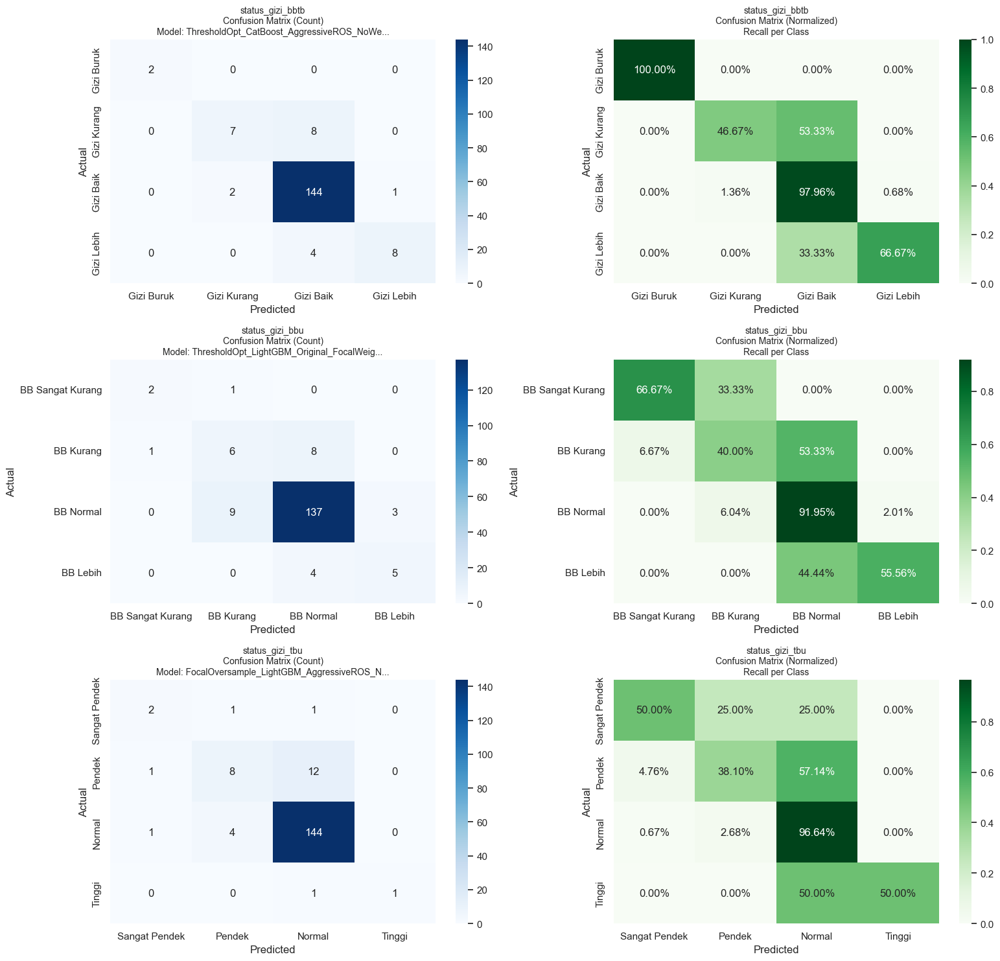


✓ Detailed Analysis Selesai
Confusion matrix disimpan ke: confusion_matrices_enhanced.png


In [67]:
# =============================================================================
# STEP 8: DETAILED CLASSIFICATION REPORT & CONFUSION MATRIX
# =============================================================================
print('DETAILED ANALYSIS: Classification Report & Confusion Matrix')
print('=' * 90)

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# Define label mapping (inverse of encoding)
label_maps = {
    'status_gizi_tbu': {0: 'Sangat Pendek', 1: 'Pendek', 2: 'Normal', 3: 'Tinggi'},
    'status_gizi_bbtb': {0: 'Gizi Buruk', 1: 'Gizi Kurang', 2: 'Gizi Baik', 3: 'Gizi Lebih'},
    'status_gizi_bbu': {0: 'BB Sangat Kurang', 1: 'BB Kurang', 2: 'BB Normal', 3: 'BB Lebih'}
}

fig, axes = plt.subplots(len(best_models_final), 2, figsize=(16, 5*len(best_models_final)))
if len(best_models_final) == 1:
    axes = axes.reshape(1, -1)

for idx, (target_name, info) in enumerate(best_models_final.items()):
    print(f"\n{'='*30} {target_name} {'='*30}")

    metrics = info['metrics']
    model_name = info['name']

    # Get test data
    X_test = data_splits_enhanced[target_name]['X_test']
    y_test = data_splits_enhanced[target_name]['y_test']

    # Get predictions
    y_pred = metrics.get('y_pred')
    if y_pred is None and 'model' in metrics:
        model = metrics['model']
        y_pred = model.predict(X_test)

    if y_pred is None:
        print(f"  [SKIP] Tidak ada prediksi tersedia untuk {target_name}")
        continue

    # Get label names
    label_map = label_maps.get(target_name, {})
    classes = sorted(np.unique(np.concatenate([y_test, y_pred])))
    target_names = [label_map.get(c, str(c)) for c in classes]

    # Classification Report
    print(f"\n  Model: {model_name}")
    print(f"\n  Classification Report:")
    print(classification_report(y_test, y_pred, target_names=target_names, zero_division=0))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred, labels=classes)

    # Normalize confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm_normalized = np.nan_to_num(cm_normalized)

    # Plot Raw Confusion Matrix
    ax1 = axes[idx, 0]
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax1,
                xticklabels=target_names, yticklabels=target_names)
    ax1.set_title(f'{target_name}\nConfusion Matrix (Count)\nModel: {model_name[:40]}...', fontsize=10)
    ax1.set_xlabel('Predicted')
    ax1.set_ylabel('Actual')

    # Plot Normalized Confusion Matrix
    ax2 = axes[idx, 1]
    sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Greens', ax=ax2,
                xticklabels=target_names, yticklabels=target_names)
    ax2.set_title(f'{target_name}\nConfusion Matrix (Normalized)\nRecall per Class', fontsize=10)
    ax2.set_xlabel('Predicted')
    ax2.set_ylabel('Actual')

    # Per-class analysis
    print(f"\n  Per-Class Analysis:")
    for i, cls in enumerate(classes):
        cls_name = label_map.get(cls, str(cls))
        true_count = (y_test == cls).sum()
        pred_count = (y_pred == cls).sum()
        correct_count = cm[i, i]
        recall = cm_normalized[i, i] if true_count > 0 else 0

        status = '✅' if recall >= 0.60 else '⚠️' if recall >= 0.40 else '❌'
        print(f"    {status} Class {cls} ({cls_name}): True={true_count}, Pred={pred_count}, Correct={correct_count}, Recall={recall:.2%}")

plt.tight_layout()
plt.savefig('confusion_matrices_enhanced.png', dpi=150, bbox_inches='tight')
plt.show()

print('\n' + '='*90)
print('✓ Detailed Analysis Selesai')
print('Confusion matrix disimpan ke: confusion_matrices_enhanced.png')

In [68]:
# =============================================================================
# STEP 9: SAVE BEST MODELS & FINAL EXPORT
# =============================================================================
print('SAVING BEST MODELS & EXPORTING RESULTS')
print('=' * 90)

import joblib
import os
import json

# Create output directory
output_dir = 'models_enhanced_final'
os.makedirs(output_dir, exist_ok=True)

# Save best models
saved_models = {}

for target_name, info in best_models_final.items():
    model_name = info['name']
    metrics = info['metrics']

    # Get model object
    model = metrics.get('model')

    if model is not None:
        # Create safe filename
        safe_target = target_name.replace('/', '_').replace('\\', '_').lower()
        safe_model = model_name.replace(' ', '_').replace('/', '_')[:50]

        # Save model
        model_filename = f"{output_dir}/best_model_{safe_target}.joblib"
        joblib.dump(model, model_filename)

        # Save metadata
        metadata = {
            'target': target_name,
            'model_name': model_name,
            'f1_macro': float(metrics.get('f1_macro', 0)),
            'recall_macro': float(metrics.get('recall_macro', 0)),
            'precision_macro': float(metrics.get('precision_macro', 0)),
            'accuracy': float(metrics.get('accuracy', 0)),
            'per_class_f1': {str(k): float(v) for k, v in metrics.get('per_class_f1', {}).items()},
            'per_class_recall': {str(k): float(v) for k, v in metrics.get('per_class_recall', {}).items()},
        }

        # Save best params if available
        if 'best_params' in metrics:
            metadata['best_params'] = {k: str(v) if not isinstance(v, (int, float, bool, type(None))) else v
                                       for k, v in metrics['best_params'].items()}

        metadata_filename = f"{output_dir}/metadata_{safe_target}.json"
        with open(metadata_filename, 'w') as f:
            json.dump(metadata, f, indent=2)

        saved_models[target_name] = {
            'model_file': model_filename,
            'metadata_file': metadata_filename
        }

        print(f"\n✅ {target_name}:")
        print(f"   Model: {model_filename}")
        print(f"   Metadata: {metadata_filename}")
        print(f"   F1-Macro: {metrics.get('f1_macro', 0):.4f}")
    else:
        print(f"\n⚠️ {target_name}: Model object tidak tersedia")

# Export comparison table to Excel
print(f"\n\nExporting comparison table to Excel...")
excel_filename = f"{output_dir}/model_comparison_enhanced.xlsx"

with pd.ExcelWriter(excel_filename, engine='openpyxl') as writer:
    # Full comparison
    df_final_comparison.to_excel(writer, sheet_name='Full_Comparison', index=False)

    # Summary per target
    for target_name in df_final_comparison['Target'].unique():
        df_target = df_final_comparison[df_final_comparison['Target'] == target_name]
        safe_name = target_name.replace('status_gizi_', '')[:20]
        df_target.to_excel(writer, sheet_name=safe_name, index=False)

print(f"   Exported to: {excel_filename}")

# Print final summary
print('\n' + '='*90)
print('FINAL SUMMARY')
print('='*90)

print("\n📊 Model Terbaik per Target:")
for target_name, info in best_models_final.items():
    metrics = info['metrics']
    print(f"\n  {target_name}:")
    print(f"    Model: {info['name']}")
    print(f"    F1-Macro: {metrics.get('f1_macro', 0):.4f}")
    print(f"    Recall-Macro: {metrics.get('recall_macro', 0):.4f}")
    print(f"    Per-class F1: {metrics.get('per_class_f1', {})}")

print('\n' + '='*90)
print('✅ SEMUA PROSES SELESAI')
print('='*90)
print(f"\nFile yang dihasilkan:")
print(f"  📁 Folder: {output_dir}/")
for target, files in saved_models.items():
    print(f"    - {files['model_file']}")
    print(f"    - {files['metadata_file']}")
print(f"    - {excel_filename}")
print(f"    - confusion_matrices_enhanced.png")

SAVING BEST MODELS & EXPORTING RESULTS

✅ status_gizi_bbtb:
   Model: models_enhanced_final/best_model_status_gizi_bbtb.joblib
   Metadata: models_enhanced_final/metadata_status_gizi_bbtb.json
   F1-Macro: 0.8239

✅ status_gizi_bbu:
   Model: models_enhanced_final/best_model_status_gizi_bbu.joblib
   Metadata: models_enhanced_final/metadata_status_gizi_bbu.json
   F1-Macro: 0.6404



✅ status_gizi_tbu:
   Model: models_enhanced_final/best_model_status_gizi_tbu.joblib
   Metadata: models_enhanced_final/metadata_status_gizi_tbu.json
   F1-Macro: 0.6438


Exporting comparison table to Excel...
   Exported to: models_enhanced_final/model_comparison_enhanced.xlsx

FINAL SUMMARY

📊 Model Terbaik per Target:

  status_gizi_bbtb:
    Model: ThresholdOpt_CatBoost_AggressiveROS_NoWeight_ThresholdOpt
    F1-Macro: 0.8239
    Recall-Macro: 0.7782
    Per-class F1: {np.int64(0): np.float64(1.0), np.int64(1): np.float64(0.5833333333333334), np.int64(2): np.float64(0.9504950495049505), np.int64(3): np.float64(0.7619047619047619)}

  status_gizi_bbu:
    Model: ThresholdOpt_LightGBM_Original_FocalWeight_ThresholdOpt
    F1-Macro: 0.6404
    Recall-Macro: 0.6354
    Per-class F1: {np.int64(0): np.float64(0.6666666666666666), np.int64(1): np.float64(0.3870967741935484), np.int64(2): np.float64(0.9194630872483222), np.int64(3): np.float64(0.5882352941176471)}

  status_gizi_tbu:
   

---
# 🚀 ENHANCED STRATEGIES FOR EXTREME IMBALANCED DATA
---

## Strategi Lanjutan untuk Meningkatkan F1-Macro di atas 75%

Pendekatan yang akan diterapkan:
1. **BorderlineSMOTE & SVMSMOTE** - Oversampling yang lebih cerdas pada decision boundary
2. **Focal Loss via Custom Sample Weights** - Bobot eksponensial untuk kelas minoritas
3. **Threshold Optimization** - Mencari threshold optimal per kelas
4. **Calibrated Classifiers** - Kalibrasi probabilitas untuk prediksi lebih akurat
5. **Stacking Ensemble** - Kombinasi model dengan meta-learner
6. **Per-Class Recall Optimization** - Fokus khusus pada kelas yang recall-nya rendah

In [69]:
print('EVALUASI AKHIR: PEMENUHAN SUCCESS CRITERIA (SKRIPSI)')
print('=' * 90)
print('🎯 Target UTAMA  : F1-Macro > 75% AND Recall-Macro > 75%')
print('🎯 Target SEKUNDER: Accuracy > 80%')
print('=' * 90)

# 1. GABUNGKAN DATA (Original + Advanced)
combined_eval = []

# Helper function untuk memproses dictionary hasil
def process_results(source_dict, tag):
    if not source_dict: return

    # Helper for common metrics extraction and status logic
    def add_entry(target_name, model_name, metrics_dict):
        f1_mac = metrics_dict.get('f1_macro', 0)
        rec_mac = metrics_dict.get('recall_macro', metrics_dict.get('recall', 0))
        prec_mac = metrics_dict.get('precision_macro', metrics_dict.get('precision', 0))

        # Use get with fallback for other metrics
        f1_score_val = metrics_dict.get('f1_score', metrics_dict.get('f1_weighted', metrics_dict.get('f1', 0)))
        f1_weighted_val = metrics_dict.get('f1_weighted', metrics_dict.get('f1_score', metrics_dict.get('f1', 0)))
        rec_val = metrics_dict.get('recall', metrics_dict.get('recall_weighted', metrics_dict.get('recall_macro', 0)))
        prec_val = metrics_dict.get('precision', metrics_dict.get('precision_weighted', metrics_dict.get('precision_macro', 0)))
        acc = metrics_dict.get('accuracy', 0)

        is_passed = (f1_mac > 0.75) and (rec_mac > 0.75)
        is_almost = (f1_mac > 0.70) or (rec_mac > 0.70)

        if is_passed:
            status = '✅ PASSED'
        elif is_almost:
            status = '⚠️ ALMOST'
        else:
            status = '❌ FAILED'

        combined_eval.append({
            'Target': target_name,
            'Strategy': tag,
            'Model Name': model_name,
            'F1-Macro': f1_mac,
            'Recall-Macro': rec_mac,
            'Precision-Macro': prec_mac,
            'F1-Score': f1_score_val,
            'F1-Weighted': f1_weighted_val,
            'Recall': rec_val,
            'Precision': prec_val,
            'Accuracy': acc,
            'Status': status
        })

    # Handling all_model_results (flat structure)
    if tag == 'Basic':
        for composite_key, metrics_dict in source_dict.items():
            target_name = composite_key.split(' | ')[0]
            model_name = composite_key.replace('Original', 'Tanpa_SMOTE') # Normalize name
            add_entry(target_name, model_name, metrics_dict)
    # Handling nested structures (Advanced, Enhanced, ThresholdOpt, Stacking, OptunaAggressive)
    else:
        for target_name, models_for_target in source_dict.items():
            for model_name, metrics_dict in models_for_target.items():
                model_name = model_name.replace('Original', 'Tanpa_SMOTE') # Normalize name
                add_entry(target_name, model_name, metrics_dict)


# Process all available result dictionaries
process_results(globals().get('all_model_results', {}), 'Basic')
process_results(globals().get('all_results_advanced', {}), 'Advanced')
process_results(globals().get('all_results_enhanced', {}), 'Enhanced')
process_results(globals().get('all_results_threshold_optimized', {}), 'Threshold Optimized')
process_results(globals().get('all_results_stacking', {}), 'Stacking/Voting')
process_results(globals().get('all_results_optuna_aggressive', {}), 'Optuna Aggressive')

# 2. BUAT DATAFRAME & STYLING
if not combined_eval:
    print("Belum ada data model yang dilatih.")
else:
    df_eval = pd.DataFrame(combined_eval)

    # Urutkan berdasarkan Target dan Score Tertinggi
    df_eval = df_eval.sort_values(by=['Target', 'F1-Macro'], ascending=[True, False])

    # Fungsi untuk mewarnai baris/sel (optional, for Jupyter display)
    def color_status(val):
        color = 'white'
        if val == '✅ PASSED':
            color = '#d4edda' # Light Green
        elif val == '⚠️ ALMOST':
            color = '#fff3cd' # Light Yellow
        elif val == '❌ FAILED':
            color = '#f8d7da' # Light Red
        return f'background-color: {color}; color: black; font-weight: bold'

    # Tampilkan Tabel
    print("\n[REKAPITULASI KELULUSAN MODEL]")

    # Display with 2 decimal places as percentage
    pd.options.display.float_format = '{:.2%}'.format
    print(df_eval[['Target', 'Strategy', 'Model Name', 'F1-Macro', 'Recall-Macro', 'Precision-Macro', 'F1-Score', 'F1-Weighted', 'Recall', 'Precision', 'Accuracy', 'Status']].to_string(index=False))

    # 3. KESIMPULAN OTOMATIS
    print("\n" + "="*90)
    print("KESIMPULAN AKHIR & REKOMENDASI")
    print("="*90)

    unique_targets = df_eval['Target'].unique()
    final_best_models_summary = {}

    for t in unique_targets:
        df_t = df_eval[df_eval['Target'] == t]

        # Find the best overall model for this target (highest F1-Macro)
        best_model_overall = df_t.iloc[0]

        f1_mac = best_model_overall['F1-Macro']
        rec_mac = best_model_overall['Recall-Macro']
        prec_mac = best_model_overall['Precision-Macro']

        final_best_models_summary[t] = {
            'Model Name': best_model_overall['Model Name'],
            'F1-Macro': f1_mac,
            'Recall-Macro': rec_mac,
            'Precision-Macro': prec_mac,
            'Status': best_model_overall['Status']
        }

        print(f"\n>>> Target: {t}")
        print(f"  🏆 Model Terbaik Keseluruhan: {best_model_overall['Model Name']}")
        print(f"     (F1-Macro: {f1_mac:.2%}, Recall-Macro: {rec_mac:.2%}, Precision-Macro: {prec_mac:.2%})")

        if best_model_overall['Status'] == '✅ PASSED':
            print(f"  🎉 SUCCESS! Kriteria F1-Macro > 75% AND Recall-Macro > 75% terpenuhi.")
        elif best_model_overall['Status'] == '⚠️ ALMOST':
            print(f"  ⚠️ ALMOST! Model mendekati target, perlu optimasi lebih lanjut.")
        else:
            print(f"  ❌ FAILED! Model belum mencapai kriteria yang ditetapkan.")

    print('\n' + '='*90)
    print('✓ Evaluasi Akhir Selesai.')
    print('='*90)




EVALUASI AKHIR: PEMENUHAN SUCCESS CRITERIA (SKRIPSI)
🎯 Target UTAMA  : F1-Macro > 75% AND Recall-Macro > 75%
🎯 Target SEKUNDER: Accuracy > 80%

[REKAPITULASI KELULUSAN MODEL]
          Target            Strategy                                    Model Name  F1-Macro  Recall-Macro  Precision-Macro  F1-Score  F1-Weighted  Recall  Precision  Accuracy    Status
status_gizi_bbtb Threshold Optimized  CatBoost_AggressiveROS_NoWeight_ThresholdOpt    82.39%        77.82%           89.74%    90.69%       90.69%  91.48%     90.92%    91.48%  ✅ PASSED
status_gizi_bbtb            Enhanced                    XGB_AggressiveROS_NoWeight    73.33%        66.65%           84.87%    89.83%       89.83%  90.34%     89.79%    90.34% ⚠️ ALMOST
status_gizi_bbtb Threshold Optimized                    XGB_AggressiveROS_NoWeight    73.33%        66.65%           84.87%    89.83%       89.83%  90.34%     89.79%    90.34% ⚠️ ALMOST
status_gizi_bbtb            Enhanced       CatBoost_SMOTETomek_Aggressive_NoWeigh

FEATURE IMPORTANCE ANALYSIS FOR BEST MODELS

>>>>>>>>>> Target: status_gizi_bbtb <<<<<<<<<<
  [INFO] Attempting to get feature names from training data for ThresholdOpt_CatBoost_AggressiveROS_NoWeight_ThresholdOpt.


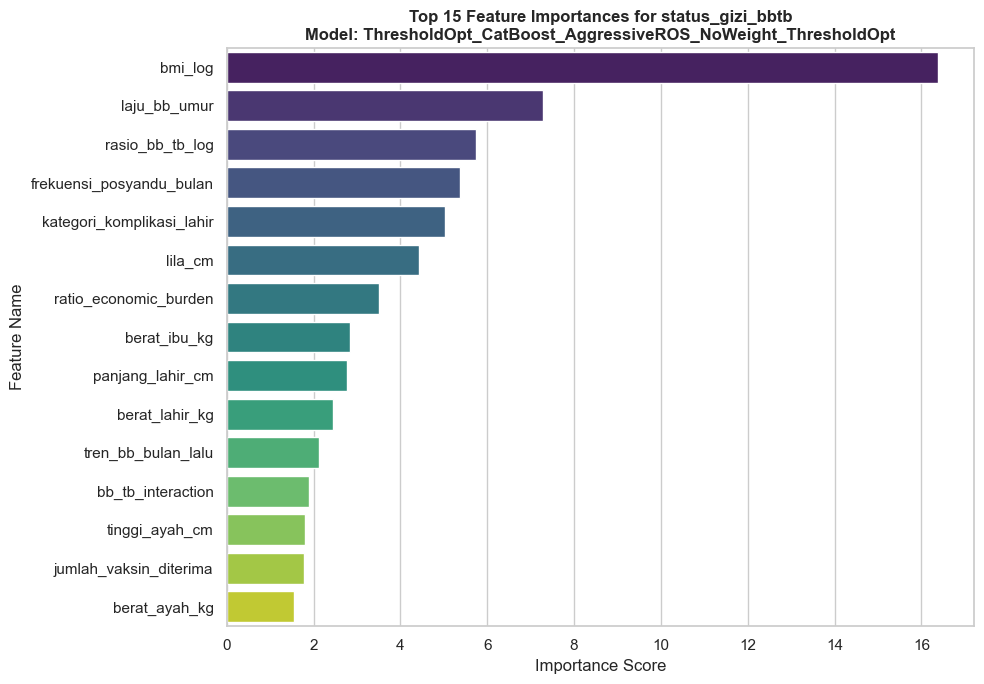


>>>>>>>>>> Target: status_gizi_bbu <<<<<<<<<<


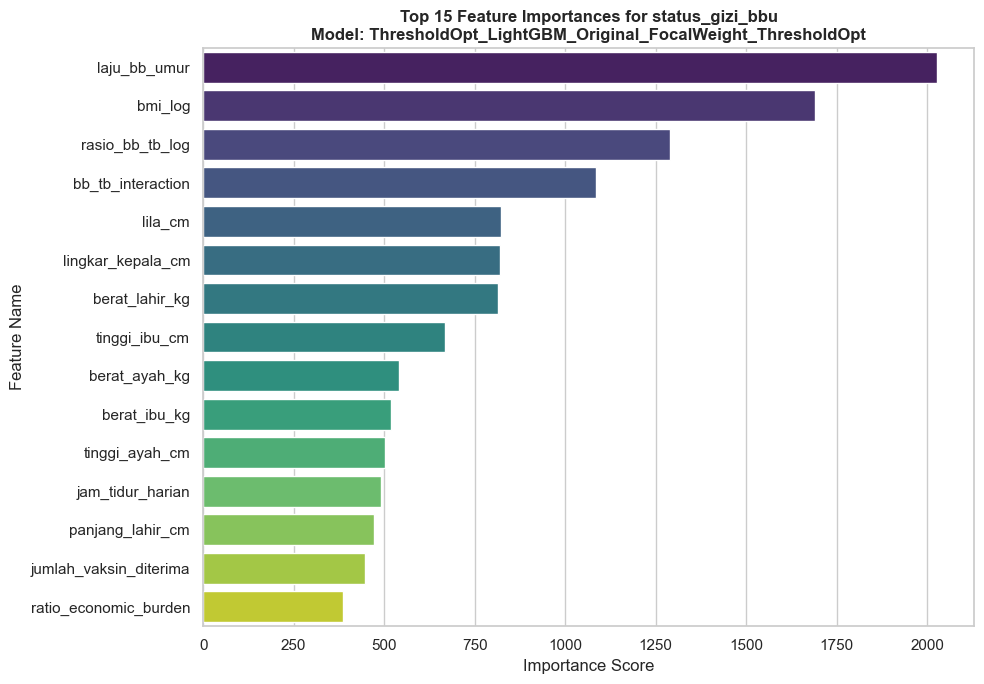


>>>>>>>>>> Target: status_gizi_tbu <<<<<<<<<<


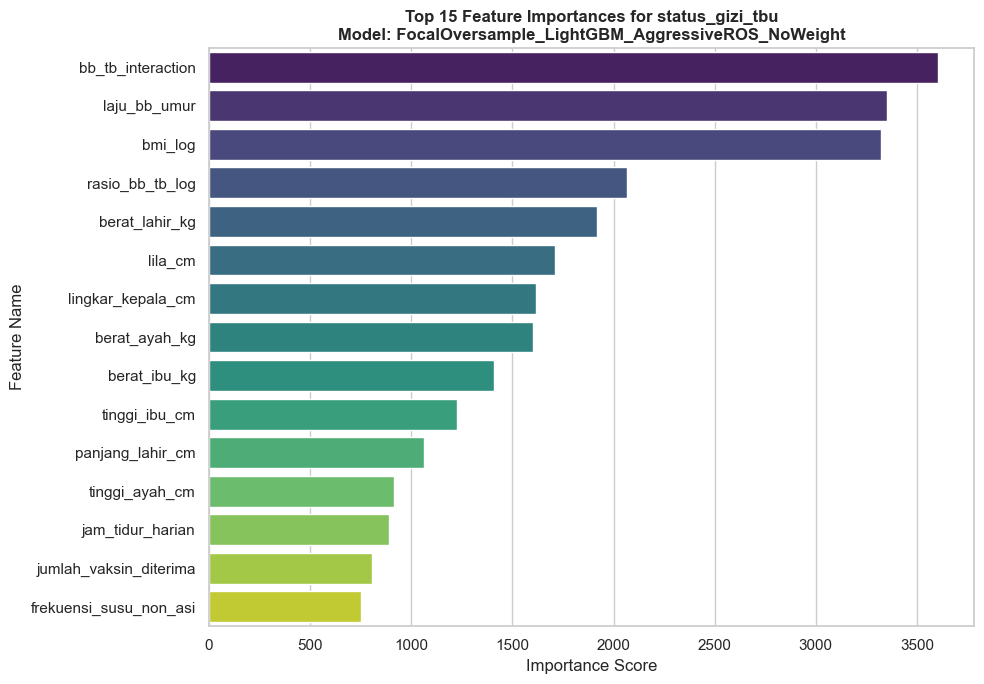


✓ Analisis Feature Importance Selesai.


In [70]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib # Import joblib for model loading if needed, though models are in memory

print('FEATURE IMPORTANCE ANALYSIS FOR BEST MODELS')
print('=' * 70)

G = globals() # Access global variables

# --- Helper functions (copying resolve_split_key from previous cells for self-containment) ---
def normalize_target_name(name):
    if name is None:
        return None
    n = str(name).strip()
    low = n.lower()
    if 'tbu' in low:
        return 'status_gizi_tbu'
    if 'bbtb' in low:
        return 'status_gizi_bbtb'
    if 'bbu' in low:
        return 'status_gizi_bbu'
    return n

def find_split_by_yname(target_name):
    # Check data_splits_enhanced first for consistency with latest training
    if 'data_splits_enhanced' in G:
        for k, v in G['data_splits_enhanced'].items():
            y_te = v.get('y_test')
            if getattr(y_te, 'name', None) == target_name:
                return k
            variations = v.get('train_variations', {})
            for _, pair in variations.items():
                if not isinstance(pair, (list, tuple)) or len(pair) != 2:
                    continue
                y_tr = pair[1]
                if getattr(y_tr, 'name', None) == target_name:
                    return k
    # Fallback to data_splits if not found in enhanced (though enhanced should be used)
    if 'data_splits' in G:
        for k, v in G['data_splits'].items():
            y_tr = v.get('y_train')
            y_te = v.get('y_test')
            if (getattr(y_tr, 'name', None) == target_name) or (getattr(y_te, 'name', None) == target_name):
                return k
    return None

def resolve_split_key(target_name_raw):
    target_name = normalize_target_name(target_name_raw)
    # 1) Direct match in enhanced
    if 'data_splits_enhanced' in G and target_name in G['data_splits_enhanced']:
        return target_name
    # 2) Fallback to data_splits if not in enhanced
    if 'data_splits' in G and target_name in G['data_splits']:
        return target_name
    # 3) Match via target_info (label -> column) - this might be redundant if previous steps were good
    if 'target_info' in G:
        target_info = G['target_info']
        if target_name_raw in target_info: # Use raw name for target_info key lookup
            col = target_info[target_name_raw].get('column', target_name_raw)
            if 'data_splits_enhanced' in G and col in G['data_splits_enhanced']:
                return col
            if 'data_splits' in G and col in G['data_splits']:
                return col
        # 4) Match when target_name is column, but splits keyed by label (TB/U, BB/TB, BB/U)
        for name, info in target_info.items():
            col = info.get('column')
            if col == target_name:
                if 'data_splits_enhanced' in G and name in G['data_splits_enhanced']:
                    return name
                if 'data_splits' in G and name in G['data_splits']:
                    return name
    # 5) Fallback by y.name
    return find_split_by_yname(target_name)

# Using the sanitize_lgbm_col_names function defined in a previous cell (7aLQiQIOlQdS)
# Copying it here to ensure this cell is self-contained and robust.
def sanitize_lgbm_col_names(df):
    if df is None: return None
    cols = df.columns
    new_cols = []
    seen = set()
    for c in cols:
        new_c = str(c).replace('[', '').replace(']', '').replace('<', '').replace(':', '').replace('?', '').replace(' ', '_').replace('(', '').replace(')', '').replace('/', '_').replace('-', '_')
        original_new_c = new_c
        counter = 0
        while new_c in seen:
            new_c = f"{original_new_c}_{counter}"
            counter += 1
        seen.add(new_c)
        new_cols.append(new_c)
    df_copy = df.copy()
    df_copy.columns = new_cols
    return df_copy
# --- End of helper functions ---

# Ensure best_models_final dictionary is available
if 'best_models_final' not in globals():
    print('[ERROR] Variabel `best_models_final` tidak ditemukan. Pastikan sel sebelumnya sudah dieksekusi.')
else:
    for target_name_raw, model_info in best_models_final.items(): # Use best_models_final
        target_name = normalize_target_name(target_name_raw)
        print(f"\n{'>'*10} Target: {target_name} {'<'*10}")

        # Access the actual model object from the 'metrics' dictionary
        model = model_info['metrics'].get('model')
        model_name = model_info['name']

        if model is None:
            print(f"  [WARNING] Model object for {model_name} not found in `best_models_final['{target_name_raw}']['metrics']`.")
            continue

        # Try to get feature importances
        feature_importances = None
        if hasattr(model, 'feature_importances_'):
            feature_importances = model.feature_importances_
        elif hasattr(model, 'coef_'):
            # For linear models, coef_ is used
            feature_importances = model.coef_[0] if model.coef_.ndim > 1 else model.coef_
            feature_importances = np.abs(feature_importances) # Use absolute value for linear models
        elif hasattr(model, 'get_feature_importance'): # CatBoost specific
            feature_importances = model.get_feature_importance()

        if feature_importances is not None and len(feature_importances) > 0:
            # Get feature names from the model first if available (preferred)
            feature_names = None
            if hasattr(model, 'feature_names_in_') and model.feature_names_in_ is not None:
                feature_names = list(model.feature_names_in_)
            elif hasattr(model, 'feature_name_') and model.feature_name_ is not None: # For LGBM
                feature_names = list(model.feature_name_)
            elif hasattr(model, 'get_booster') and hasattr(model.get_booster(), 'feature_names') and model.get_booster().feature_names is not None: # For XGBoost
                feature_names = list(model.get_booster().feature_names)

            # Fallback to X_train columns from data_splits_enhanced (original data)
            # Ensure the X_train used for this specific model is correctly identified and potentially sanitized
            if feature_names is None or len(feature_names) != len(feature_importances):
                print(f"  [INFO] Attempting to get feature names from training data for {model_name}.")
                split_key = resolve_split_key(target_name_raw)
                if split_key and 'data_splits_enhanced' in globals() and split_key in data_splits_enhanced:
                    # Get the X_train used for this particular model.
                    # Best models are typically from 'Original' variation in data_splits_enhanced with weights
                    # Or from specific SMOTE variants.
                    # It's safest to assume the original X_train was the base for feature extraction.
                    X_train_example = data_splits_enhanced[split_key]['train_variations']['Original'][0].copy()

                    # Sanitize these column names if the model is LGBM/XGBoost, as they were sanitized before training
                    if isinstance(model, (lgb.LGBMClassifier, xgb.XGBClassifier)) or "LightGBM" in model_name or "XGB" in model_name:
                        X_train_example = sanitize_lgbm_col_names(X_train_example)

                    feature_names = X_train_example.columns.tolist()
                else:
                    print(f"  [WARNING] Could not retrieve feature names from model or training data for {model_name}. Using generic indices.")
                    feature_names = [f'feature_{i}' for i in range(len(feature_importances))]

            if feature_names and len(feature_names) == len(feature_importances):
                df_importance = pd.DataFrame({
                    'Feature': feature_names,
                    'Importance': feature_importances
                })
                df_importance = df_importance.sort_values(by='Importance', ascending=False).head(15)

                if not df_importance.empty:
                    plt.figure(figsize=(10, 7))
                    sns.barplot(x='Importance', y='Feature', data=df_importance, palette='viridis')
                    plt.title(f'Top 15 Feature Importances for {target_name}\nModel: {model_name}', fontsize=12, fontweight='bold')
                    plt.xlabel('Importance Score')
                    plt.ylabel('Feature Name')
                    plt.tight_layout()
                    plt.show()
                else:
                    print(f"  [INFO] No significant importances to display for {model_name}.")
            else:
                print(f"  [WARNING] Mismatch in number of feature names ({len(feature_names) if feature_names else 0}) and importances ({len(feature_importances)}) for {model_name}. Skipping plot.")
        else:
            print(f"  [WARNING] Model {model_name} does not have 'feature_importances_', 'coef_', or 'get_feature_importance' attribute, or all importances are zero.")

print('\n' + '=' * 70)
print('✓ Analisis Feature Importance Selesai.')